In [1]:
import cv2
import glob
import matplotlib.pyplot as plt
import torch
import numpy as np
import torch
from scipy.spatial import procrustes
from utils import utils
from PIL import Image



In [2]:
horizontal = [
    True,False,False,True,
    True,False,False,True,
    
    True,True,False,False,
    True,True,False,False,
    
    False,False,False,False,
    False,False,False,False,
    
    False,True,True,True,
    False,True,True,True,
    
    True, True, False, True,
    True, True, False, True,
    
    False, True, True, True,
    False, True, True, True,

    True, True, True, True,
    True, True, True, True,
    
    True, False, True, False,
    True, False, True, False,
    
    True, True, True, True,
    True, True, True, True,
    
    True, False, False, True,
    True, False, False, True,
    
    True, False, False, False,
    True, False, False, False,
    
    False, False, True, False,
    False, False, True, False,
    
    True, True, True, True,
    True, True, True, True,
    
    False, True, False, True,
    False, True, False, True,
    
    False, False, True, False,
    False, False, True, False,
    
    False, True, True, False,
    False, True, True, False,
    
    False, True, False, True,
    False, True, False, True,
    
    False, False, True, False,
    False, False, True, False,
    
    True, True, False, True,
    True, True, False, True,
    
    True, True, True, False,
    True, True, True, False,
    
    False, True, True, False,
    False, True, True, False,
    
    False, True, False, True,
    False, True, False, True,
    
    True, True, True, True,
    True, True, True, True,
    
    True, False, True, False,
    True, False, True, False,
    
    True, False, True, True,
    True, False, True, True,
    
    True, False, False, True,
    True, False, False, True,
    
    False, True, False, True,
    False, True, False, True,
    
    False, False, False, True,
    False, False, False, True,
    
    True, True, True, False,
    True, True, True, False,
    
    False, True, False, True,
    False, True, False, True,
        
    True, True, True, True,
    True, True, True, True,
    
    False, False, True, True,
    False, False, True, True,
    
    False, False, True, False,
    False, False, True, False,
    
    False, True, False, False,
    False, True, False, False,
    
    True, False, False, True,
    True, False, False, True,
    
    False, False, True, False,
    False, False, True, False,
    
    False, False, True, True,
    False, False, True, True,
    
    True, True, True, True,
    True, True, True, True,
    
    True, False, True, False,
    True, False, True, False,
    
    True, True, False, False,
    True, True, False, False,
    
    False, True, False, True,
    False, True, False, True,
    
    True, True, True, False,
    True, True, True, False,
    
    True, False, True, True,
    True, False, True, True,
    
    True, False, True, False,
    True, False, True, False,
    
    True, True, False, True,
    True, True, False, True,
    
    False, False, False, False,
    False, False, False, False,
    
    False, True, True, True,
    False, True, True, True,
    
    True, False, True, False,
    True, False, True, False,
    
    False, True, False, True,
    False, True, False, True,
    
    True, True, False, False,
    True, True, False, False,
    
    False, True, True, False,
    False, True, True, False,
    
    False, False, True,
    False, False, True,
    
    
]

In [9]:
def evaluate(file_search='image_1', netV = 'v9', vertical=False):
    #file_search = 'image_59'
    r_img_1 = glob.glob('imagesReals_{}/*/{}.png'.format(netV, file_search))[0]
    r_part_img_1 = glob.glob('parte/{}.png'.format(file_search))[0]
    r_img_2 = glob.glob('imagesFake_{}/*/{}.png'.format(netV, file_search))[0]
    #print(r_img_1)
    img_1 = cv2.imread(r_img_1)
    img_2 = cv2.imread(r_img_2)
    img_3 = cv2.imread(r_part_img_1)
    #utils.plotTwoImages(img_1, img_2, ['Real', 'Fake'])
    img_1_part_1, img_1_part_2 = utils.segmentation(img_1, vertical)
    img_2_part_1, img_2_part_2 = utils.segmentation(img_2, vertical)
    #utils.plotTwoImages(img_1_part_1, img_1_part_2, ['Img 1 - Part 1', 'Img 1 - Part 2'])
    #utils.plotTwoImages(img_2_part_1, img_2_part_2, ['Img 2 - Part 1', 'Img  - Part 2'])
    landmarks_img_1 = utils.landmarks(cv2.cvtColor(img_1, cv2.COLOR_BGR2GRAY), 25)
    landmarks_img_2 = utils.landmarks(cv2.cvtColor(img_2, cv2.COLOR_BGR2GRAY), 25)
    landmarks_img_1_part_1 = utils.landmarks(img_1_part_1, 25)
    landmarks_img_1_part_2 = utils.landmarks(img_1_part_2, 25)
    landmarks_img_2_part_1 = utils.landmarks(img_2_part_1, 25)
    landmarks_img_2_part_2 = utils.landmarks(img_2_part_2, 25)
    

    if vertical:
        _, landmarks_img_1_part_1, _ = procrustes(true_mean_landmarks_img_1_part_1, landmarks_img_1_part_1)
        _, landmarks_img_2_part_1, _ = procrustes(true_mean_landmarks_img_2_part_1, landmarks_img_2_part_1)
        _, landmarks_img_1_part_2, _ = procrustes(true_mean_landmarks_img_1_part_2, landmarks_img_1_part_2)
        _, landmarks_img_2_part_2, _ = procrustes(true_mean_landmarks_img_2_part_2, landmarks_img_2_part_2)
    else:
        _, landmarks_img_1_part_1, _ = procrustes(false_mean_landmarks_img_1_part_1, landmarks_img_1_part_1)
        _, landmarks_img_2_part_1, _ = procrustes(false_mean_landmarks_img_2_part_1, landmarks_img_2_part_1)
        _, landmarks_img_1_part_2, _ = procrustes(false_mean_landmarks_img_1_part_2, landmarks_img_1_part_2)
        _, landmarks_img_2_part_2, _ = procrustes(false_mean_landmarks_img_2_part_2, landmarks_img_2_part_2)
        
        #landmarks_img_1, _ = procrustes(landmarks_img_1, landmarks_img_2)
        #landmarks_img_2, _ = procrustes(landmarks_img_2, landmarks_img_2)
        



    
    #landmarks_img_1_part_1,landmarks_img_2_part_1, _ = procrustes(landmarks_img_1_part_1, landmarks_img_2_part_1)
    #landmarks_img_1_part_2,landmarks_img_2_part_2, _ = procrustes(landmarks_img_1_part_2, landmarks_img_2_part_2)
    #landmarks_img_1,landmarks_img_2, _ = procrustes(landmarks_img_1, landmarks_img_2)

    diff_imgs = torch.sqrt(torch.nn.functional.mse_loss(torch.Tensor(landmarks_img_1), 
                                 torch.Tensor(landmarks_img_2)))

    diff_imgs_part_1 = torch.sqrt(torch.nn.functional.mse_loss(torch.Tensor(landmarks_img_1_part_1), 
                                 torch.Tensor(landmarks_img_2_part_1)))

    diff_imgs_part_2 = torch.sqrt(torch.nn.functional.mse_loss(torch.Tensor(landmarks_img_1_part_2), 
                                 torch.Tensor(landmarks_img_2_part_2)))


    #landmarks_img_1 = landmarks_img_1 * -1
    landmarks_img_1[:, 1] = landmarks_img_1[:, 1] * -1
    landmarks_img_2[:, 1] = landmarks_img_2[:, 1] * -1
    #utils.plotLandmarks2(landmarks_img_1, landmarks_img_2, ['{} - Img - 1'.format(netV), 'Img -2', 'RMSE {}'.format(diff_imgs)])
    
    #landmarks_img_1_part_1 = landmarks_img_1_part_1 * -1
    #landmarks_img_2_part_1 = landmarks_img_2_part_1 * -1

    landmarks_img_1_part_1[:, 1] = landmarks_img_1_part_1[:, 1] * -1
    landmarks_img_2_part_1[:, 1] = landmarks_img_2_part_1[:, 1] * -1
    #utils.plotLandmarks2(landmarks_img_1_part_1, landmarks_img_2_part_1, ['Real - 1 - Part 1', 'Fake -2 - Part 1', 'RMSE {}'.format(diff_imgs_part_1)])
    #plt.savefig('{}_part_1_{}.png'.format(file_search, netV), bbox_inches='tight',  dpi=300)

    landmarks_img_1_part_2[:, 1] = landmarks_img_1_part_2[:, 1] * -1
    landmarks_img_2_part_2[:, 1] = landmarks_img_2_part_2[:, 1] * -1
    
    utils.plotLandmarksALL(img_3, img_2, landmarks_img_1_part_1, landmarks_img_2_part_1, landmarks_img_1_part_2, landmarks_img_2_part_2, ['Base {:0.4f}'.format(diff_imgs_part_1), 'Tope {:0.4f}'.format(diff_imgs_part_2)])
    
    #utils.plotLandmarks2(landmarks_img_1_part_2, landmarks_img_2_part_2, ['Real - 1 - Part 2', 'Fake -2 - Part 2', 'RMSE {}'.format(diff_imgs_part_2)])
    plt.savefig('land_fig/{}_{}.png'.format(file_search, netV), bbox_inches='tight',  dpi=300)
    #return landmarks_img_1_part_1, landmarks_img_2_part_1, landmarks_img_1_part_2, landmarks_img_2_part_2

In [10]:
horizontal[0],horizontal[1] 

(True, False)

<Figure size 864x360 with 0 Axes>

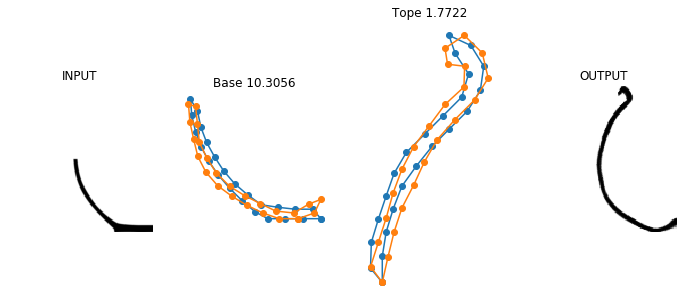

<Figure size 864x360 with 0 Axes>

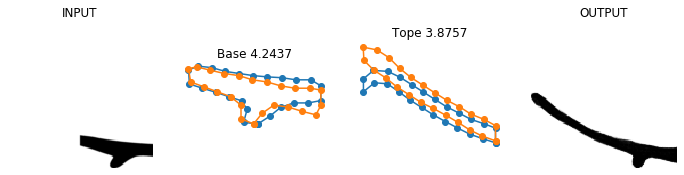

In [11]:
#true_mean_landmarks_img_1_part_1, true_mean_landmarks_img_2_part_1, true_mean_landmarks_img_1_part_2, true_mean_landmarks_img_2_part_2 =  evaluate('image_{}'.format(0), r , vertical=horizontal[0])
#false_mean_landmarks_img_1_part_1, false_mean_landmarks_img_2_part_1, false_mean_landmarks_img_1_part_2, false_mean_landmarks_img_2_part_2 =  evaluate('image_{}'.format(1), r , vertical=horizontal[1])

/home/pablo/Codigo/pottery_encode/utils/utils.py:261: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(12,5))
/home/pablo/Codigo/pottery_encode/utils/utils.py:262: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, (ax0, ax1, ax2, ax3) = plt.subplots(1, 4, figsize=(12,5))
/home/pablo/Codigo/pottery_encode/utils/utils.py:261: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To con

<Figure size 864x360 with 0 Axes>

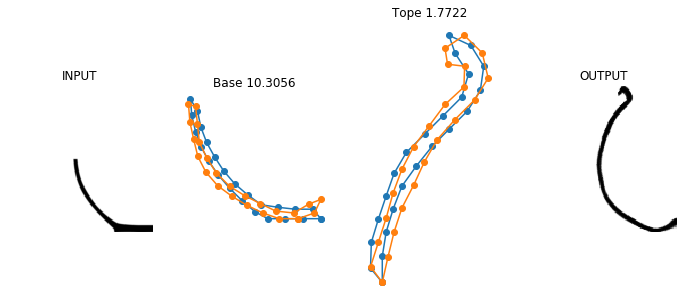

<Figure size 864x360 with 0 Axes>

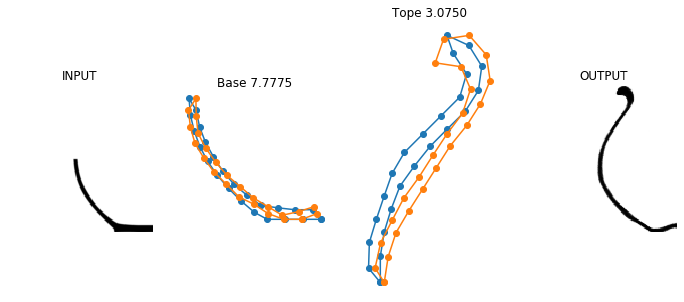

<Figure size 864x360 with 0 Axes>

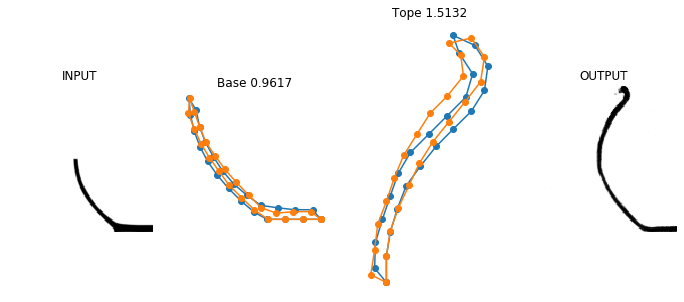

<Figure size 864x360 with 0 Axes>

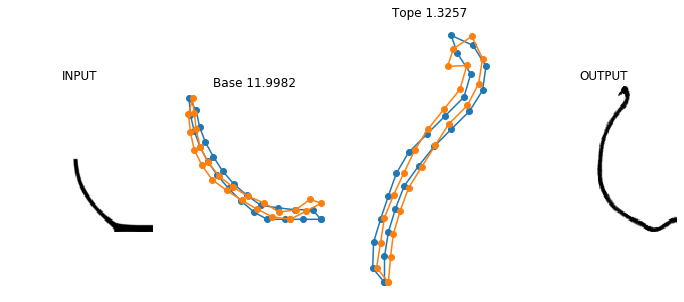

<Figure size 864x360 with 0 Axes>

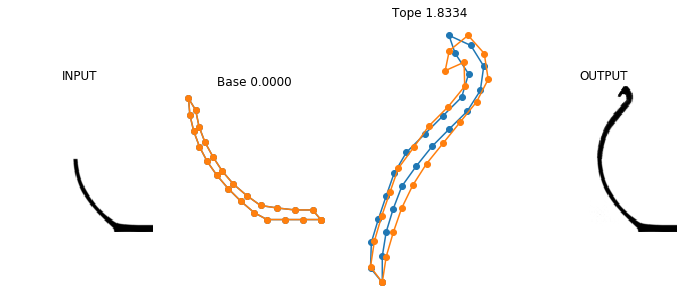

<Figure size 864x360 with 0 Axes>

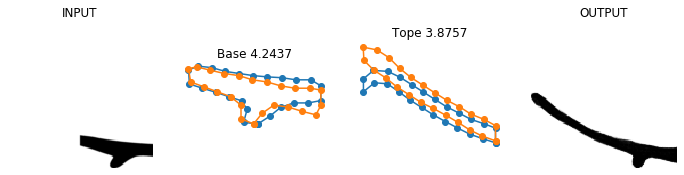

<Figure size 864x360 with 0 Axes>

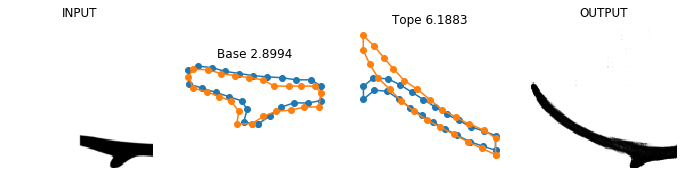

<Figure size 864x360 with 0 Axes>

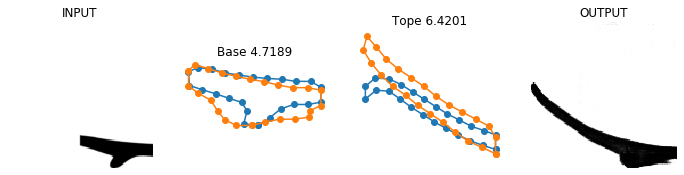

<Figure size 864x360 with 0 Axes>

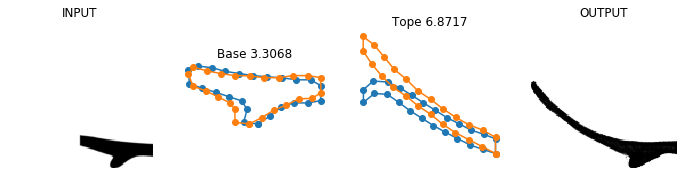

<Figure size 864x360 with 0 Axes>

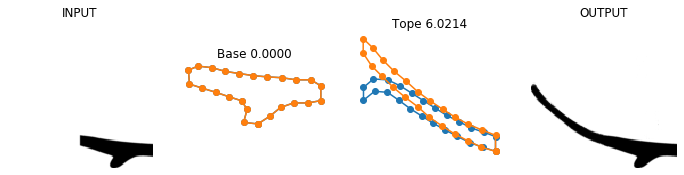

<Figure size 864x360 with 0 Axes>

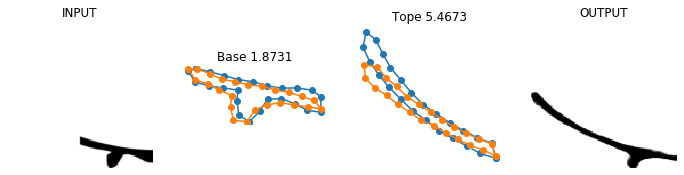

<Figure size 864x360 with 0 Axes>

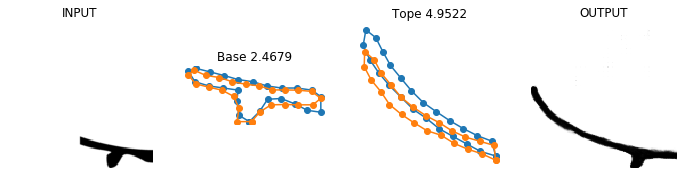

<Figure size 864x360 with 0 Axes>

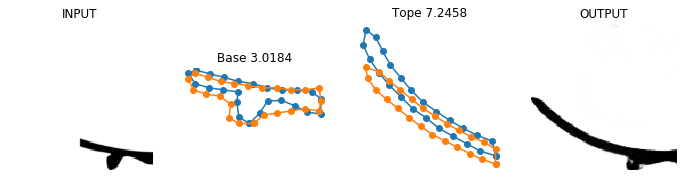

<Figure size 864x360 with 0 Axes>

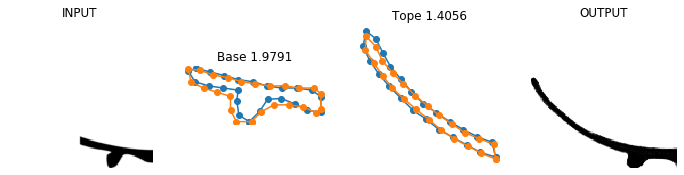

<Figure size 864x360 with 0 Axes>

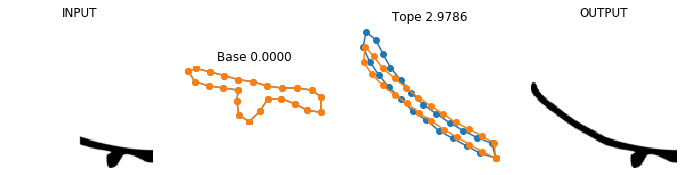

<Figure size 864x360 with 0 Axes>

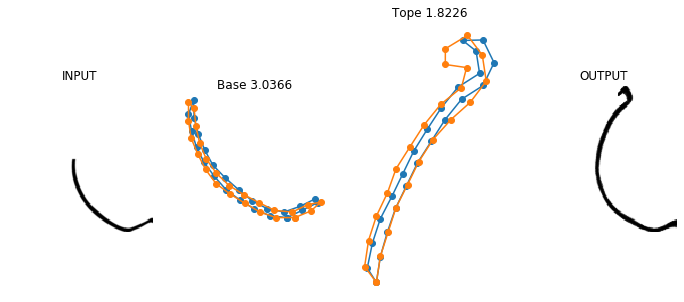

<Figure size 864x360 with 0 Axes>

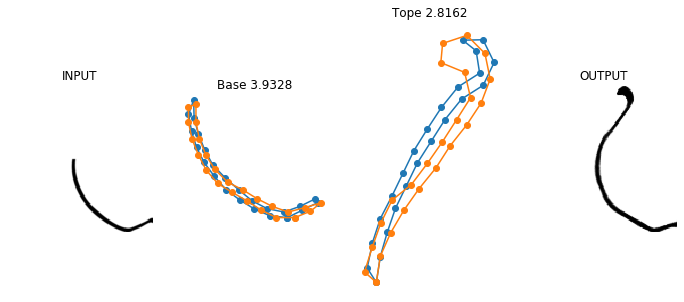

<Figure size 864x360 with 0 Axes>

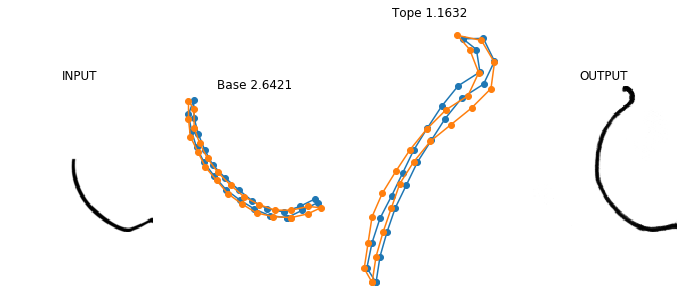

<Figure size 864x360 with 0 Axes>

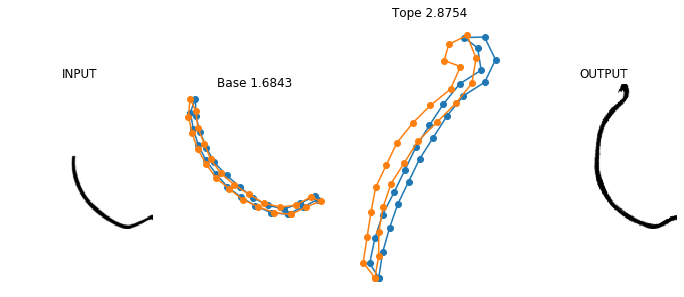

<Figure size 864x360 with 0 Axes>

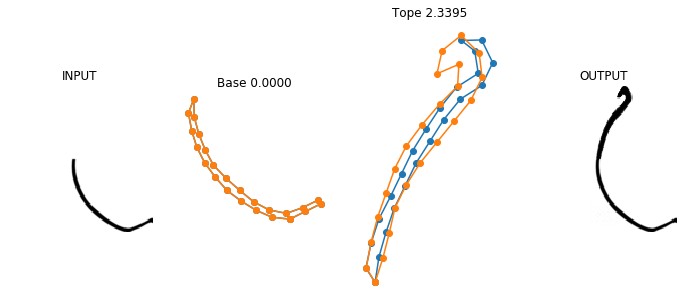

<Figure size 864x360 with 0 Axes>

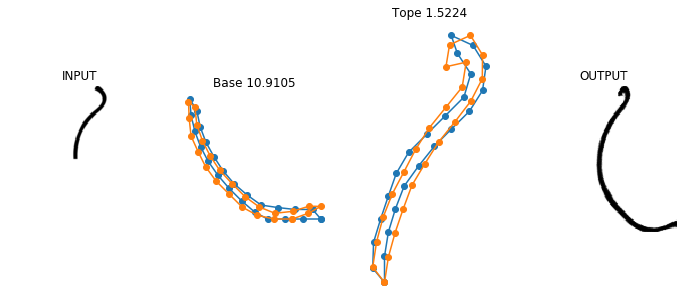

<Figure size 864x360 with 0 Axes>

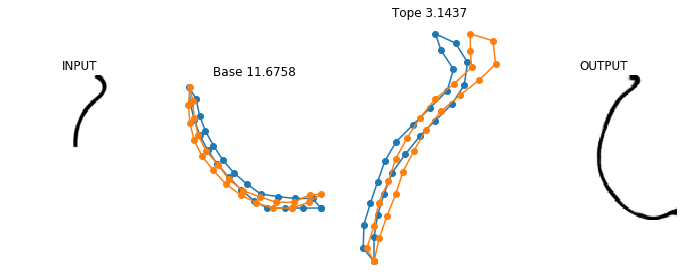

<Figure size 864x360 with 0 Axes>

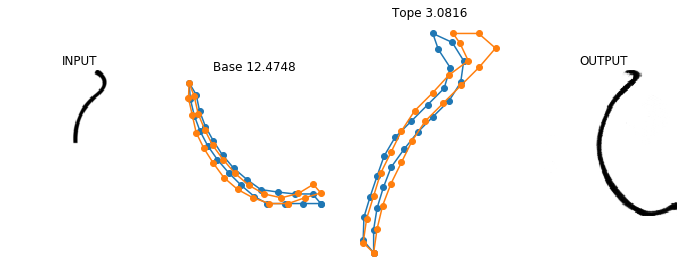

<Figure size 864x360 with 0 Axes>

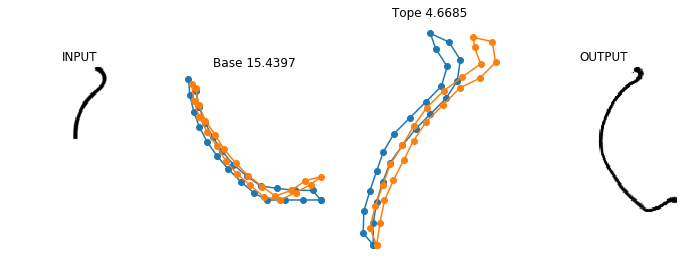

<Figure size 864x360 with 0 Axes>

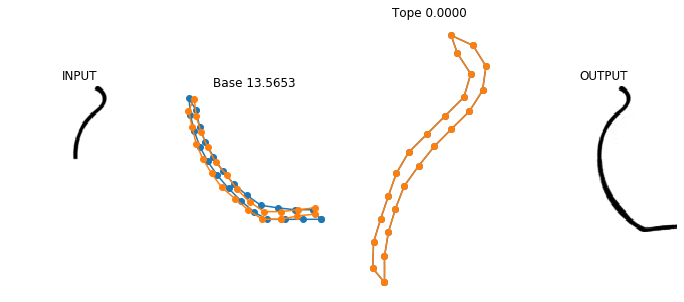

<Figure size 864x360 with 0 Axes>

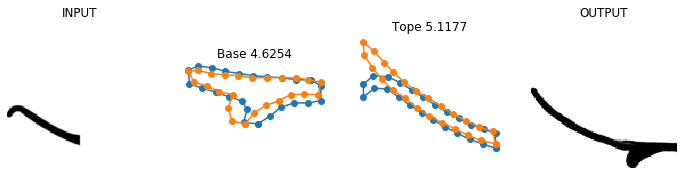

<Figure size 864x360 with 0 Axes>

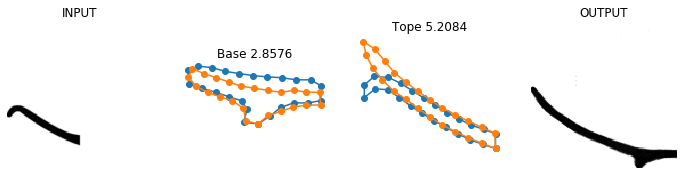

<Figure size 864x360 with 0 Axes>

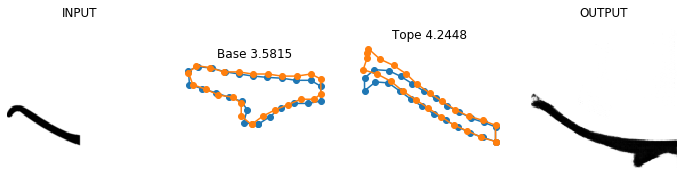

<Figure size 864x360 with 0 Axes>

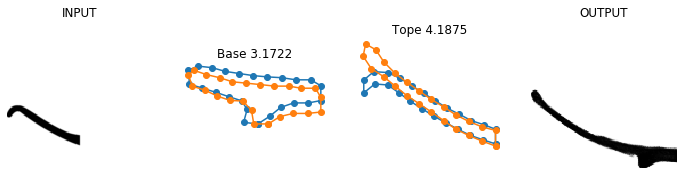

<Figure size 864x360 with 0 Axes>

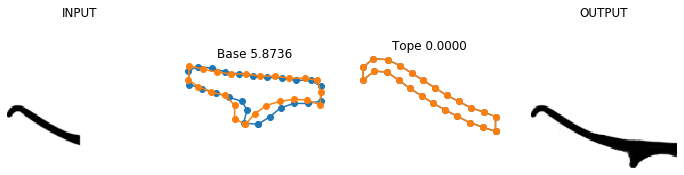

<Figure size 864x360 with 0 Axes>

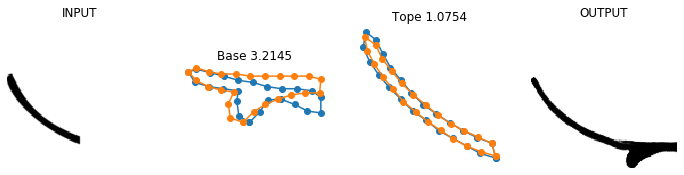

<Figure size 864x360 with 0 Axes>

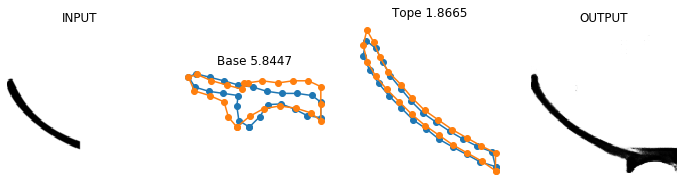

<Figure size 864x360 with 0 Axes>

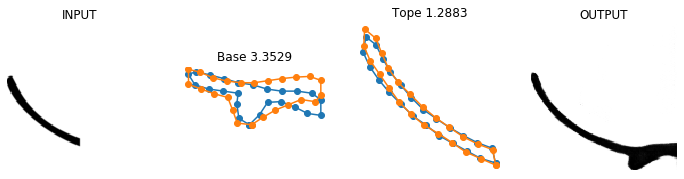

<Figure size 864x360 with 0 Axes>

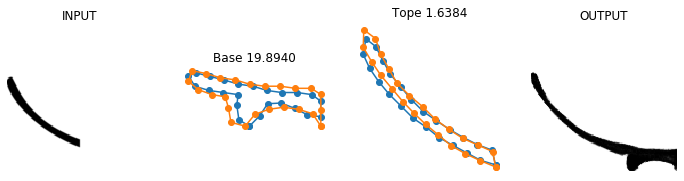

<Figure size 864x360 with 0 Axes>

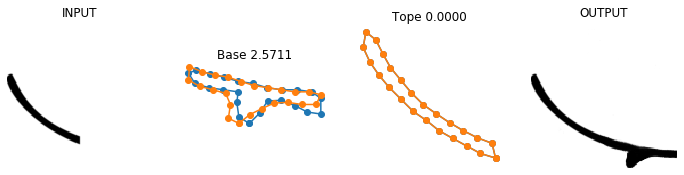

<Figure size 864x360 with 0 Axes>

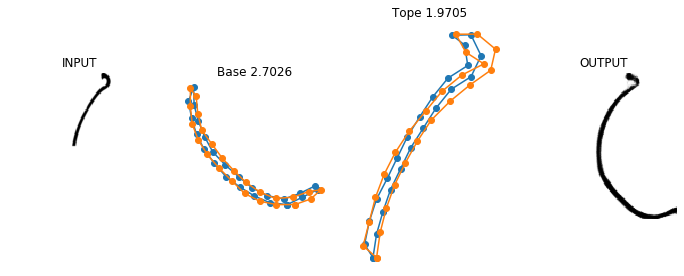

<Figure size 864x360 with 0 Axes>

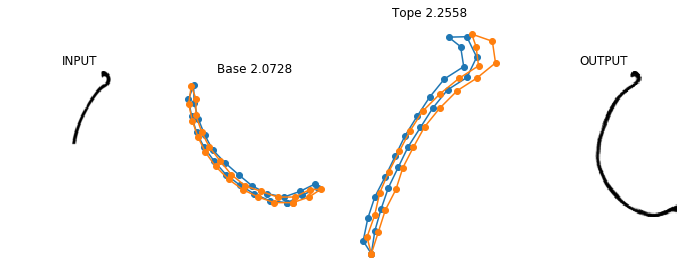

<Figure size 864x360 with 0 Axes>

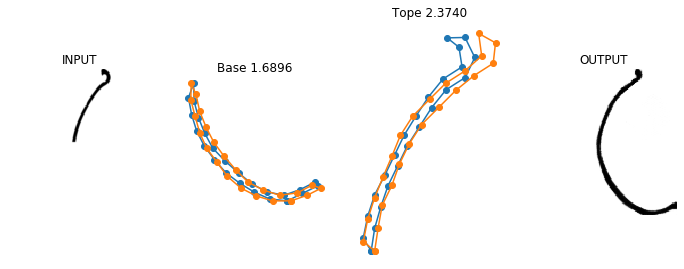

<Figure size 864x360 with 0 Axes>

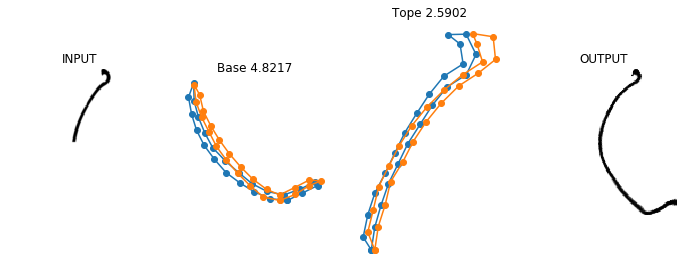

<Figure size 864x360 with 0 Axes>

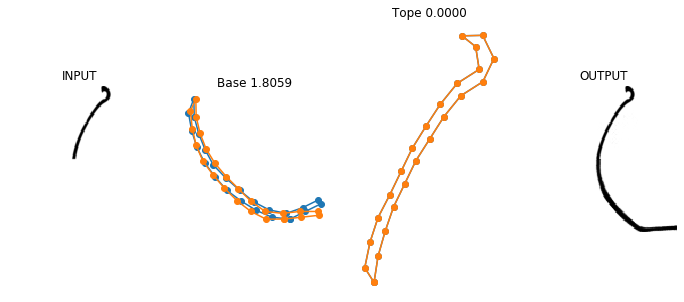

<Figure size 864x360 with 0 Axes>

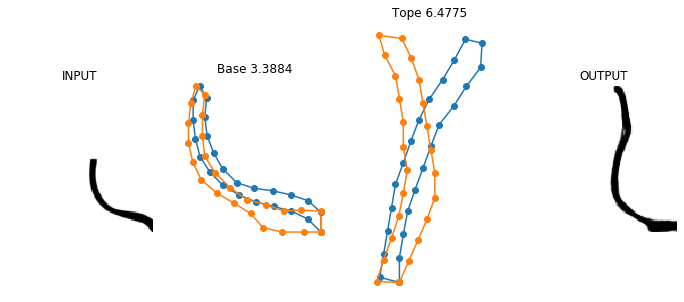

<Figure size 864x360 with 0 Axes>

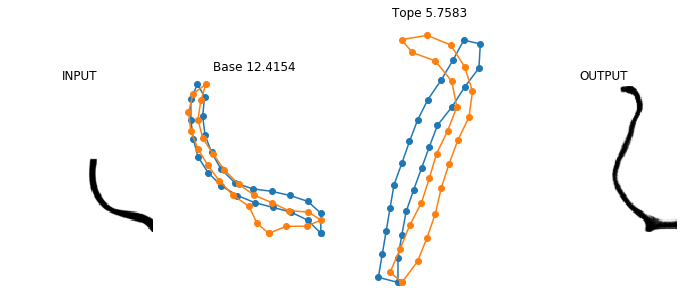

<Figure size 864x360 with 0 Axes>

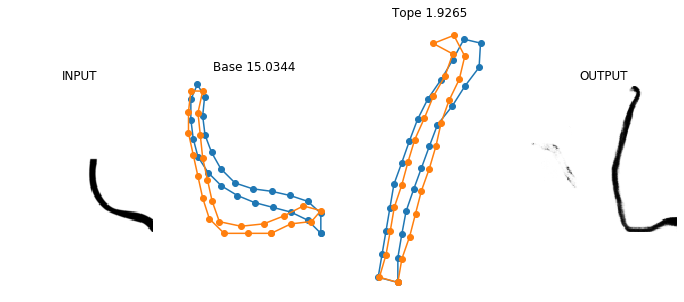

<Figure size 864x360 with 0 Axes>

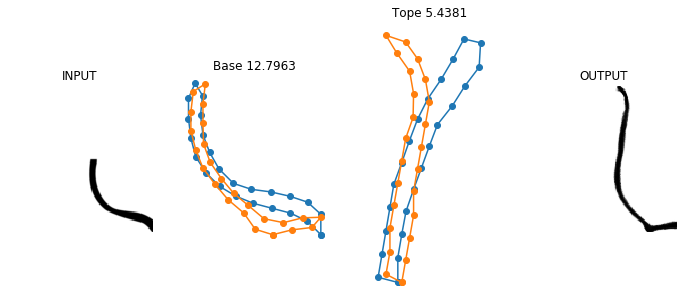

<Figure size 864x360 with 0 Axes>

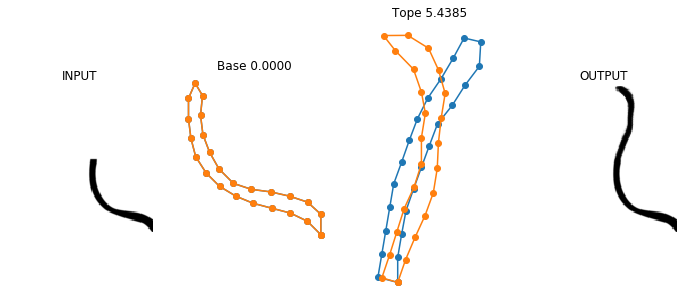

<Figure size 864x360 with 0 Axes>

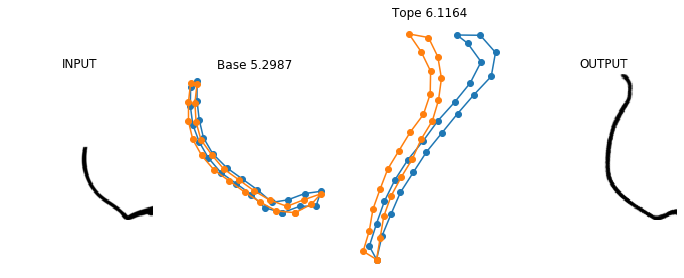

<Figure size 864x360 with 0 Axes>

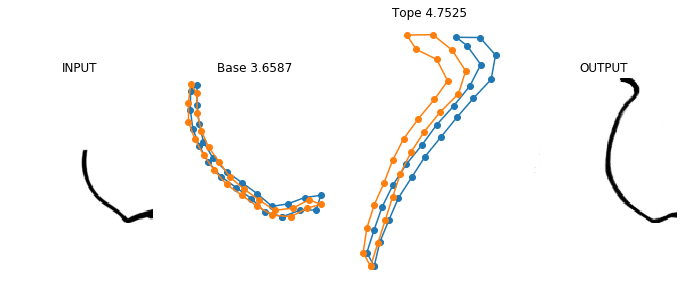

<Figure size 864x360 with 0 Axes>

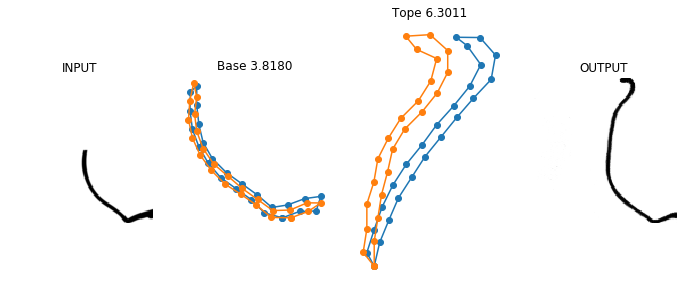

<Figure size 864x360 with 0 Axes>

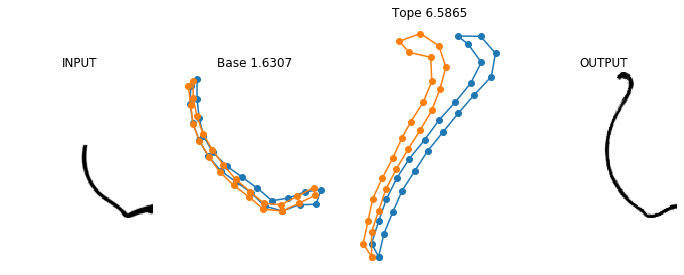

<Figure size 864x360 with 0 Axes>

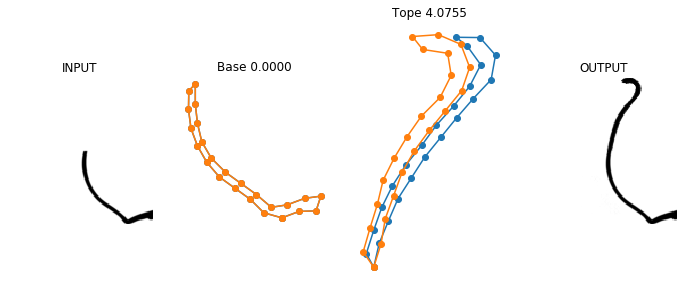

<Figure size 864x360 with 0 Axes>

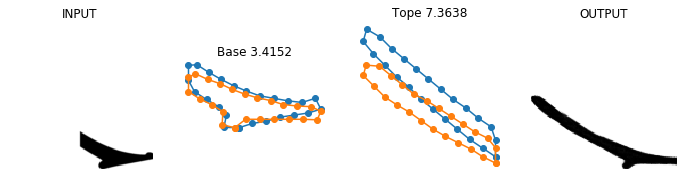

<Figure size 864x360 with 0 Axes>

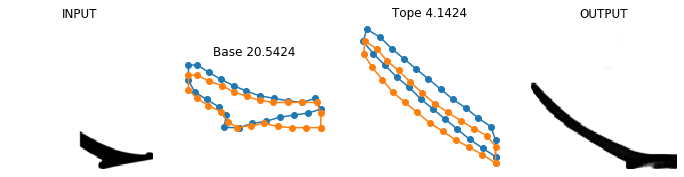

<Figure size 864x360 with 0 Axes>

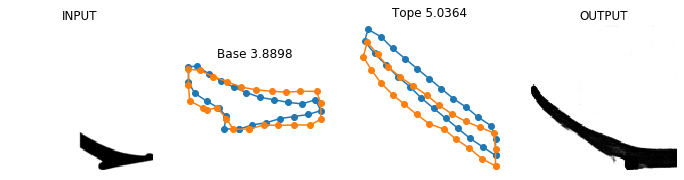

<Figure size 864x360 with 0 Axes>

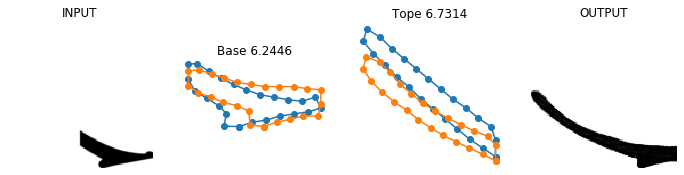

<Figure size 864x360 with 0 Axes>

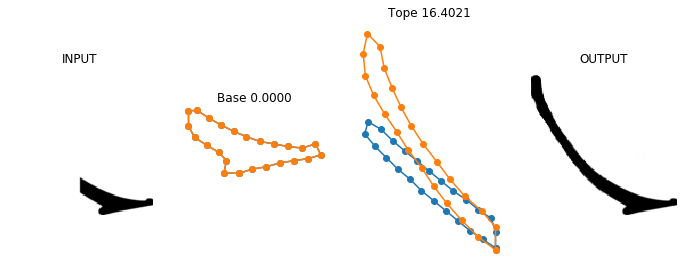

<Figure size 864x360 with 0 Axes>

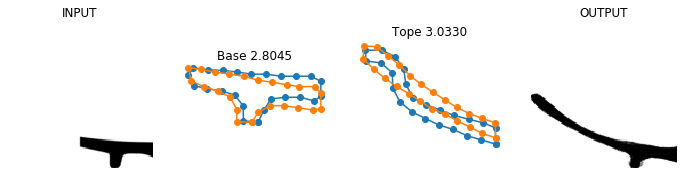

<Figure size 864x360 with 0 Axes>

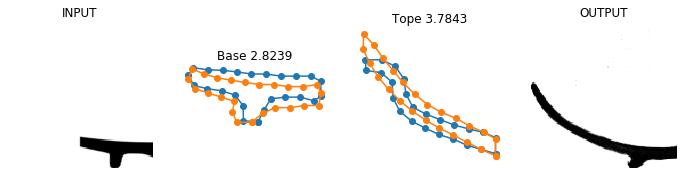

<Figure size 864x360 with 0 Axes>

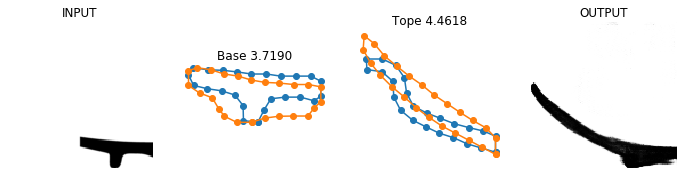

<Figure size 864x360 with 0 Axes>

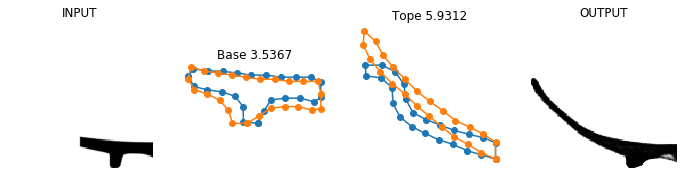

<Figure size 864x360 with 0 Axes>

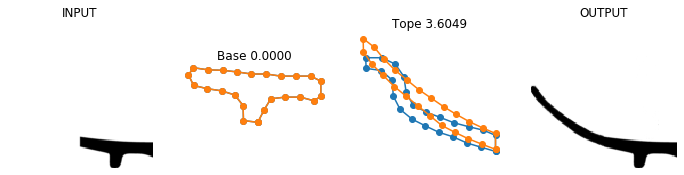

<Figure size 864x360 with 0 Axes>

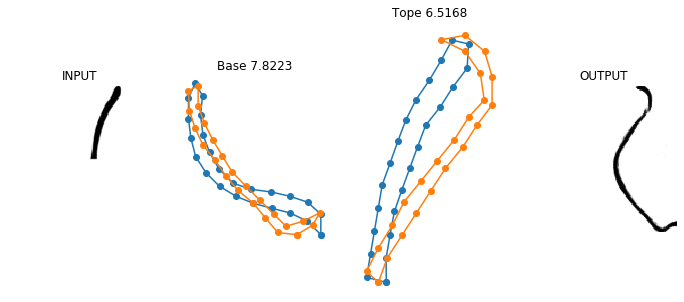

<Figure size 864x360 with 0 Axes>

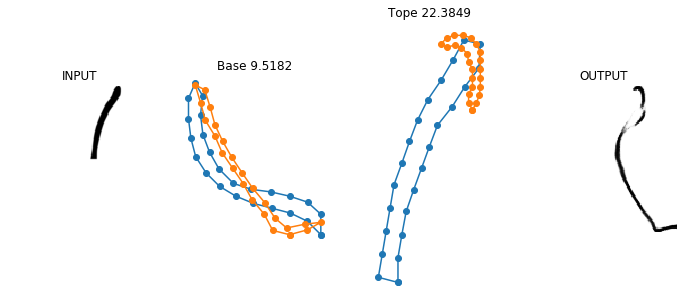

<Figure size 864x360 with 0 Axes>

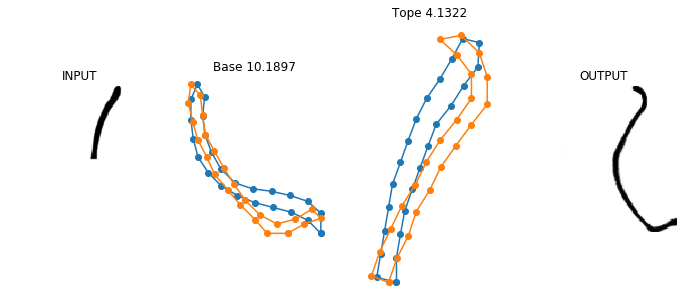

<Figure size 864x360 with 0 Axes>

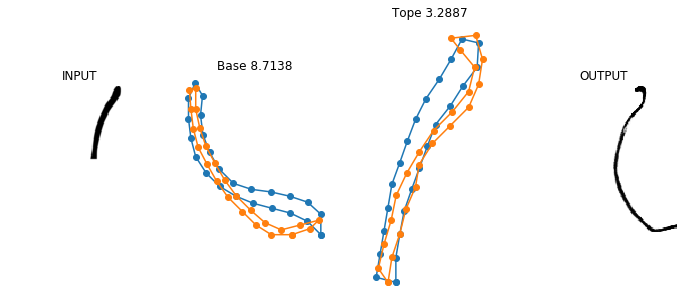

<Figure size 864x360 with 0 Axes>

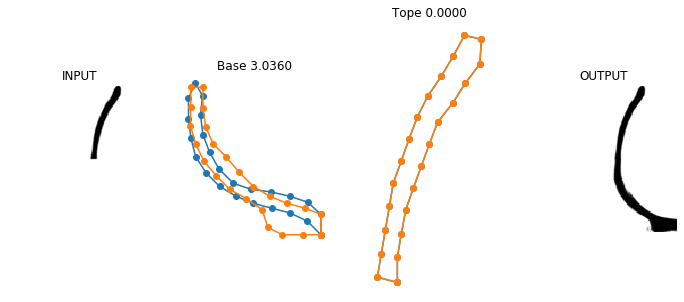

<Figure size 864x360 with 0 Axes>

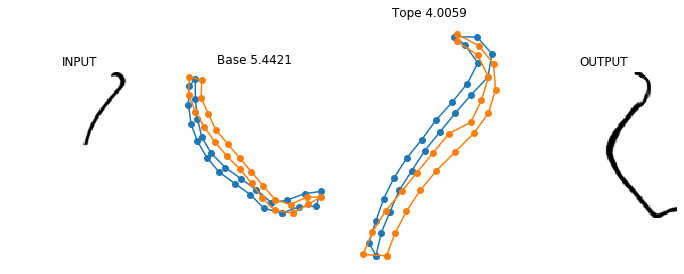

<Figure size 864x360 with 0 Axes>

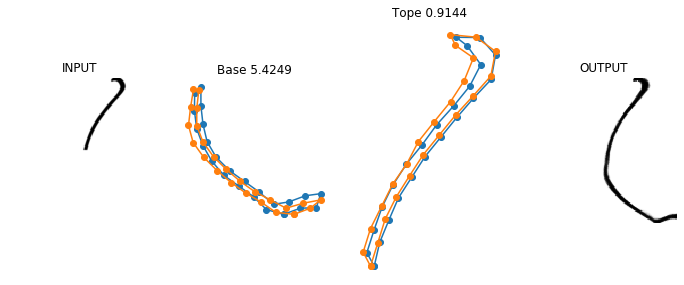

<Figure size 864x360 with 0 Axes>

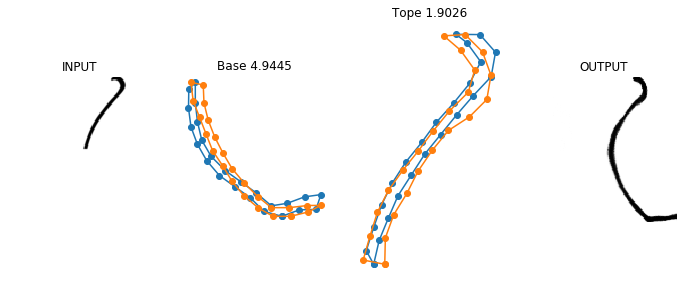

<Figure size 864x360 with 0 Axes>

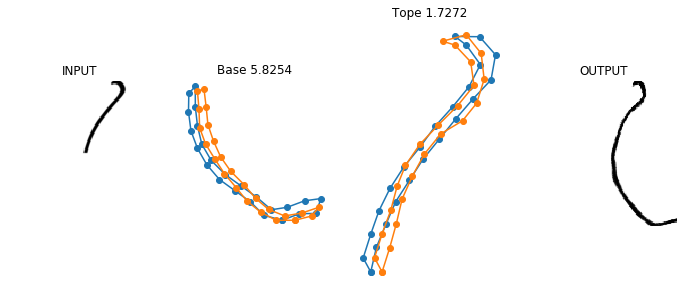

<Figure size 864x360 with 0 Axes>

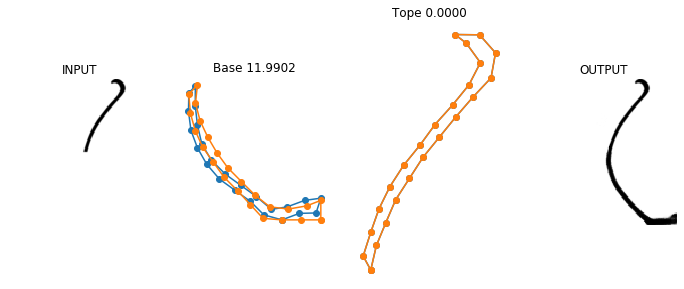

<Figure size 864x360 with 0 Axes>

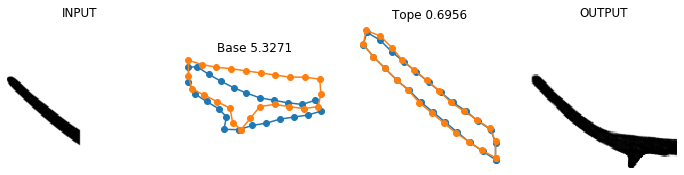

<Figure size 864x360 with 0 Axes>

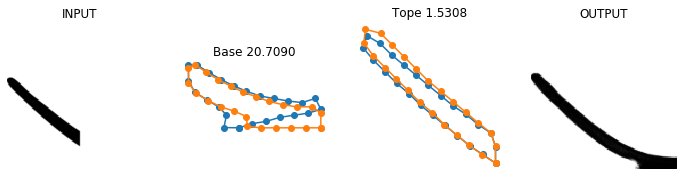

<Figure size 864x360 with 0 Axes>

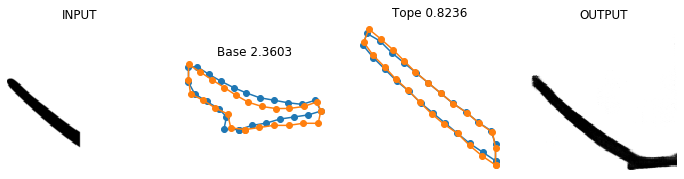

<Figure size 864x360 with 0 Axes>

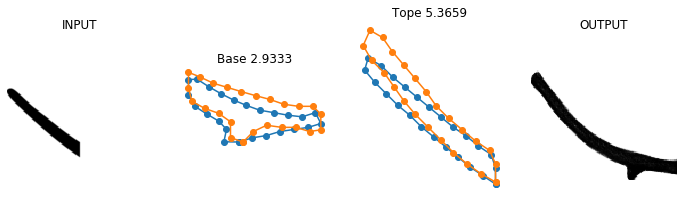

<Figure size 864x360 with 0 Axes>

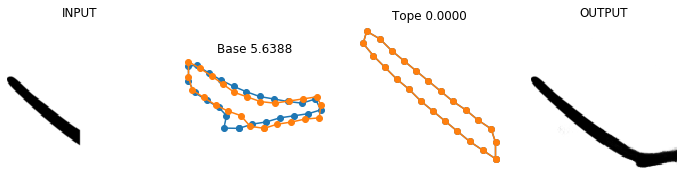

<Figure size 864x360 with 0 Axes>

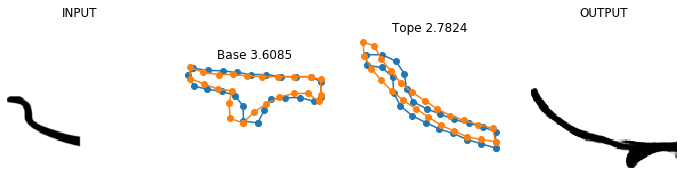

<Figure size 864x360 with 0 Axes>

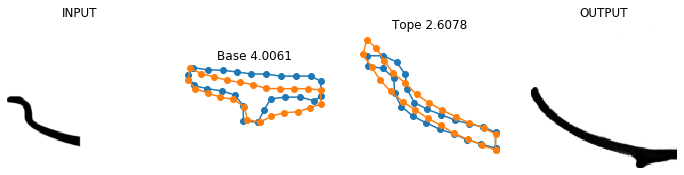

<Figure size 864x360 with 0 Axes>

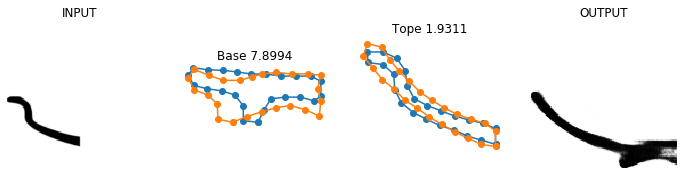

<Figure size 864x360 with 0 Axes>

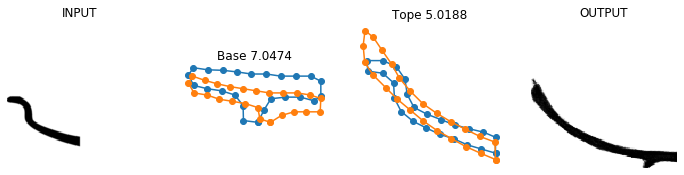

<Figure size 864x360 with 0 Axes>

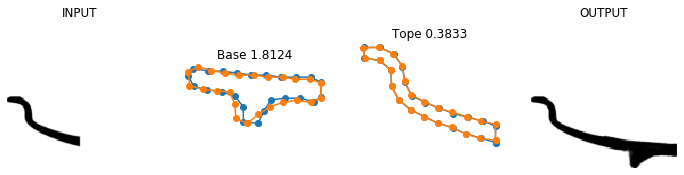

<Figure size 864x360 with 0 Axes>

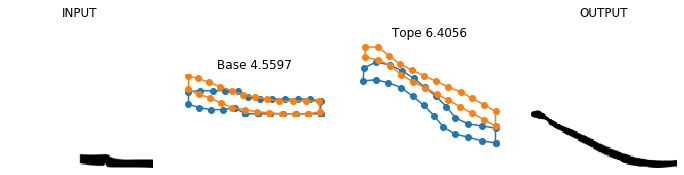

<Figure size 864x360 with 0 Axes>

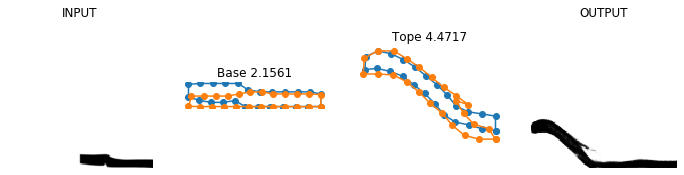

<Figure size 864x360 with 0 Axes>

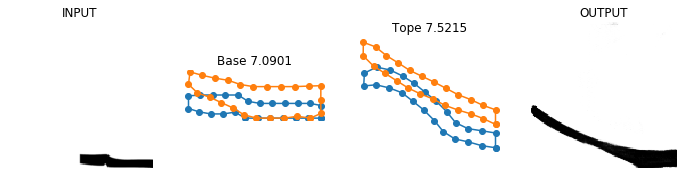

<Figure size 864x360 with 0 Axes>

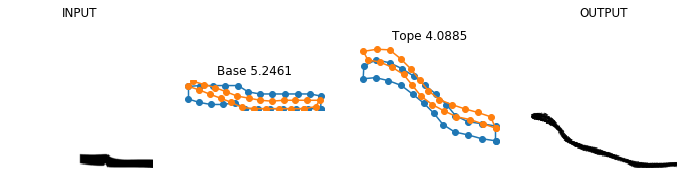

<Figure size 864x360 with 0 Axes>

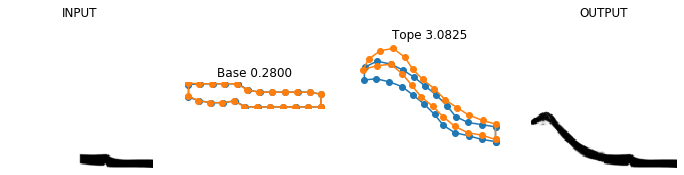

<Figure size 864x360 with 0 Axes>

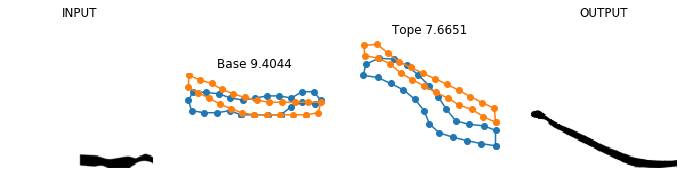

<Figure size 864x360 with 0 Axes>

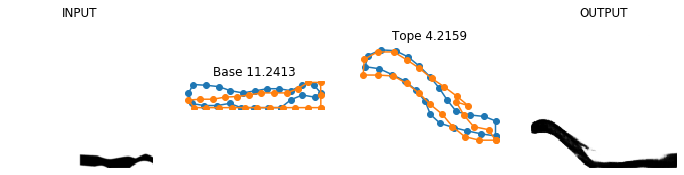

<Figure size 864x360 with 0 Axes>

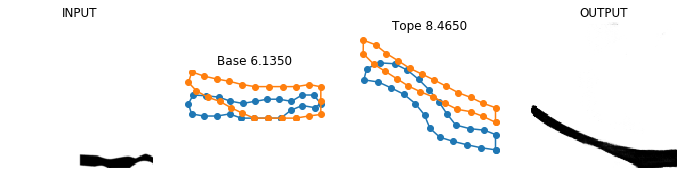

<Figure size 864x360 with 0 Axes>

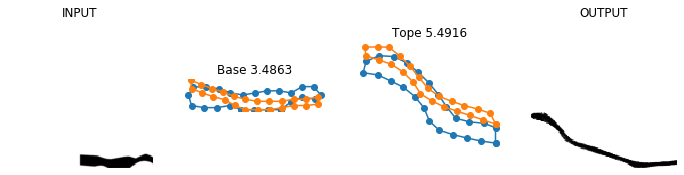

<Figure size 864x360 with 0 Axes>

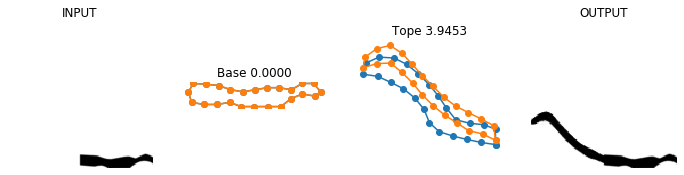

<Figure size 864x360 with 0 Axes>

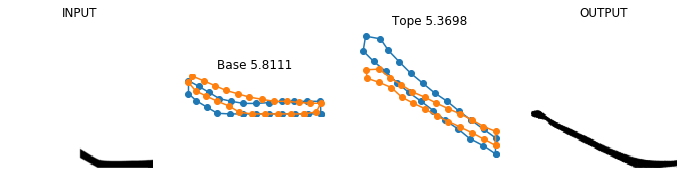

<Figure size 864x360 with 0 Axes>

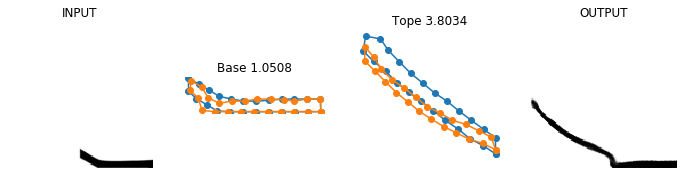

<Figure size 864x360 with 0 Axes>

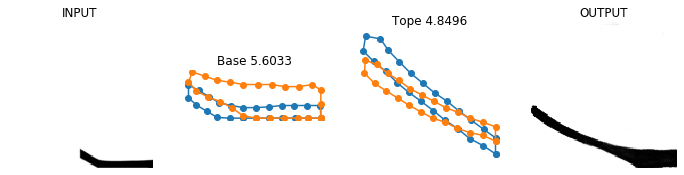

<Figure size 864x360 with 0 Axes>

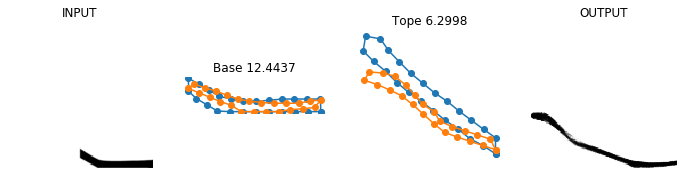

<Figure size 864x360 with 0 Axes>

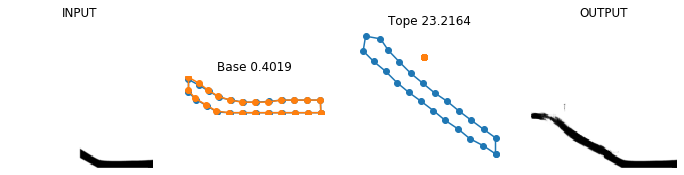

<Figure size 864x360 with 0 Axes>

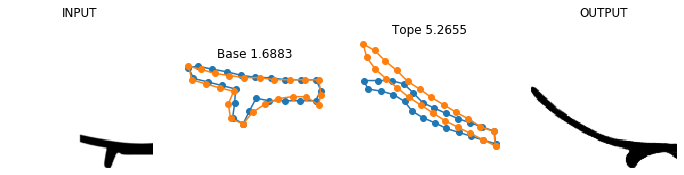

<Figure size 864x360 with 0 Axes>

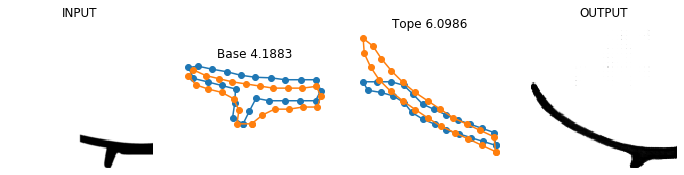

<Figure size 864x360 with 0 Axes>

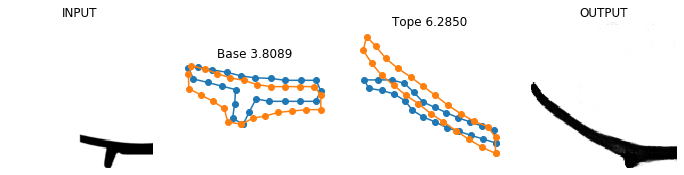

<Figure size 864x360 with 0 Axes>

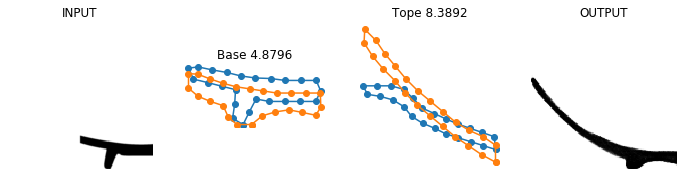

<Figure size 864x360 with 0 Axes>

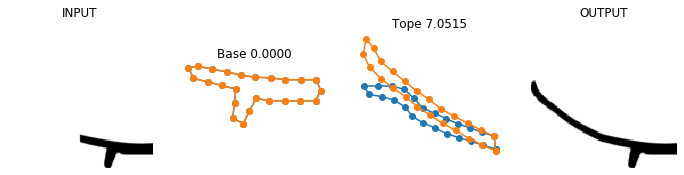

<Figure size 864x360 with 0 Axes>

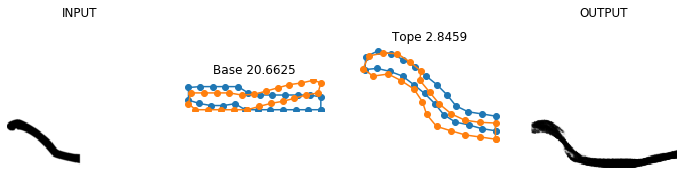

<Figure size 864x360 with 0 Axes>

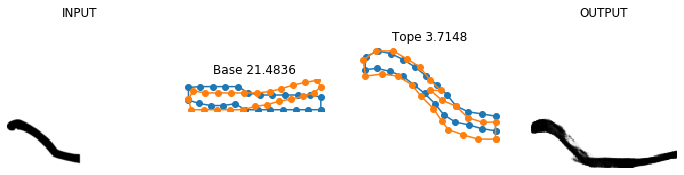

<Figure size 864x360 with 0 Axes>

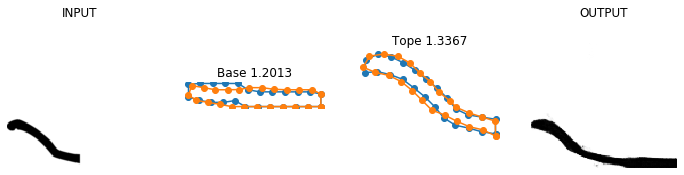

<Figure size 864x360 with 0 Axes>

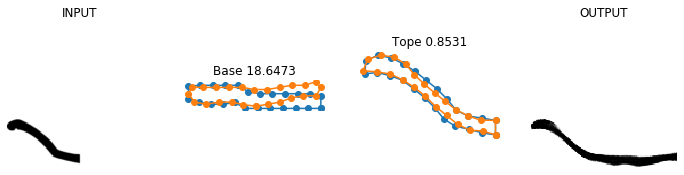

<Figure size 864x360 with 0 Axes>

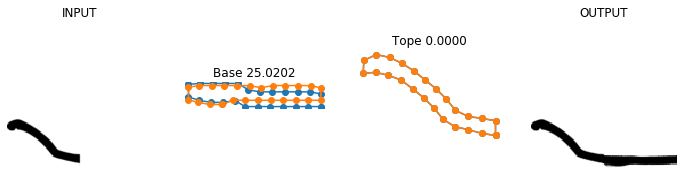

<Figure size 864x360 with 0 Axes>

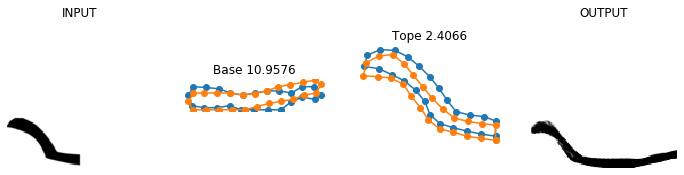

<Figure size 864x360 with 0 Axes>

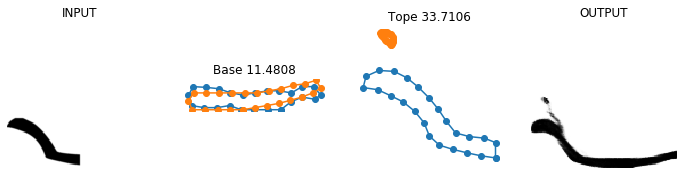

<Figure size 864x360 with 0 Axes>

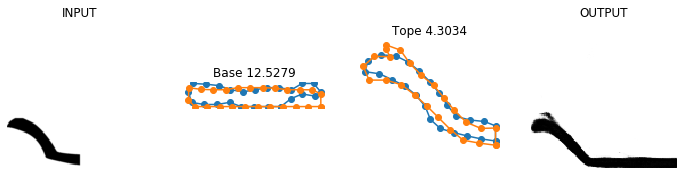

<Figure size 864x360 with 0 Axes>

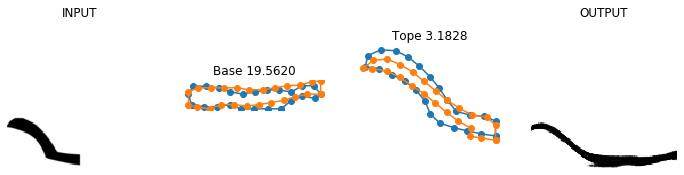

<Figure size 864x360 with 0 Axes>

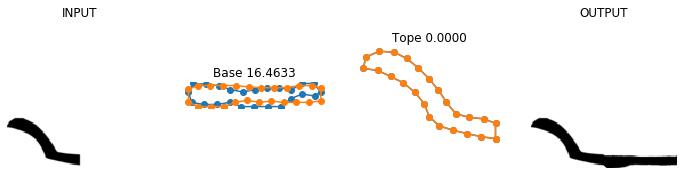

<Figure size 864x360 with 0 Axes>

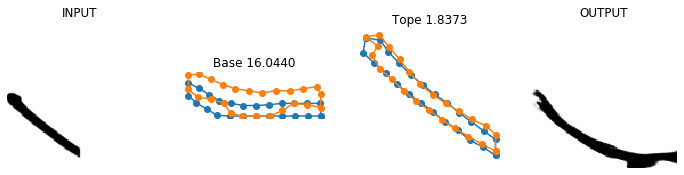

<Figure size 864x360 with 0 Axes>

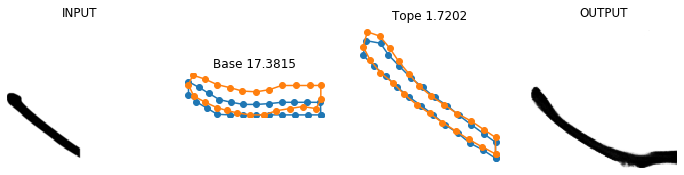

<Figure size 864x360 with 0 Axes>

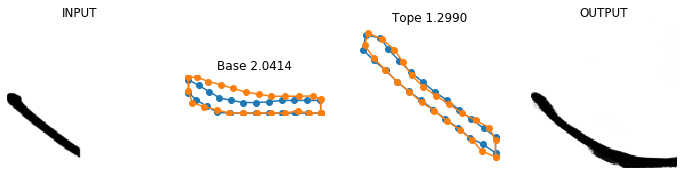

<Figure size 864x360 with 0 Axes>

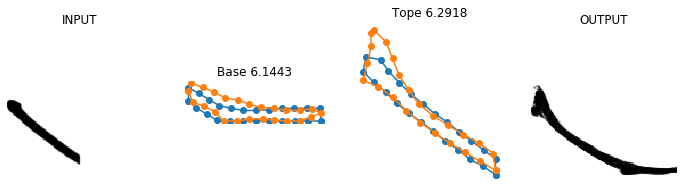

<Figure size 864x360 with 0 Axes>

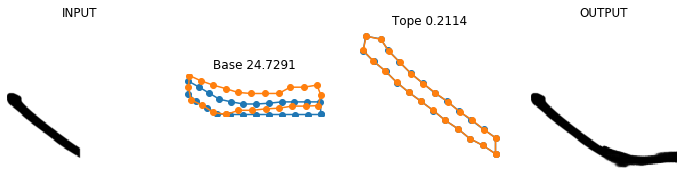

<Figure size 864x360 with 0 Axes>

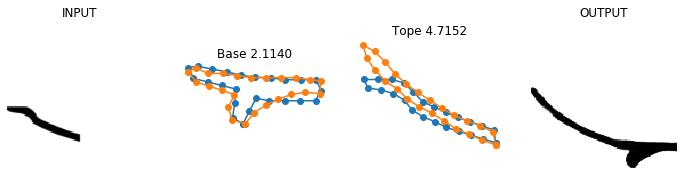

<Figure size 864x360 with 0 Axes>

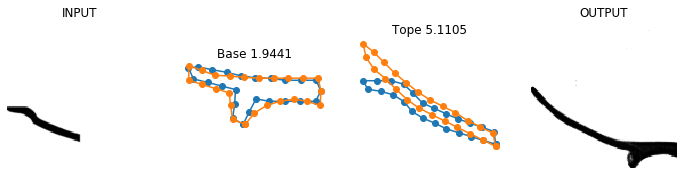

<Figure size 864x360 with 0 Axes>

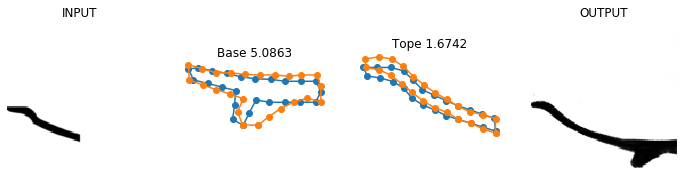

<Figure size 864x360 with 0 Axes>

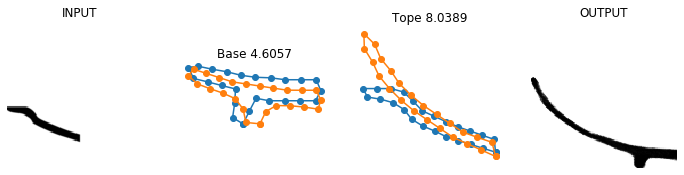

<Figure size 864x360 with 0 Axes>

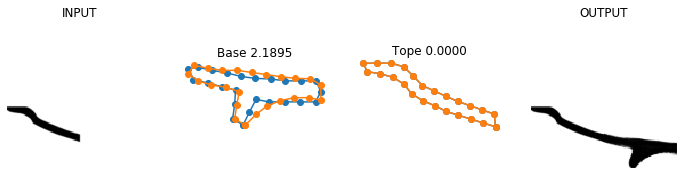

<Figure size 864x360 with 0 Axes>

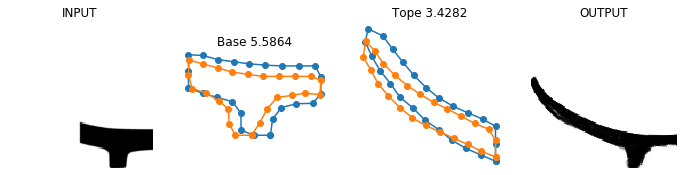

<Figure size 864x360 with 0 Axes>

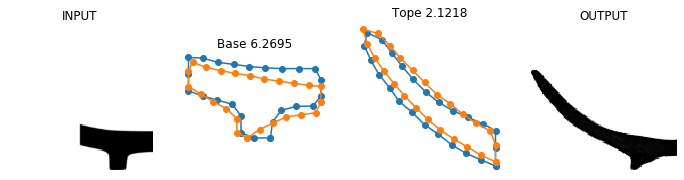

<Figure size 864x360 with 0 Axes>

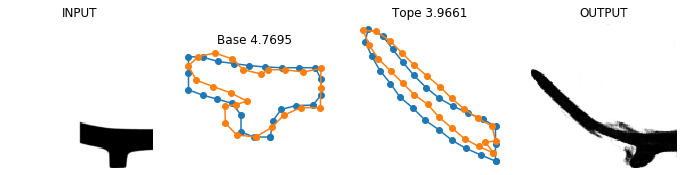

<Figure size 864x360 with 0 Axes>

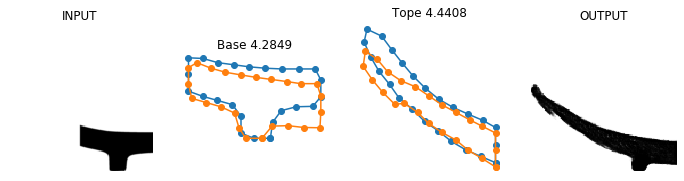

<Figure size 864x360 with 0 Axes>

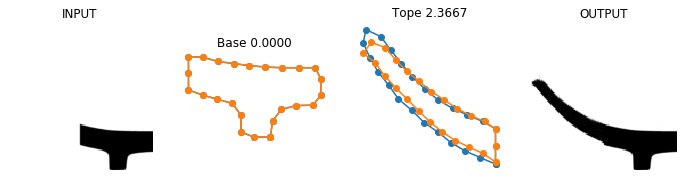

<Figure size 864x360 with 0 Axes>

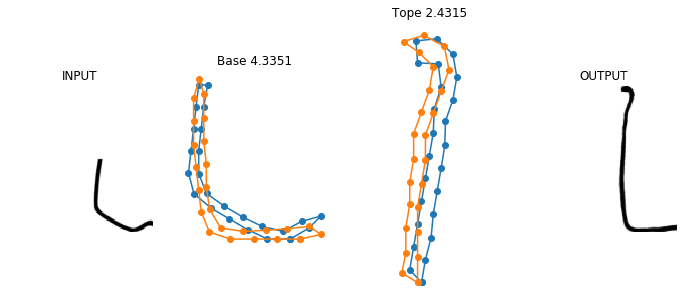

<Figure size 864x360 with 0 Axes>

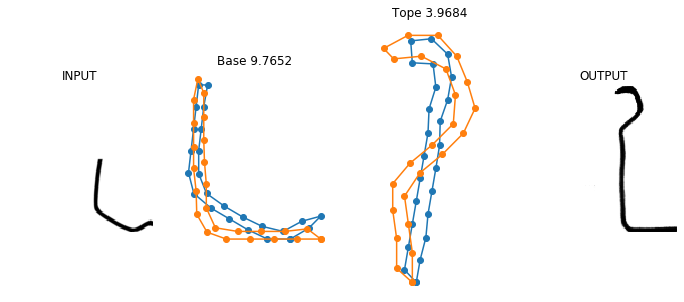

<Figure size 864x360 with 0 Axes>

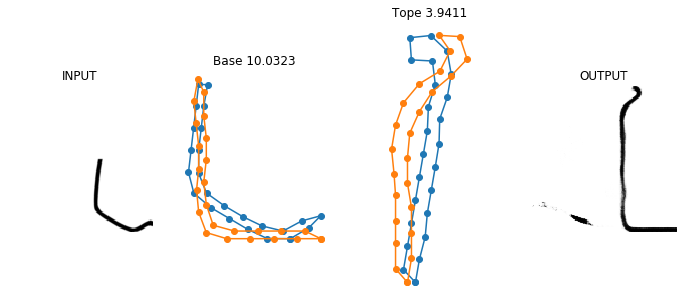

<Figure size 864x360 with 0 Axes>

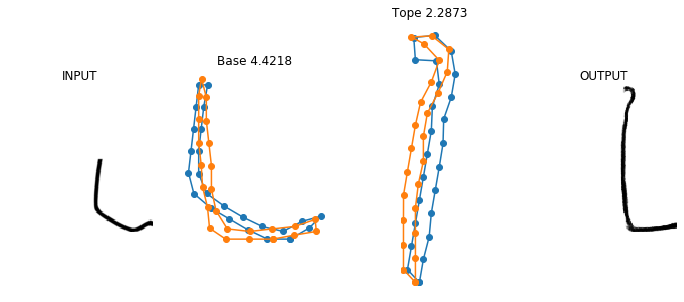

<Figure size 864x360 with 0 Axes>

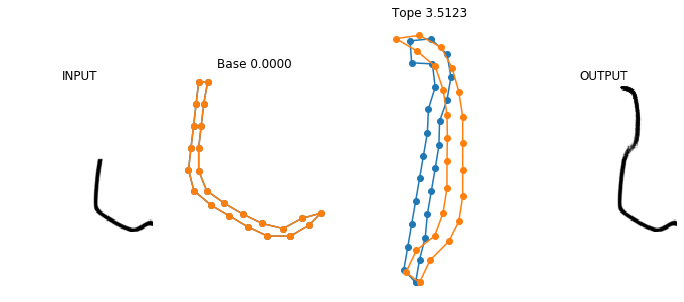

<Figure size 864x360 with 0 Axes>

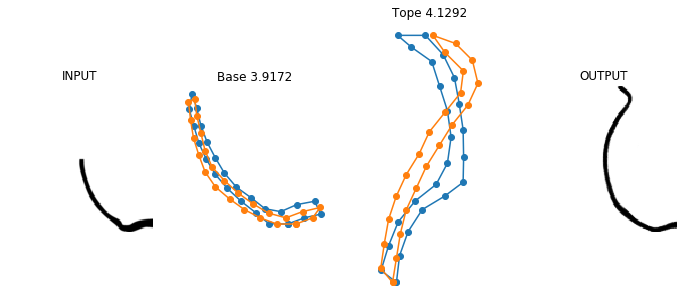

<Figure size 864x360 with 0 Axes>

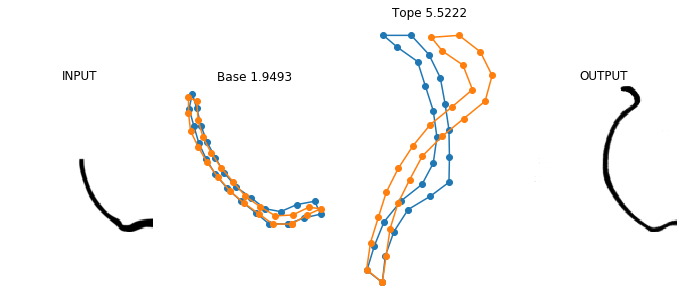

<Figure size 864x360 with 0 Axes>

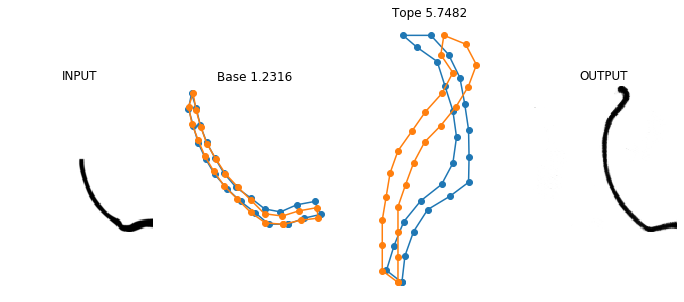

<Figure size 864x360 with 0 Axes>

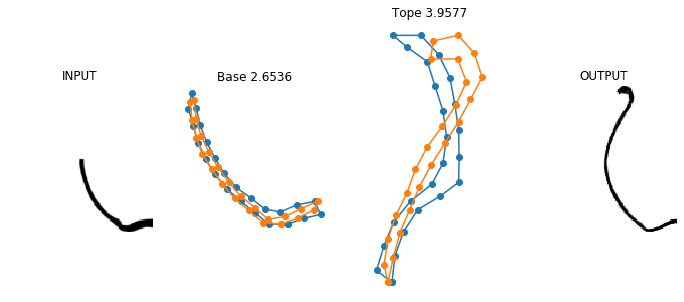

<Figure size 864x360 with 0 Axes>

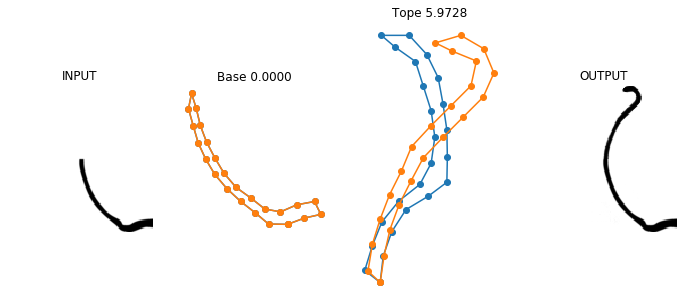

<Figure size 864x360 with 0 Axes>

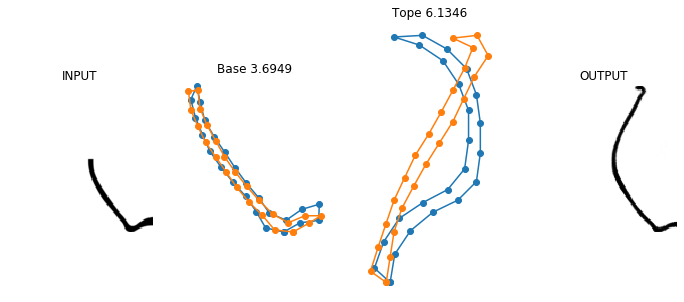

<Figure size 864x360 with 0 Axes>

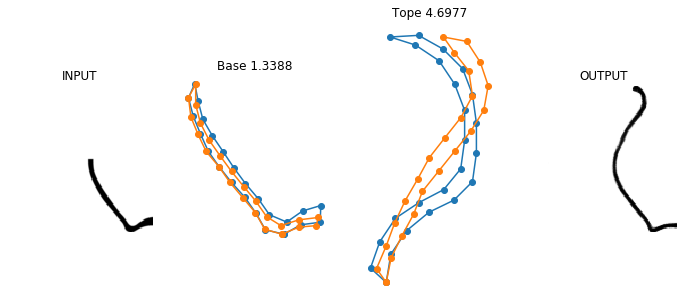

<Figure size 864x360 with 0 Axes>

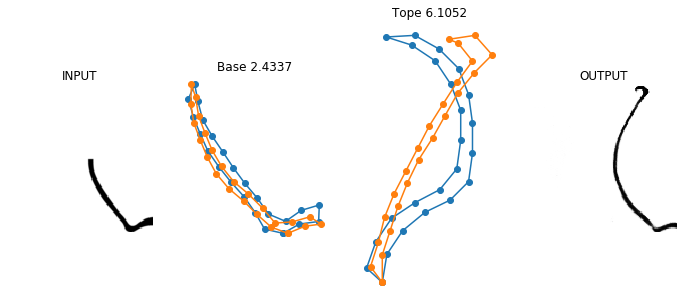

<Figure size 864x360 with 0 Axes>

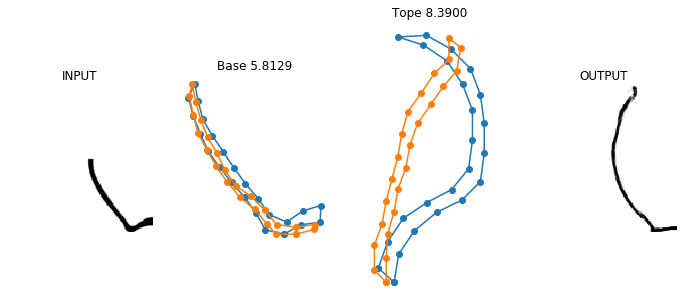

<Figure size 864x360 with 0 Axes>

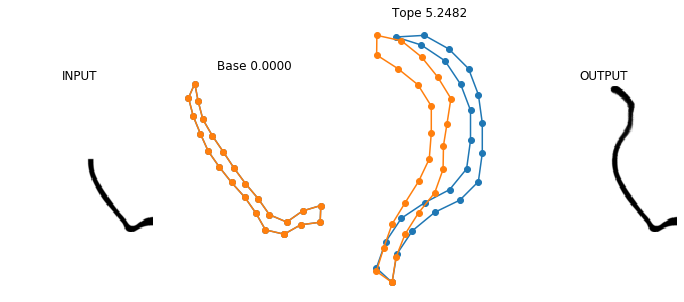

<Figure size 864x360 with 0 Axes>

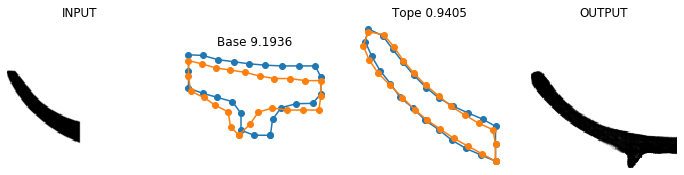

<Figure size 864x360 with 0 Axes>

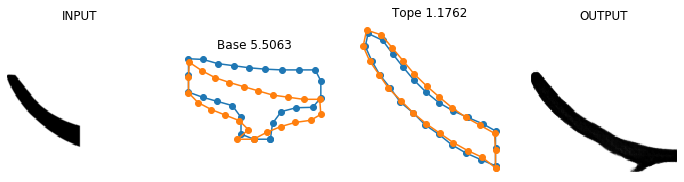

<Figure size 864x360 with 0 Axes>

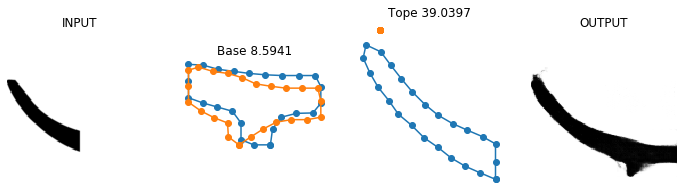

<Figure size 864x360 with 0 Axes>

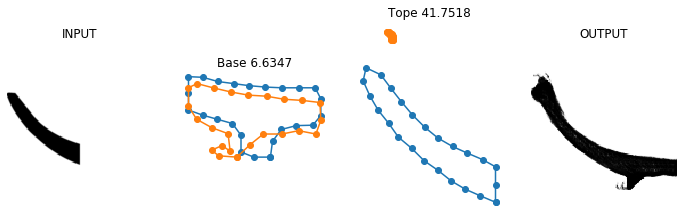

<Figure size 864x360 with 0 Axes>

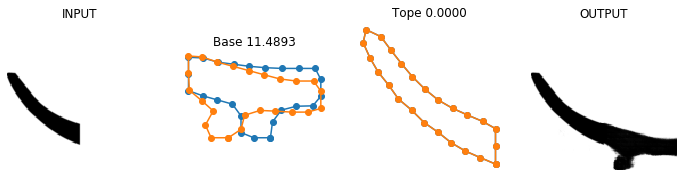

<Figure size 864x360 with 0 Axes>

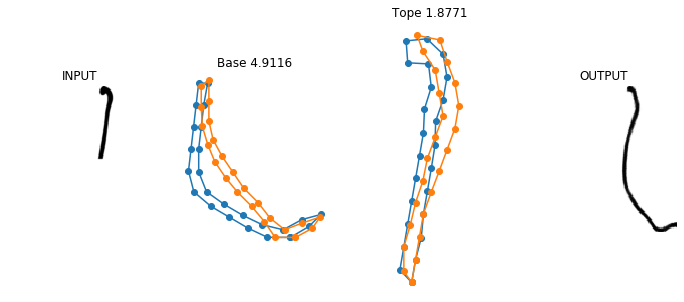

<Figure size 864x360 with 0 Axes>

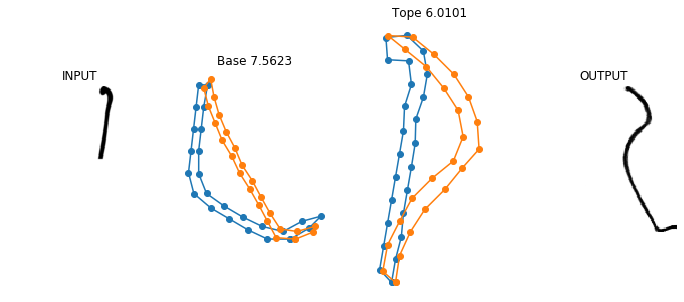

<Figure size 864x360 with 0 Axes>

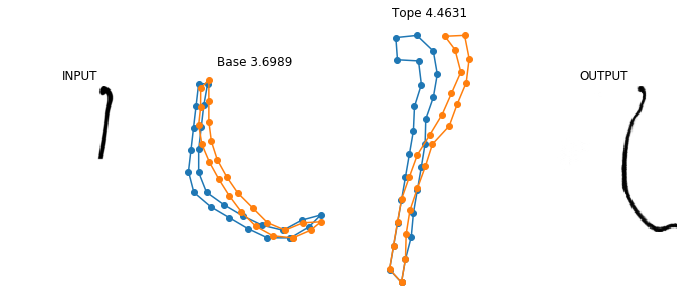

<Figure size 864x360 with 0 Axes>

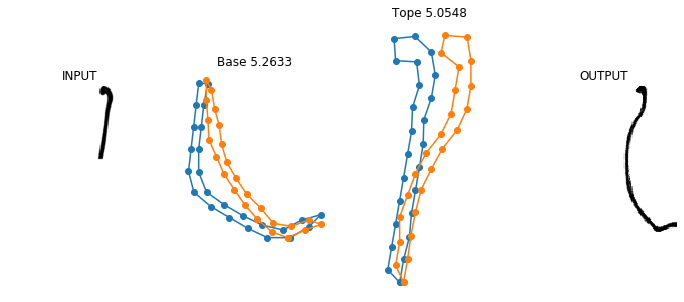

<Figure size 864x360 with 0 Axes>

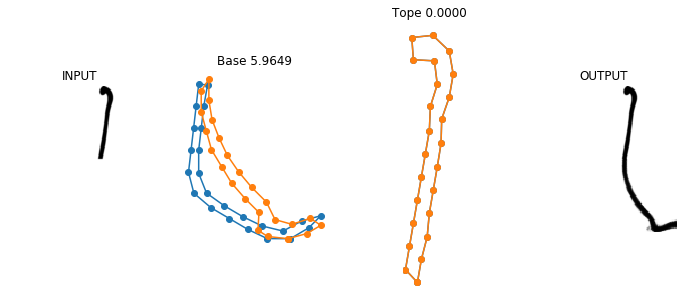

<Figure size 864x360 with 0 Axes>

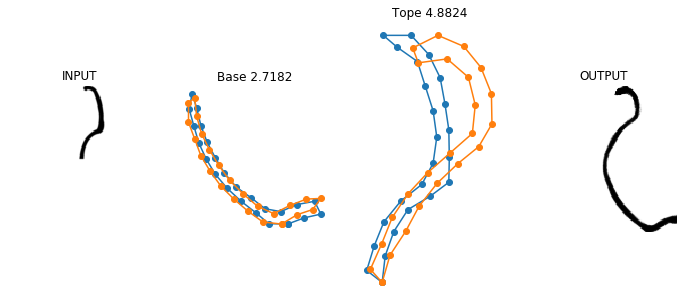

<Figure size 864x360 with 0 Axes>

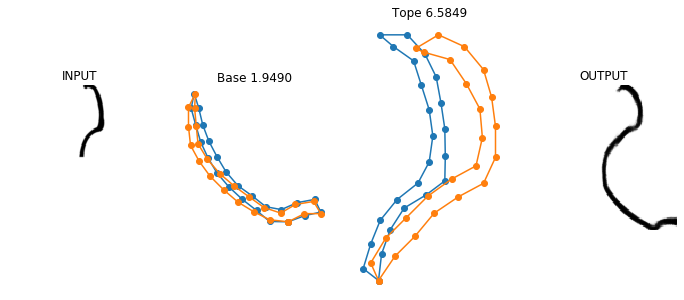

<Figure size 864x360 with 0 Axes>

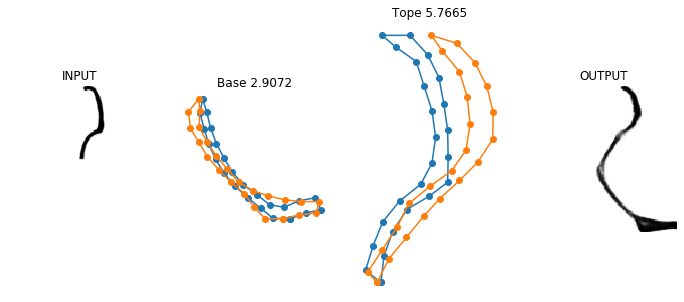

<Figure size 864x360 with 0 Axes>

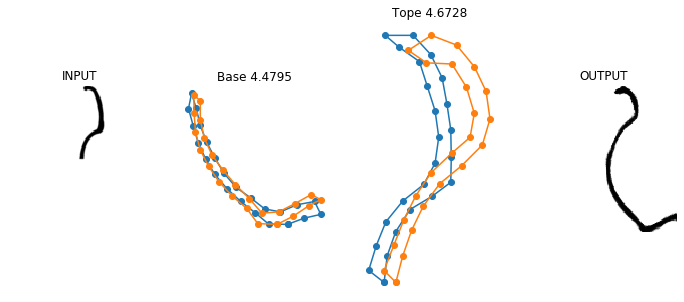

<Figure size 864x360 with 0 Axes>

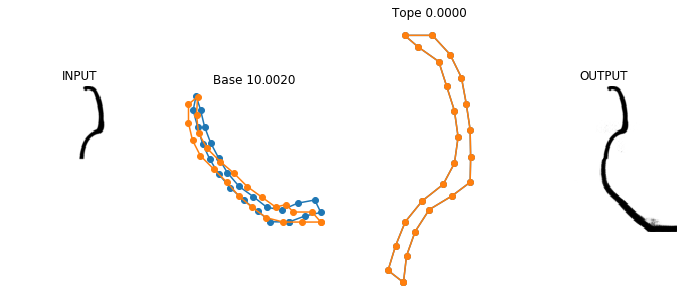

<Figure size 864x360 with 0 Axes>

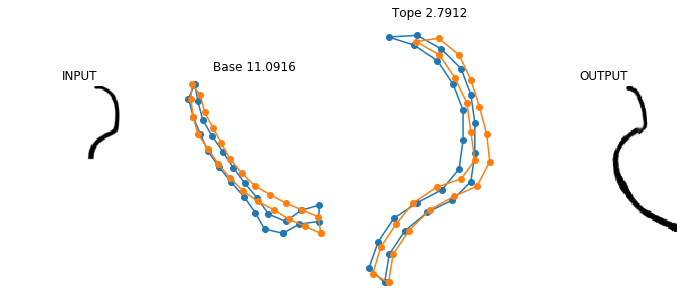

<Figure size 864x360 with 0 Axes>

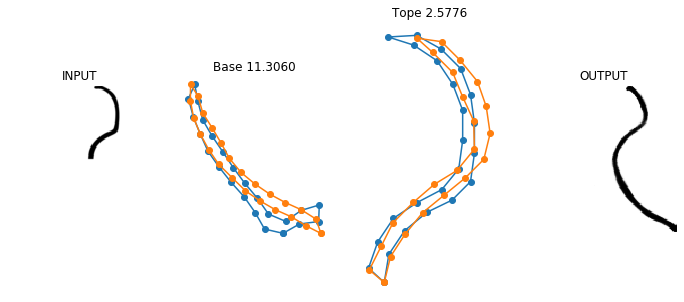

<Figure size 864x360 with 0 Axes>

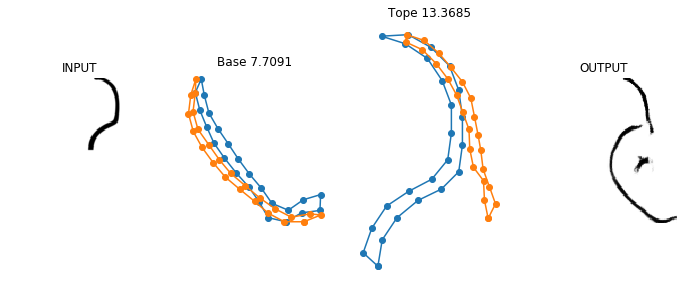

<Figure size 864x360 with 0 Axes>

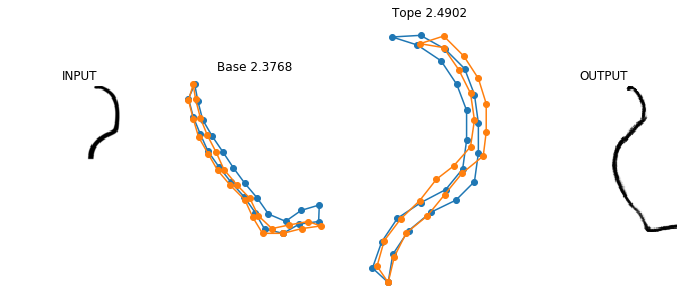

<Figure size 864x360 with 0 Axes>

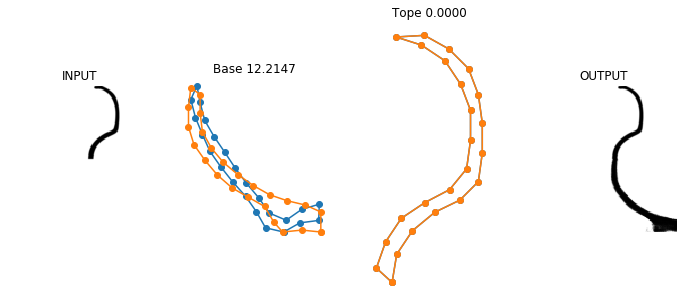

<Figure size 864x360 with 0 Axes>

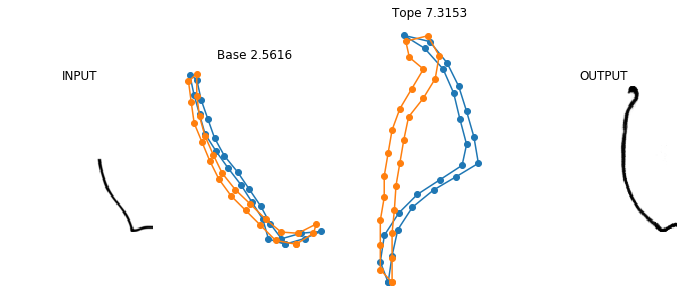

<Figure size 864x360 with 0 Axes>

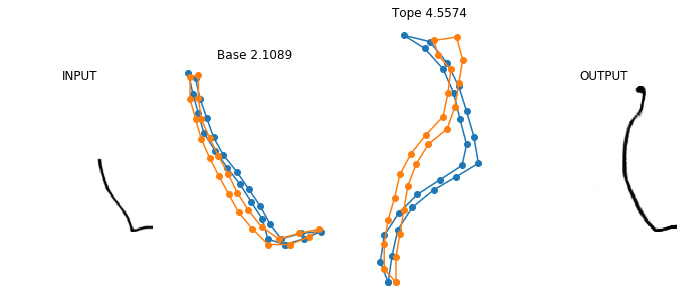

<Figure size 864x360 with 0 Axes>

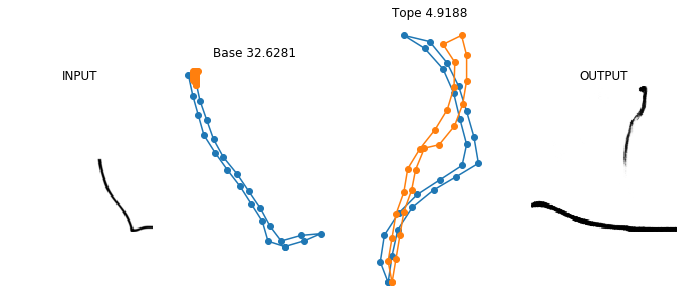

<Figure size 864x360 with 0 Axes>

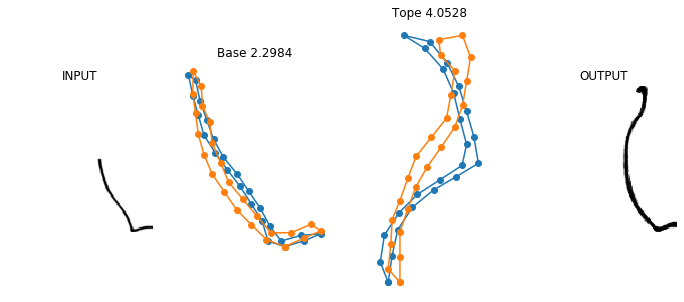

<Figure size 864x360 with 0 Axes>

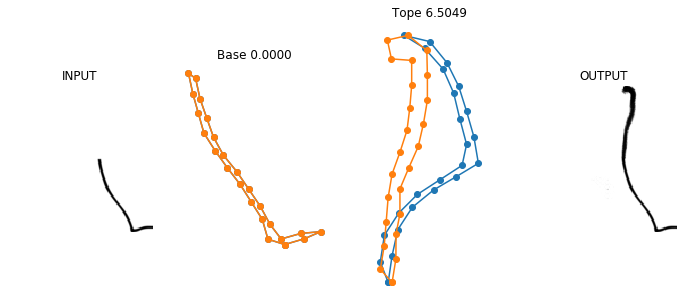

<Figure size 864x360 with 0 Axes>

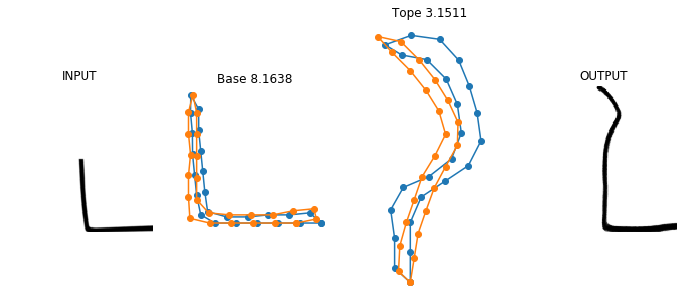

<Figure size 864x360 with 0 Axes>

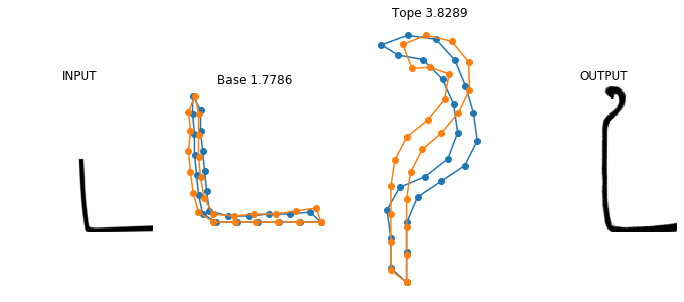

<Figure size 864x360 with 0 Axes>

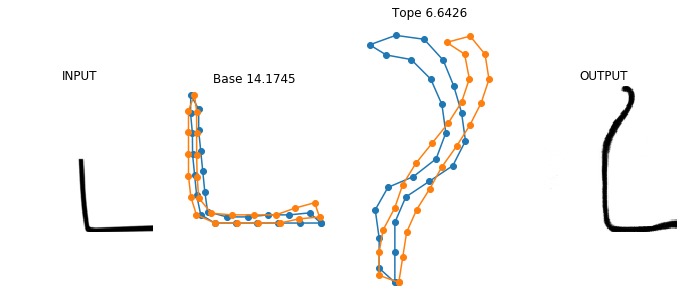

<Figure size 864x360 with 0 Axes>

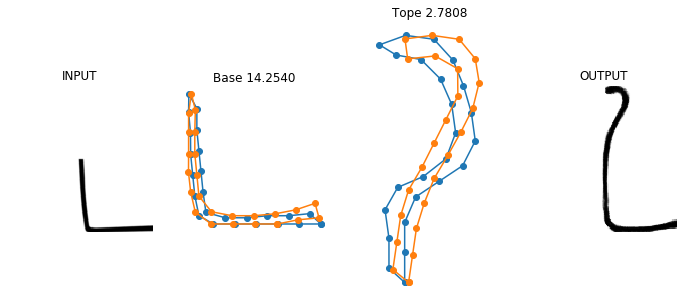

<Figure size 864x360 with 0 Axes>

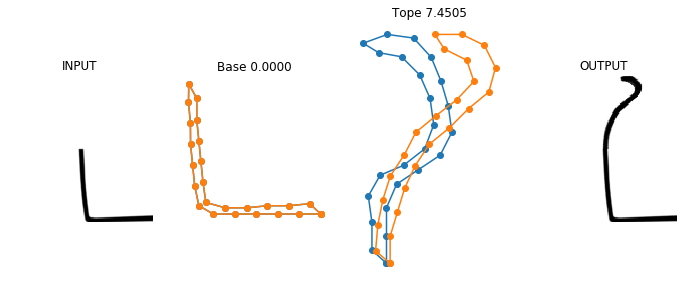

<Figure size 864x360 with 0 Axes>

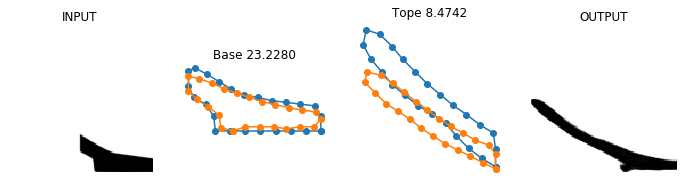

<Figure size 864x360 with 0 Axes>

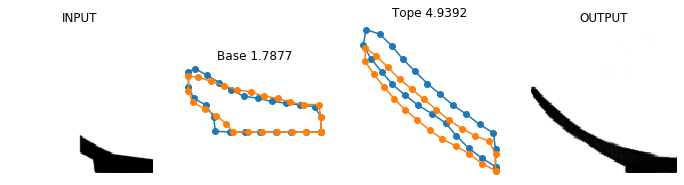

<Figure size 864x360 with 0 Axes>

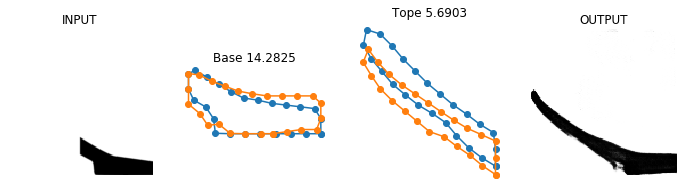

<Figure size 864x360 with 0 Axes>

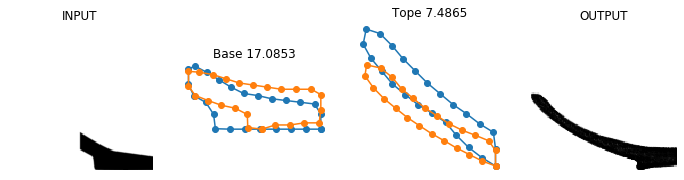

<Figure size 864x360 with 0 Axes>

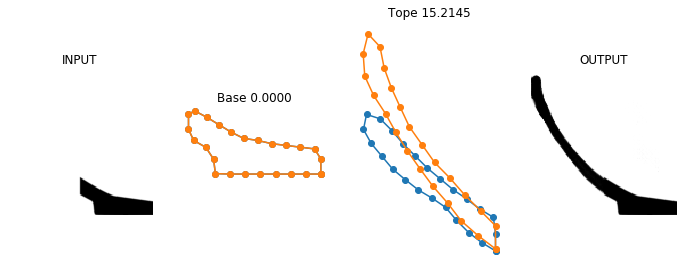

<Figure size 864x360 with 0 Axes>

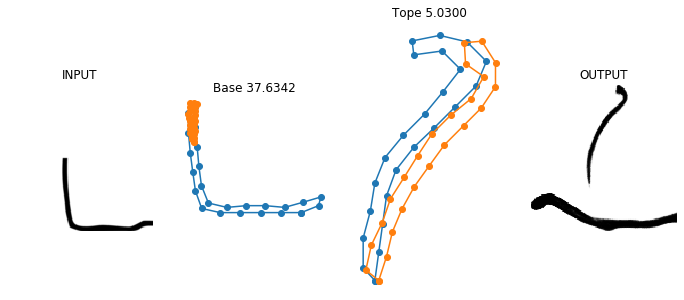

<Figure size 864x360 with 0 Axes>

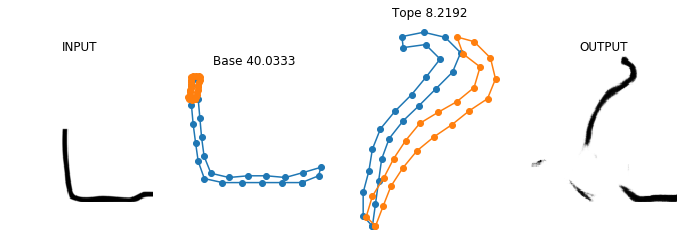

<Figure size 864x360 with 0 Axes>

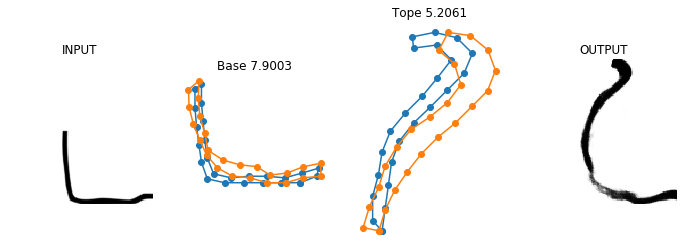

<Figure size 864x360 with 0 Axes>

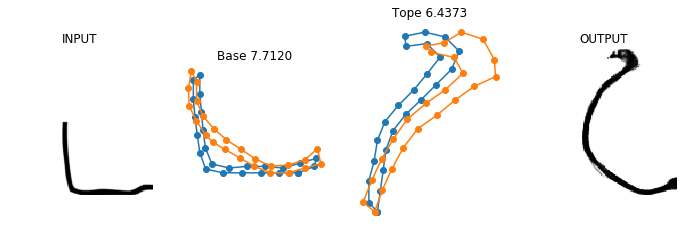

<Figure size 864x360 with 0 Axes>

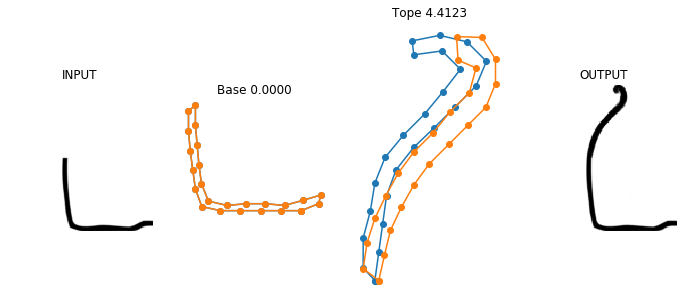

<Figure size 864x360 with 0 Axes>

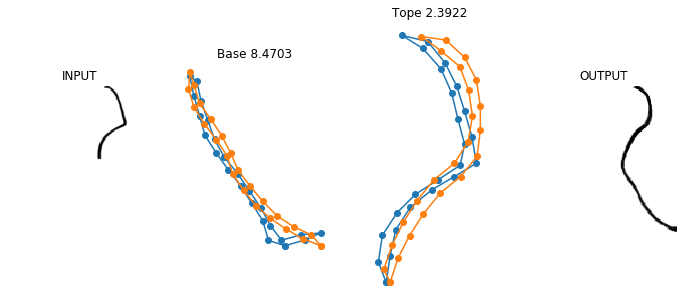

<Figure size 864x360 with 0 Axes>

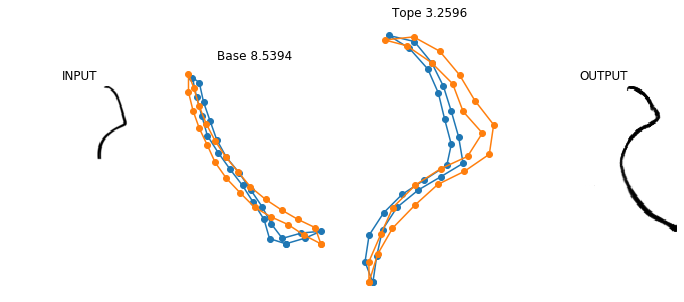

<Figure size 864x360 with 0 Axes>

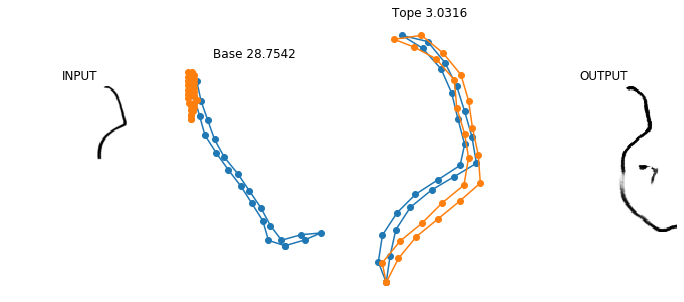

<Figure size 864x360 with 0 Axes>

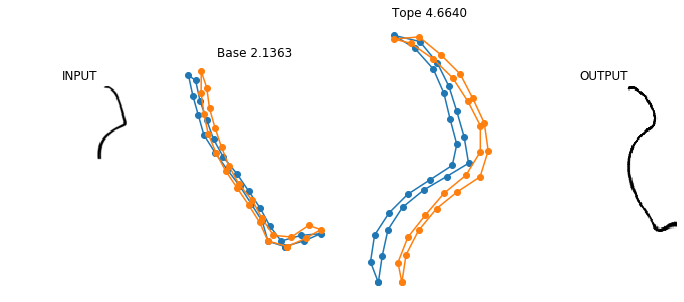

<Figure size 864x360 with 0 Axes>

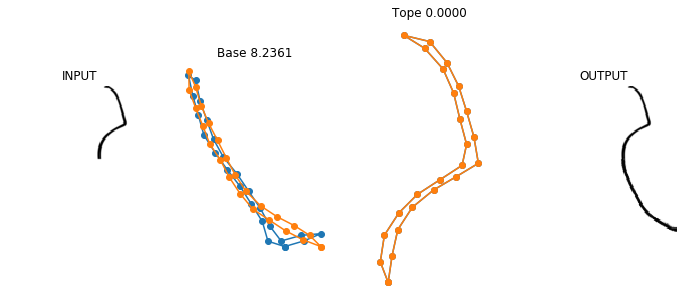

<Figure size 864x360 with 0 Axes>

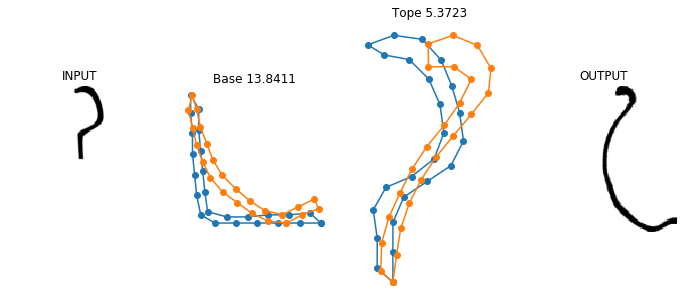

<Figure size 864x360 with 0 Axes>

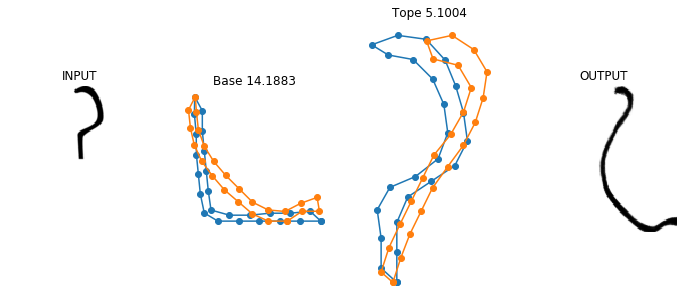

<Figure size 864x360 with 0 Axes>

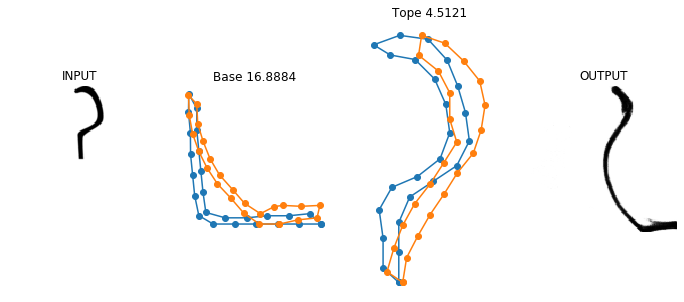

<Figure size 864x360 with 0 Axes>

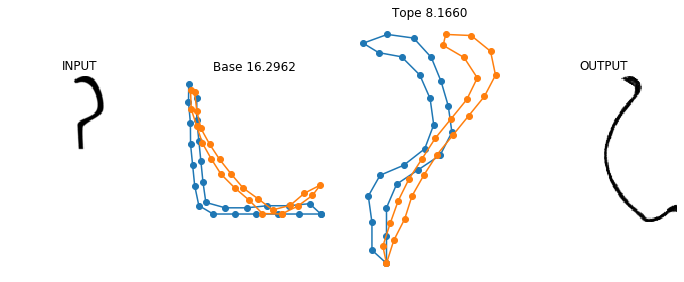

<Figure size 864x360 with 0 Axes>

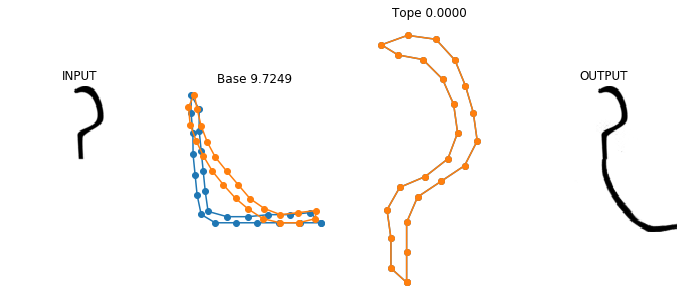

<Figure size 864x360 with 0 Axes>

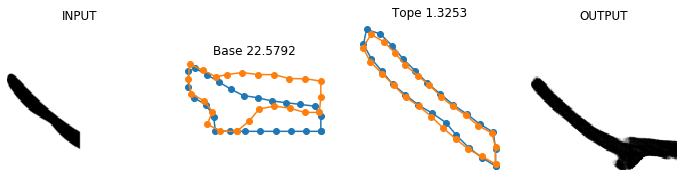

<Figure size 864x360 with 0 Axes>

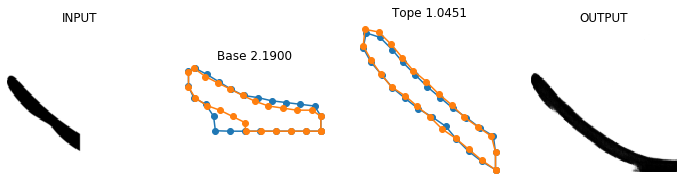

<Figure size 864x360 with 0 Axes>

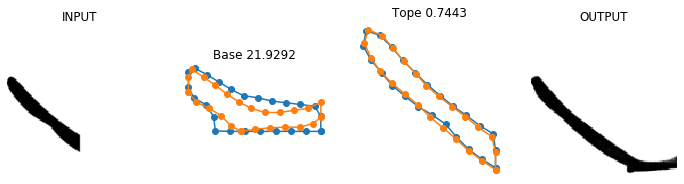

<Figure size 864x360 with 0 Axes>

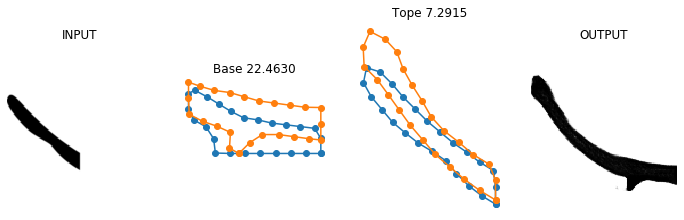

<Figure size 864x360 with 0 Axes>

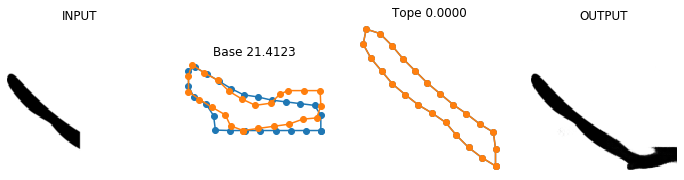

<Figure size 864x360 with 0 Axes>

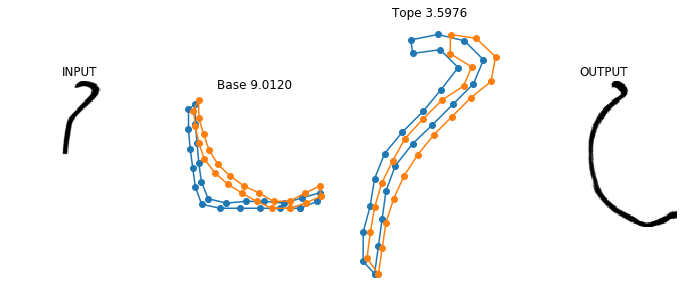

<Figure size 864x360 with 0 Axes>

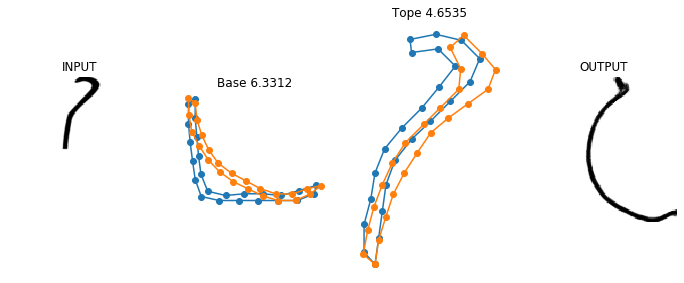

<Figure size 864x360 with 0 Axes>

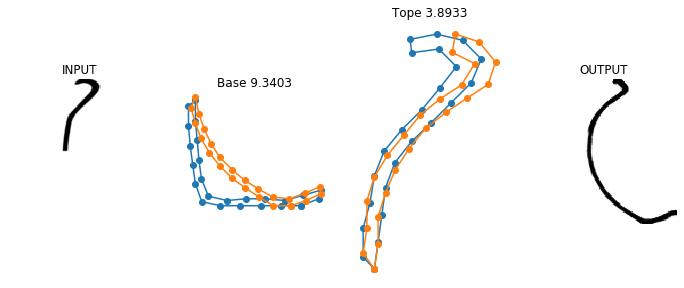

<Figure size 864x360 with 0 Axes>

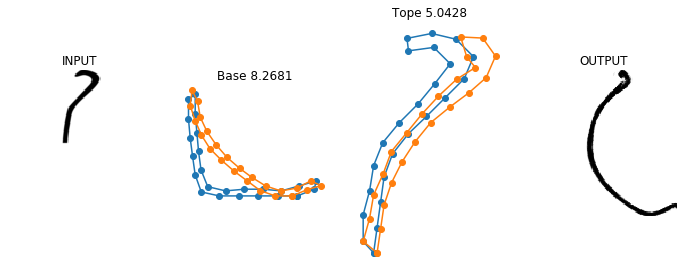

<Figure size 864x360 with 0 Axes>

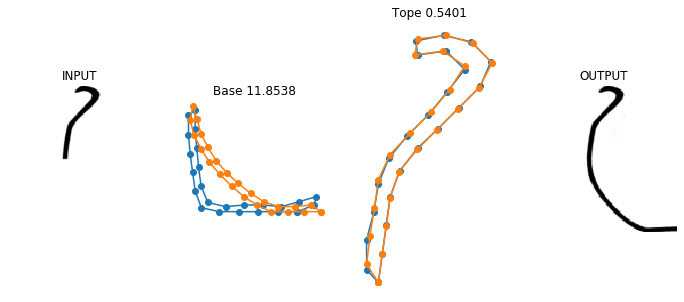

<Figure size 864x360 with 0 Axes>

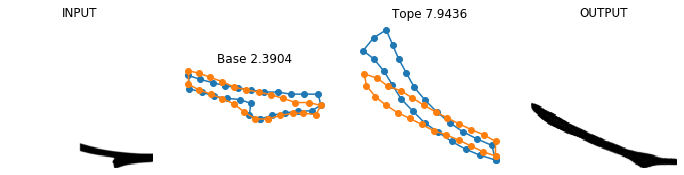

<Figure size 864x360 with 0 Axes>

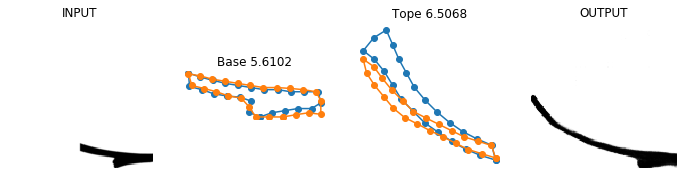

<Figure size 864x360 with 0 Axes>

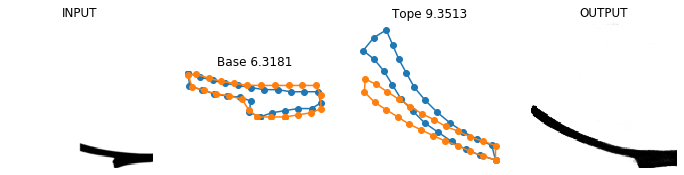

<Figure size 864x360 with 0 Axes>

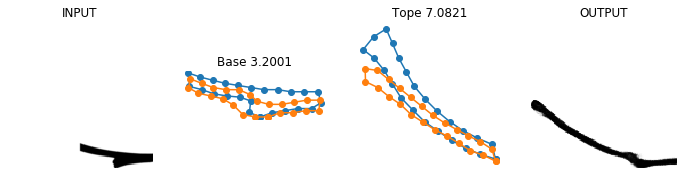

<Figure size 864x360 with 0 Axes>

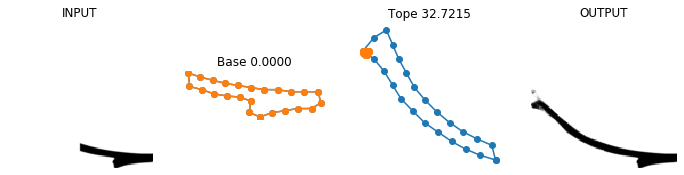

<Figure size 864x360 with 0 Axes>

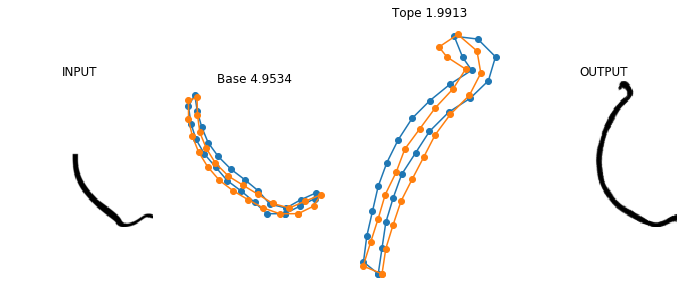

<Figure size 864x360 with 0 Axes>

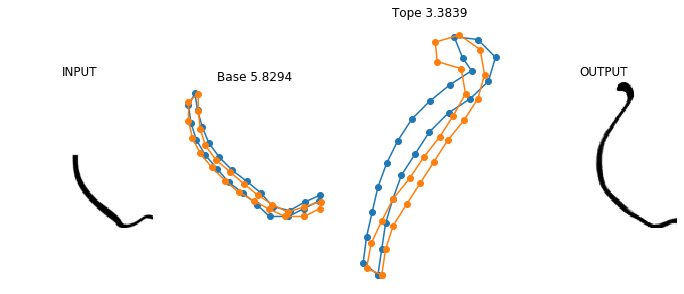

<Figure size 864x360 with 0 Axes>

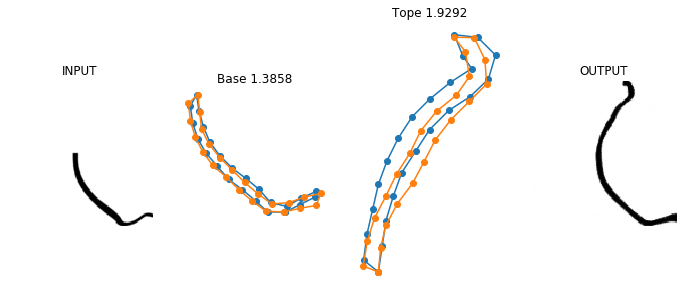

<Figure size 864x360 with 0 Axes>

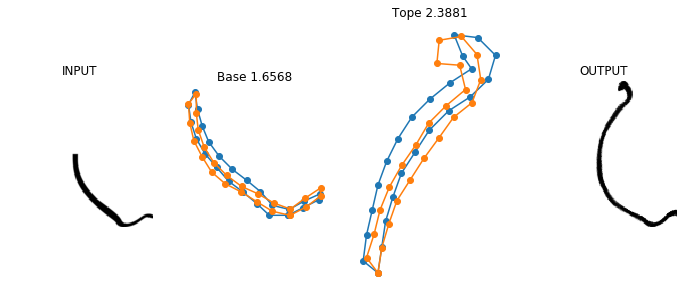

<Figure size 864x360 with 0 Axes>

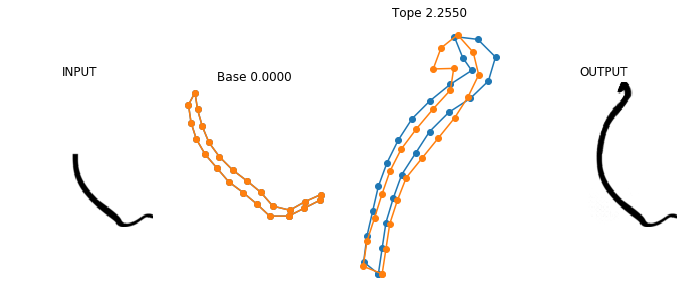

<Figure size 864x360 with 0 Axes>

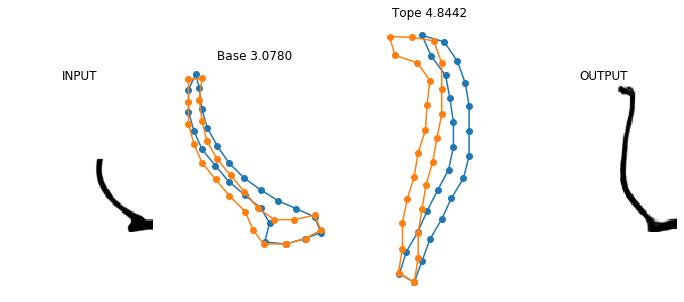

<Figure size 864x360 with 0 Axes>

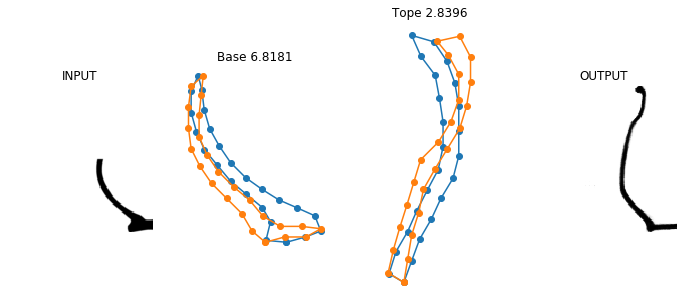

<Figure size 864x360 with 0 Axes>

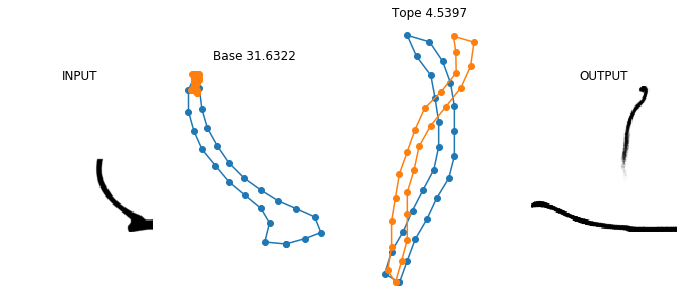

<Figure size 864x360 with 0 Axes>

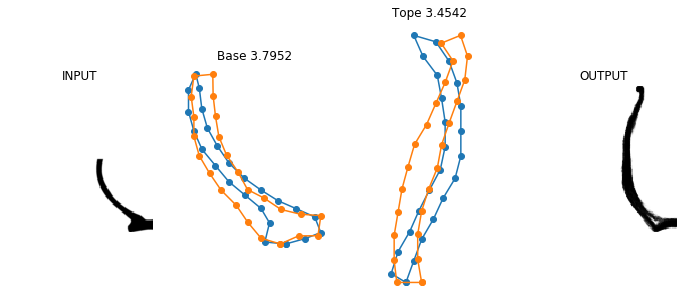

<Figure size 864x360 with 0 Axes>

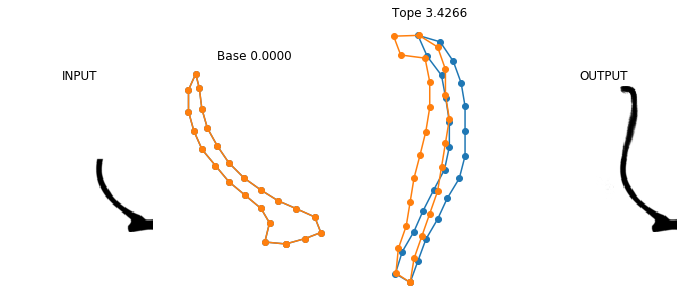

<Figure size 864x360 with 0 Axes>

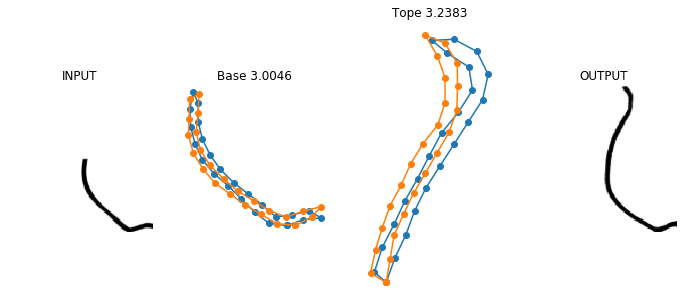

<Figure size 864x360 with 0 Axes>

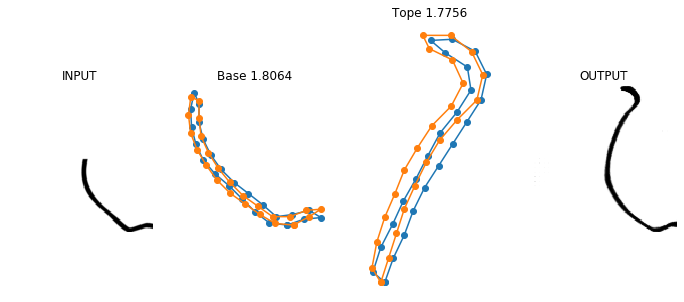

<Figure size 864x360 with 0 Axes>

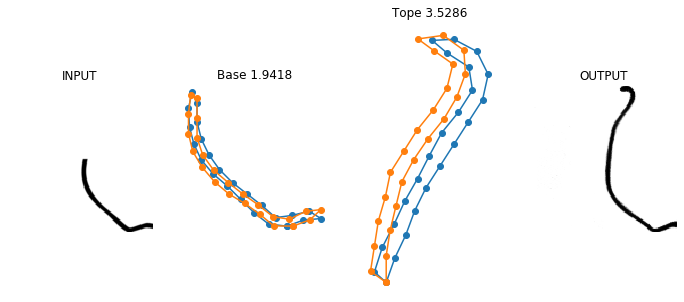

<Figure size 864x360 with 0 Axes>

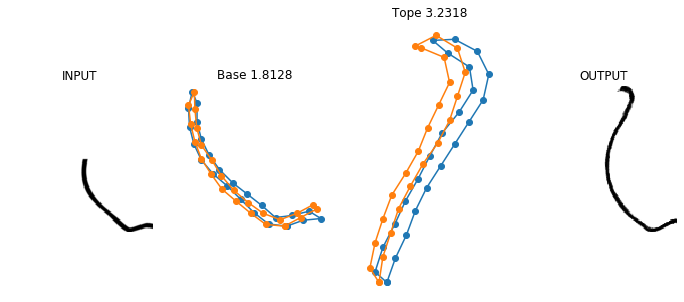

<Figure size 864x360 with 0 Axes>

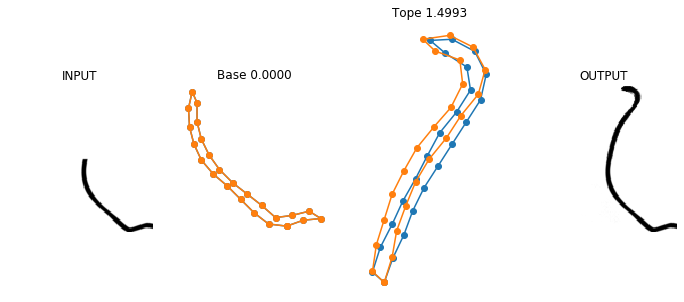

<Figure size 864x360 with 0 Axes>

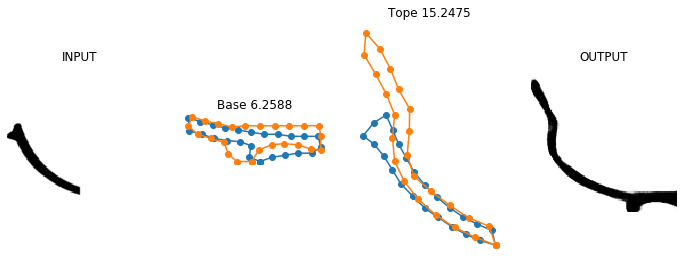

<Figure size 864x360 with 0 Axes>

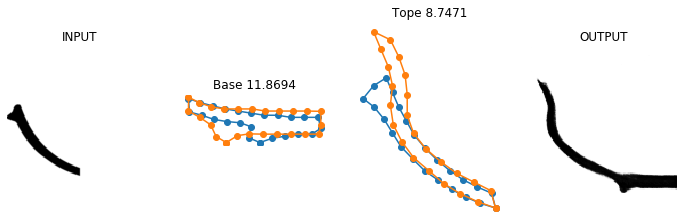

<Figure size 864x360 with 0 Axes>

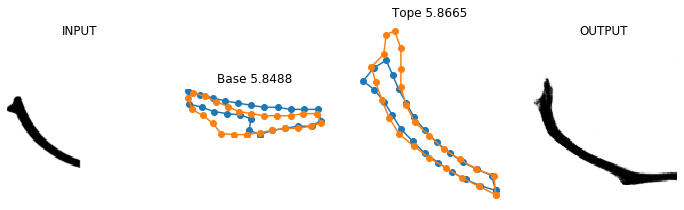

<Figure size 864x360 with 0 Axes>

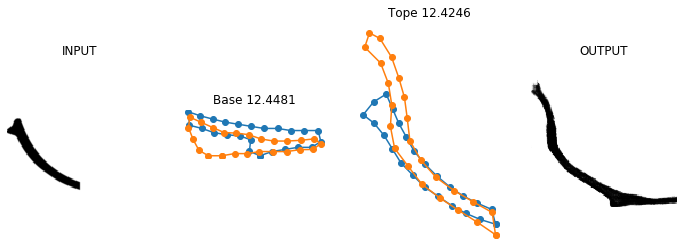

<Figure size 864x360 with 0 Axes>

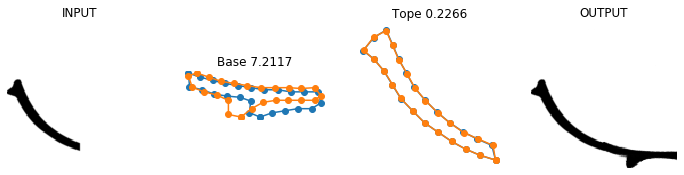

<Figure size 864x360 with 0 Axes>

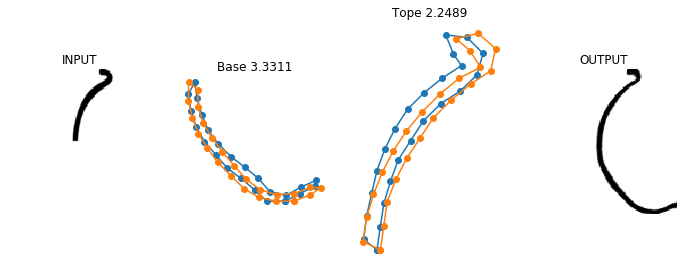

<Figure size 864x360 with 0 Axes>

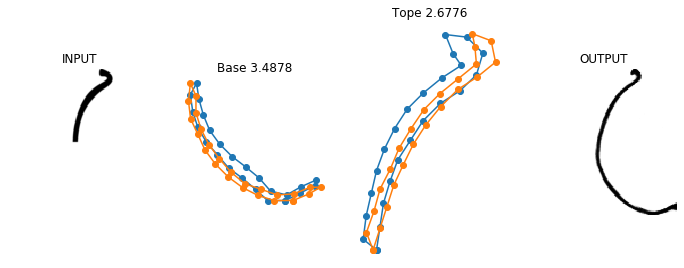

<Figure size 864x360 with 0 Axes>

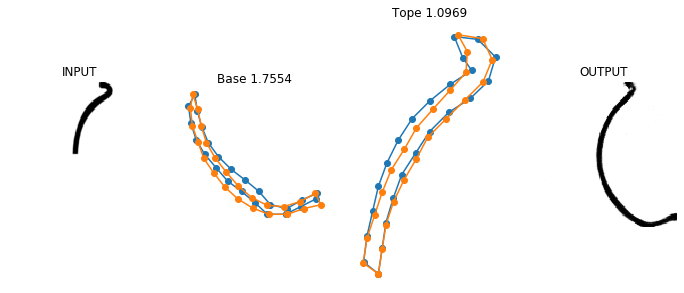

<Figure size 864x360 with 0 Axes>

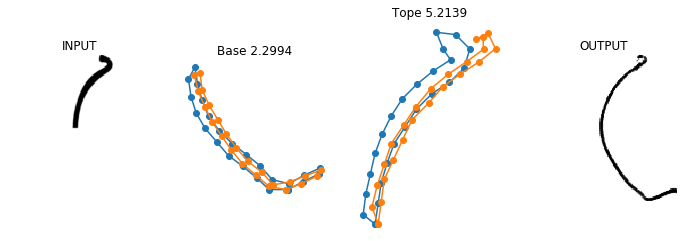

<Figure size 864x360 with 0 Axes>

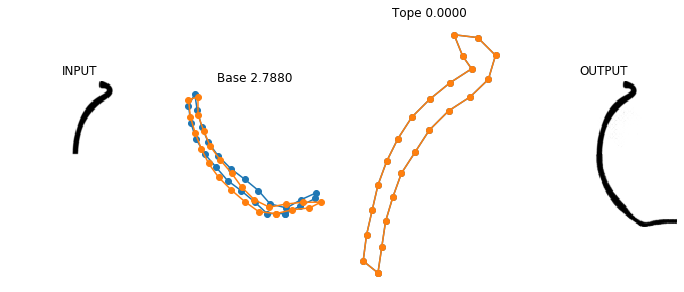

<Figure size 864x360 with 0 Axes>

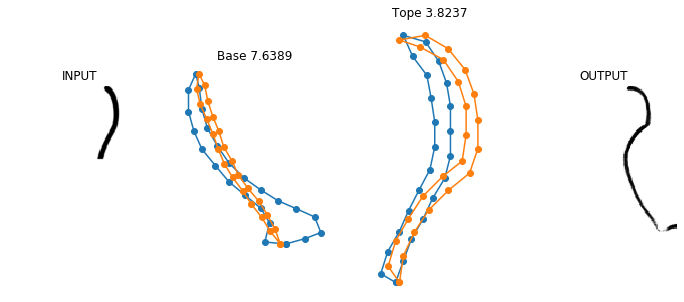

<Figure size 864x360 with 0 Axes>

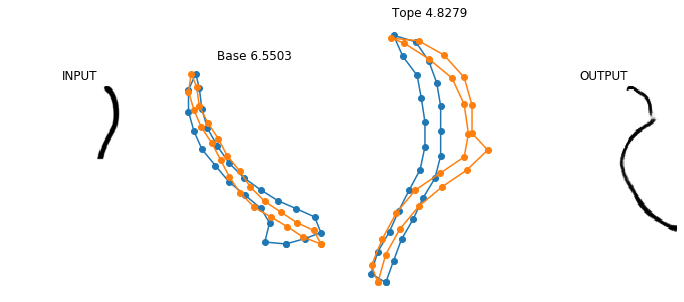

<Figure size 864x360 with 0 Axes>

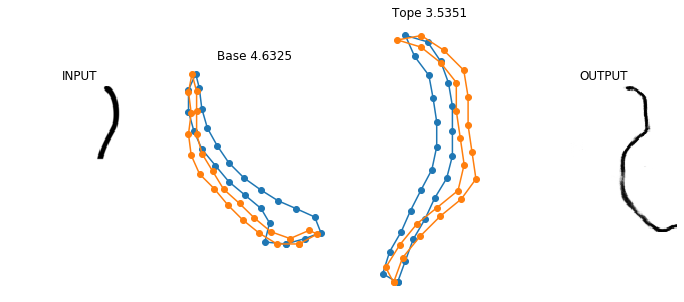

<Figure size 864x360 with 0 Axes>

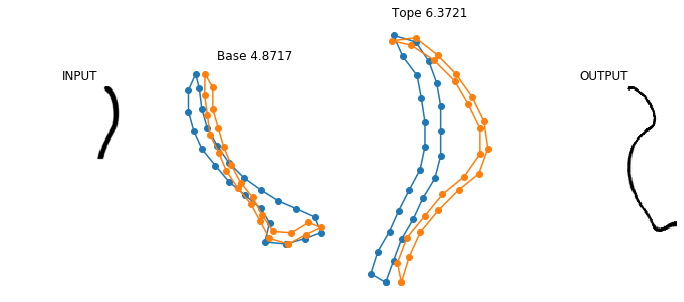

<Figure size 864x360 with 0 Axes>

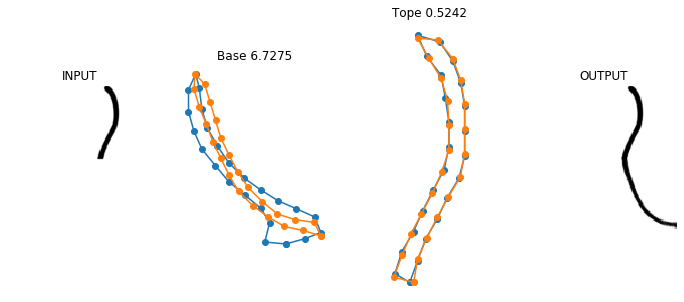

<Figure size 864x360 with 0 Axes>

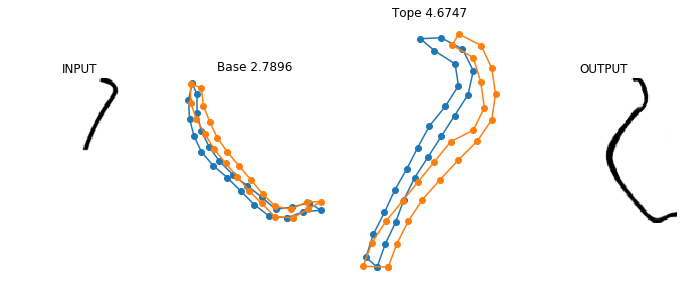

<Figure size 864x360 with 0 Axes>

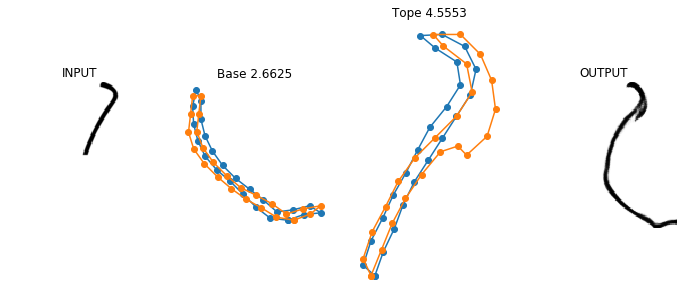

<Figure size 864x360 with 0 Axes>

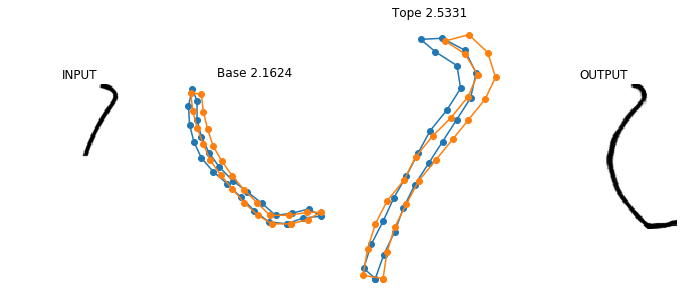

<Figure size 864x360 with 0 Axes>

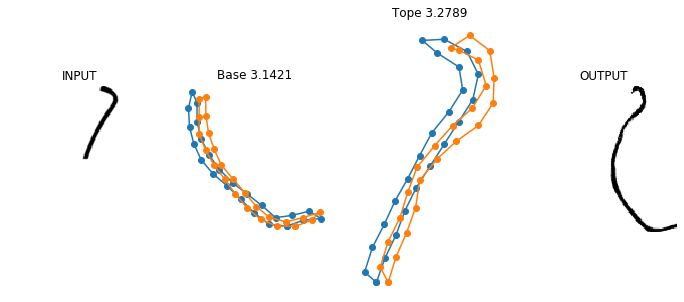

<Figure size 864x360 with 0 Axes>

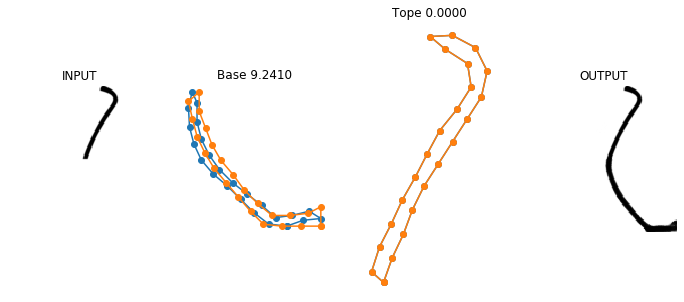

<Figure size 864x360 with 0 Axes>

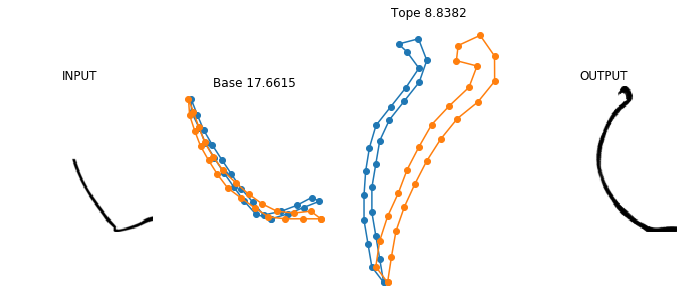

<Figure size 864x360 with 0 Axes>

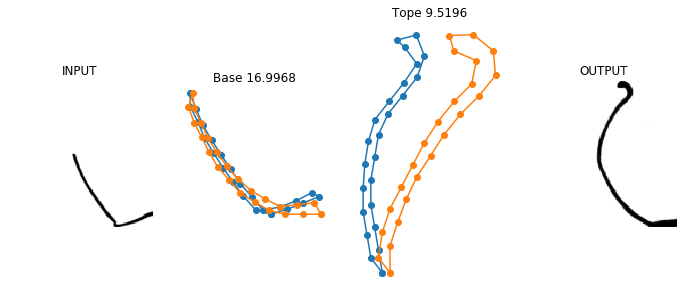

<Figure size 864x360 with 0 Axes>

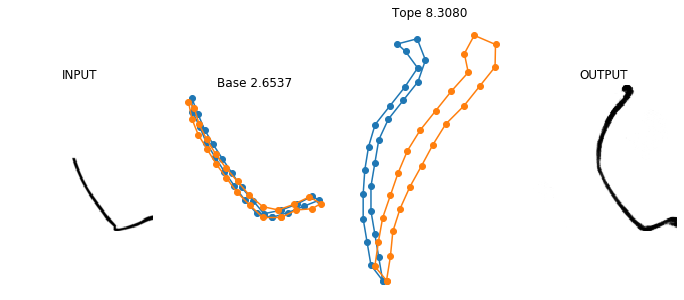

<Figure size 864x360 with 0 Axes>

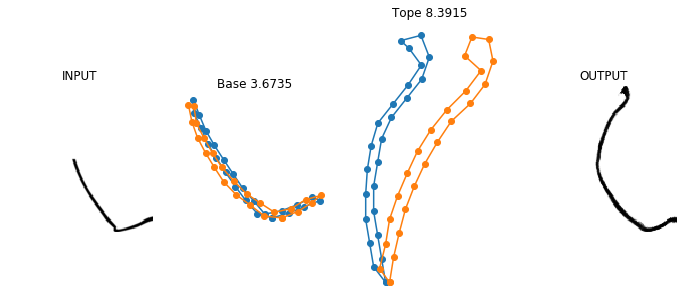

<Figure size 864x360 with 0 Axes>

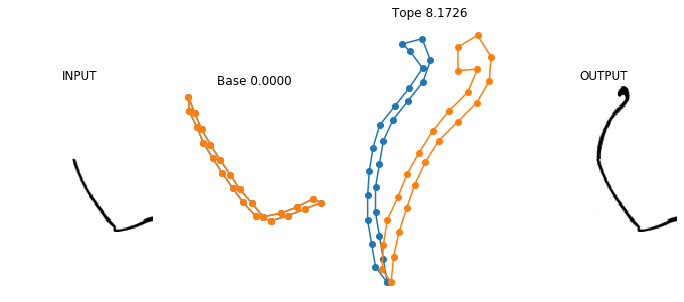

<Figure size 864x360 with 0 Axes>

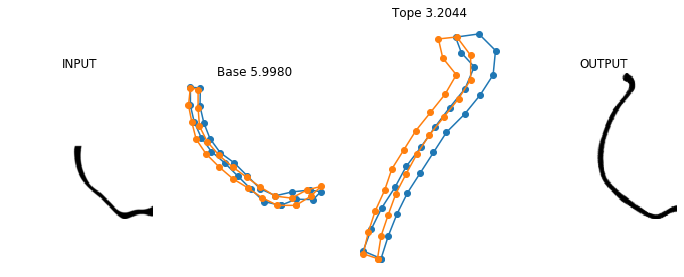

<Figure size 864x360 with 0 Axes>

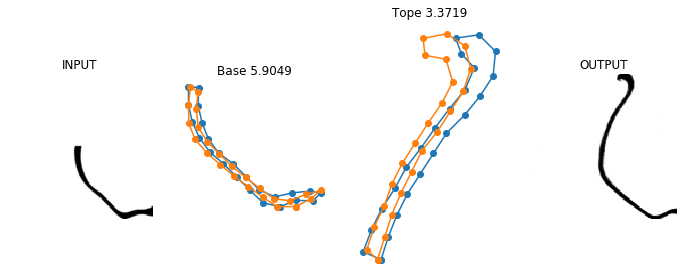

<Figure size 864x360 with 0 Axes>

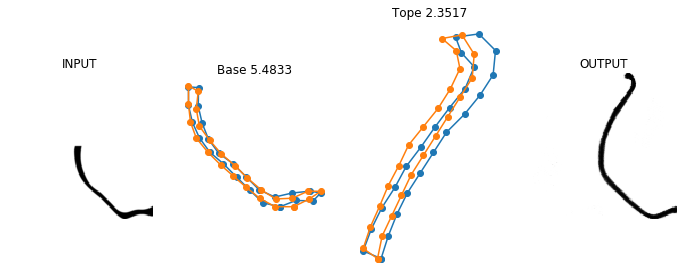

<Figure size 864x360 with 0 Axes>

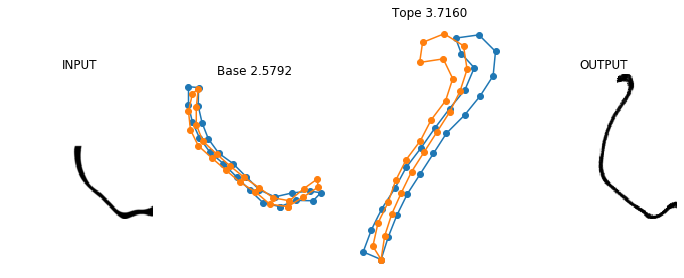

<Figure size 864x360 with 0 Axes>

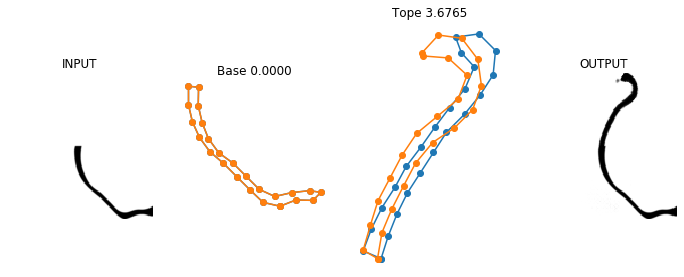

<Figure size 864x360 with 0 Axes>

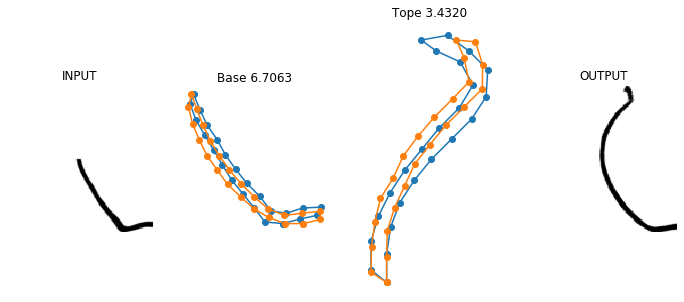

<Figure size 864x360 with 0 Axes>

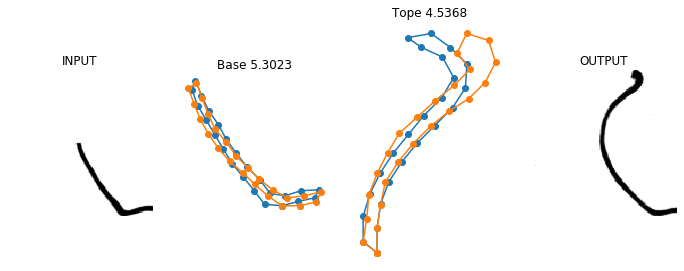

<Figure size 864x360 with 0 Axes>

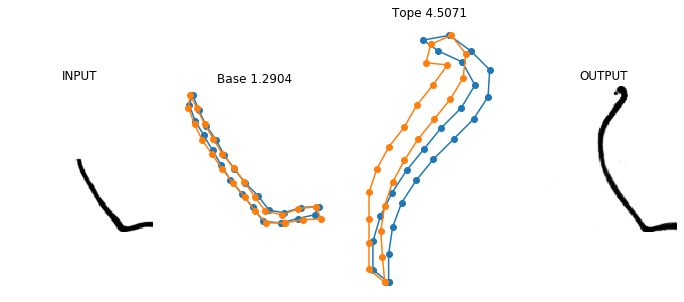

<Figure size 864x360 with 0 Axes>

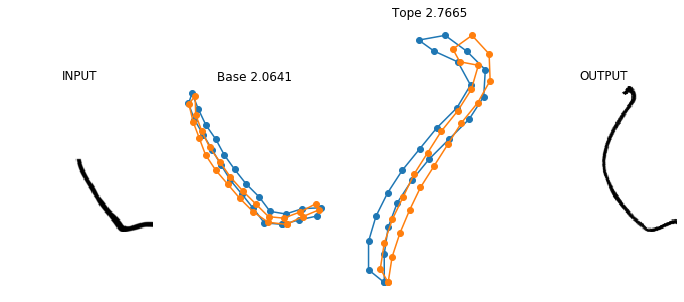

<Figure size 864x360 with 0 Axes>

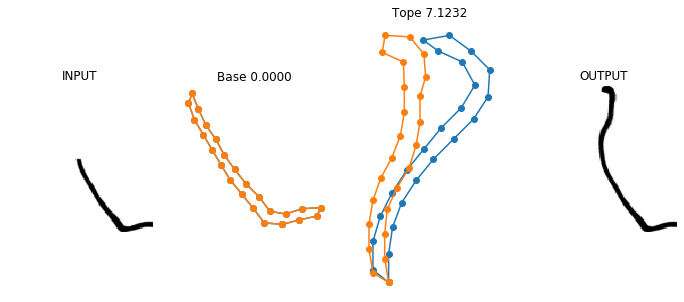

<Figure size 864x360 with 0 Axes>

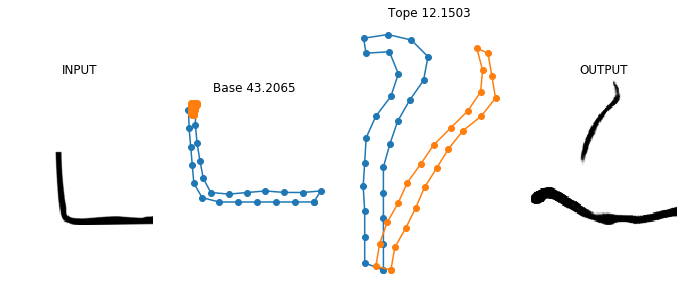

<Figure size 864x360 with 0 Axes>

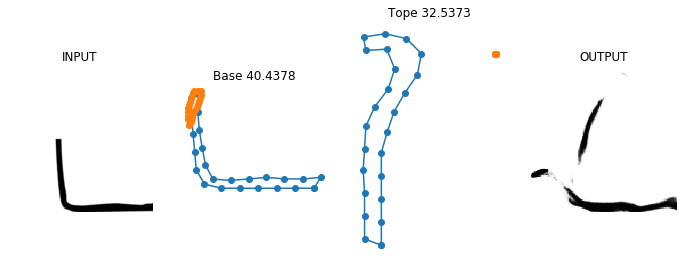

<Figure size 864x360 with 0 Axes>

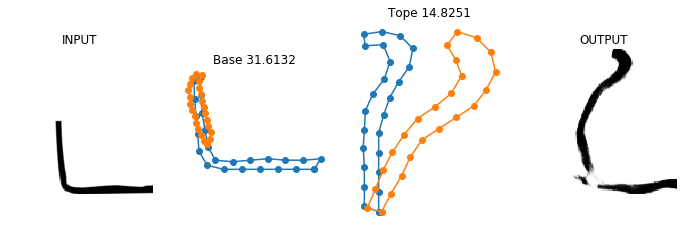

<Figure size 864x360 with 0 Axes>

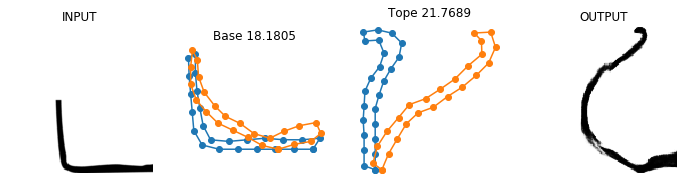

<Figure size 864x360 with 0 Axes>

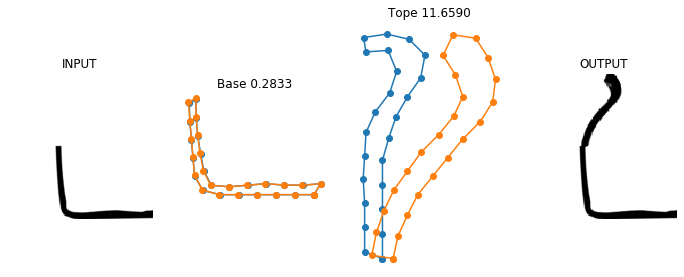

<Figure size 864x360 with 0 Axes>

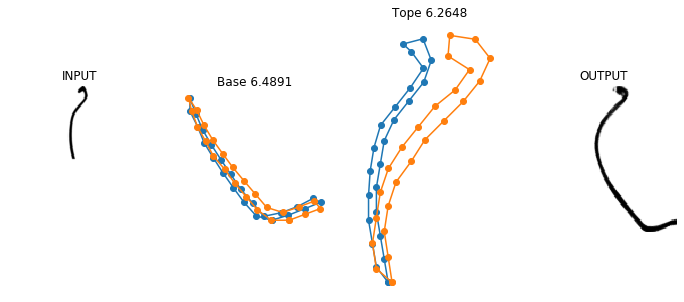

<Figure size 864x360 with 0 Axes>

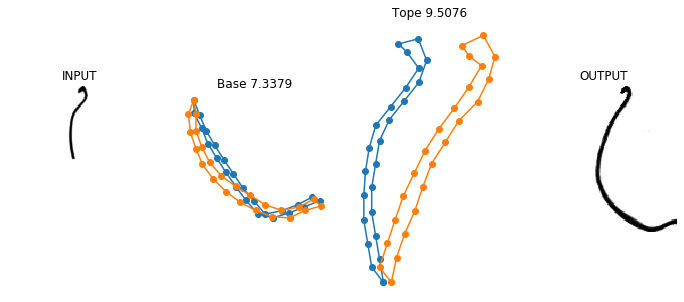

<Figure size 864x360 with 0 Axes>

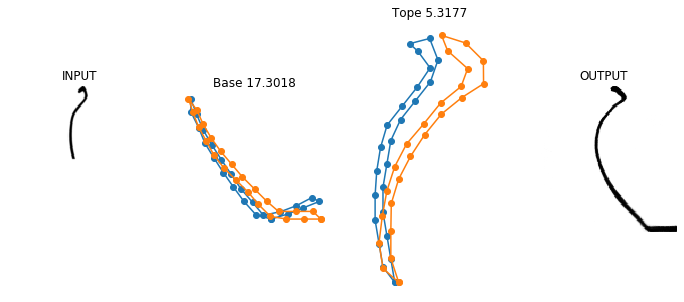

<Figure size 864x360 with 0 Axes>

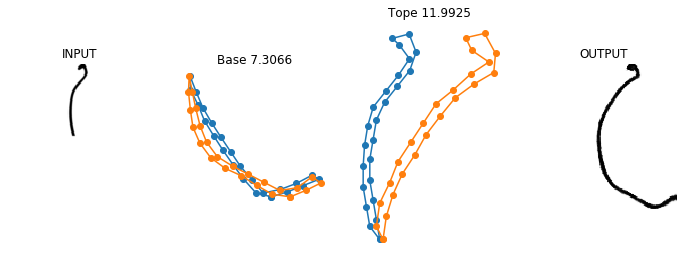

<Figure size 864x360 with 0 Axes>

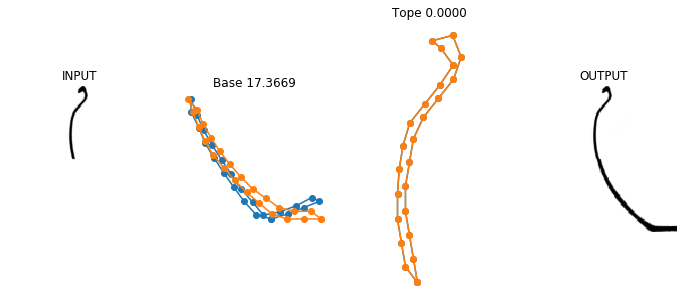

<Figure size 864x360 with 0 Axes>

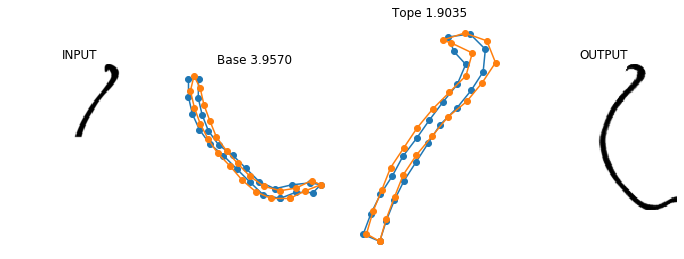

<Figure size 864x360 with 0 Axes>

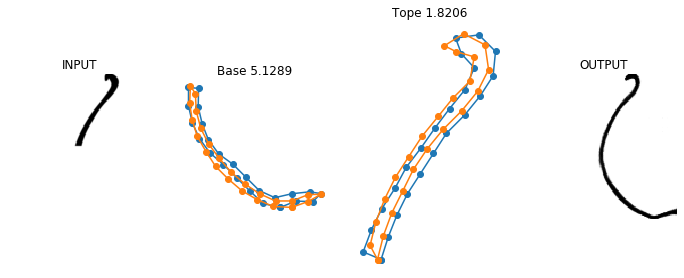

<Figure size 864x360 with 0 Axes>

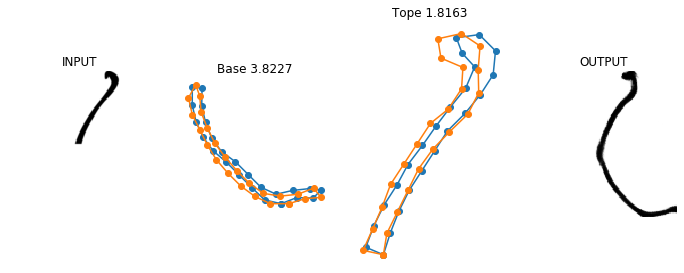

<Figure size 864x360 with 0 Axes>

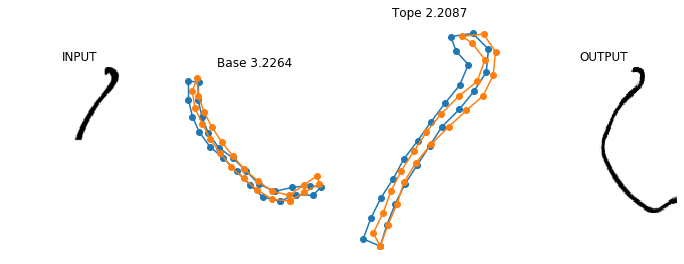

<Figure size 864x360 with 0 Axes>

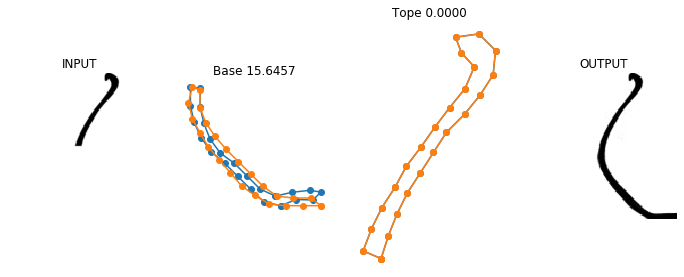

<Figure size 864x360 with 0 Axes>

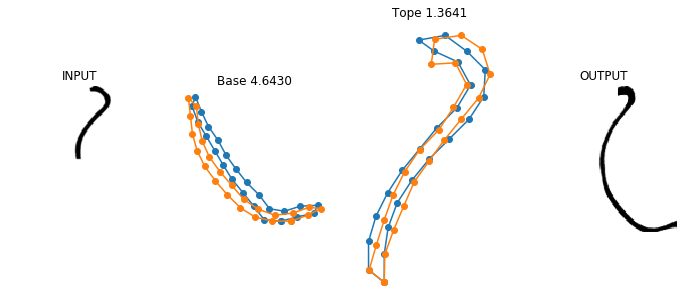

<Figure size 864x360 with 0 Axes>

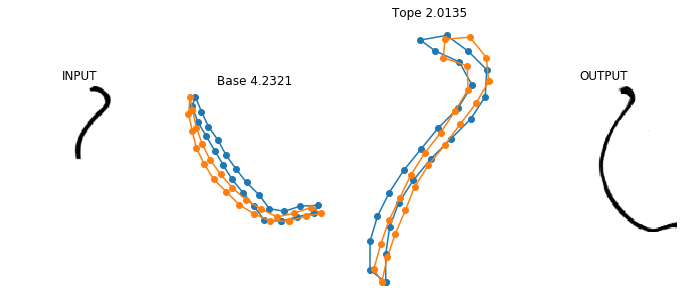

<Figure size 864x360 with 0 Axes>

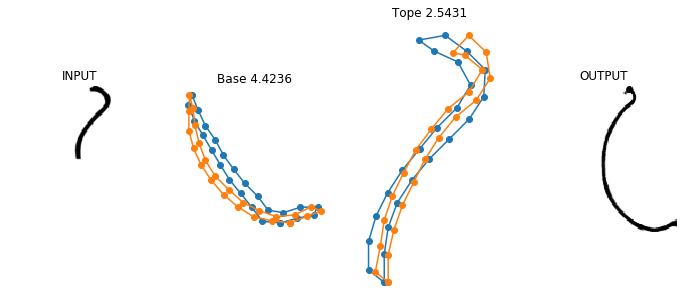

<Figure size 864x360 with 0 Axes>

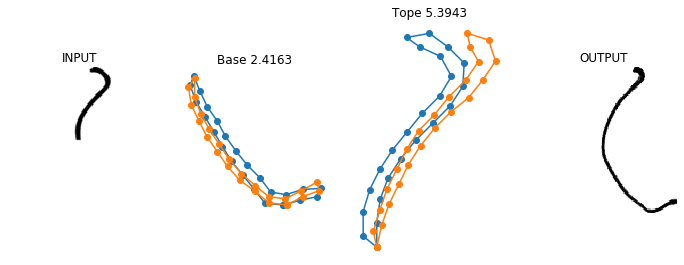

<Figure size 864x360 with 0 Axes>

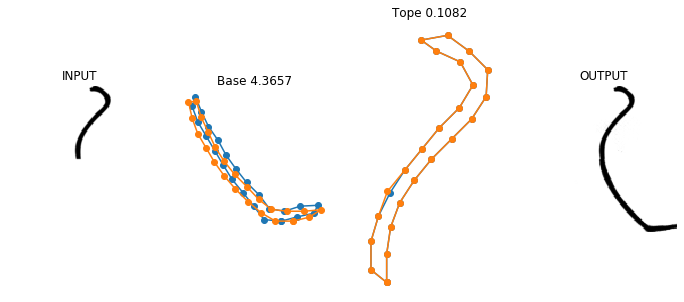

<Figure size 864x360 with 0 Axes>

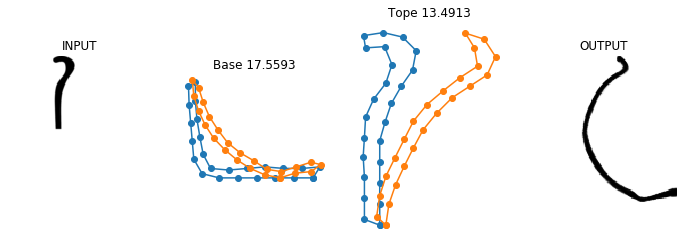

<Figure size 864x360 with 0 Axes>

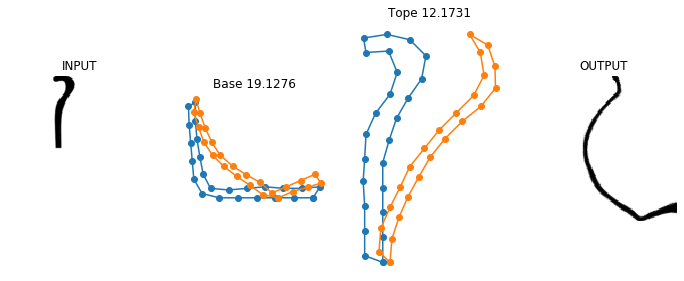

<Figure size 864x360 with 0 Axes>

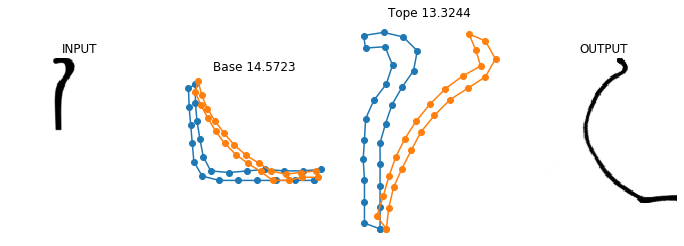

<Figure size 864x360 with 0 Axes>

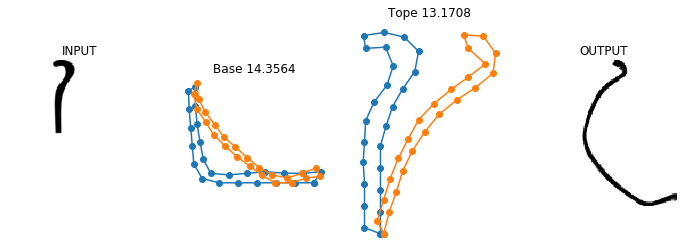

<Figure size 864x360 with 0 Axes>

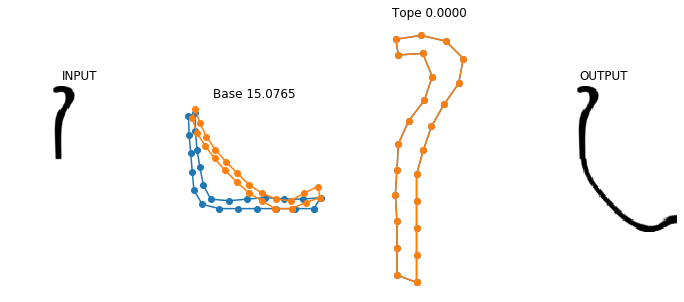

<Figure size 864x360 with 0 Axes>

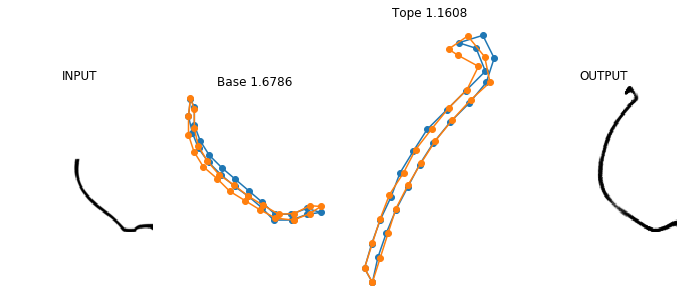

<Figure size 864x360 with 0 Axes>

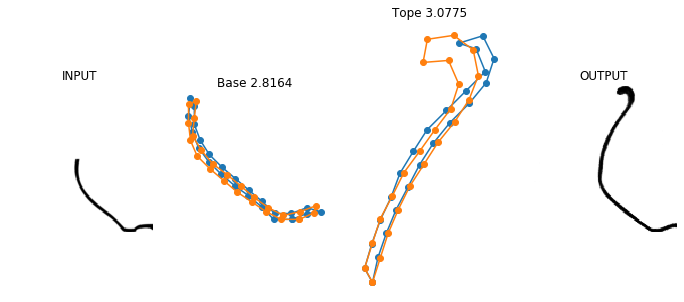

<Figure size 864x360 with 0 Axes>

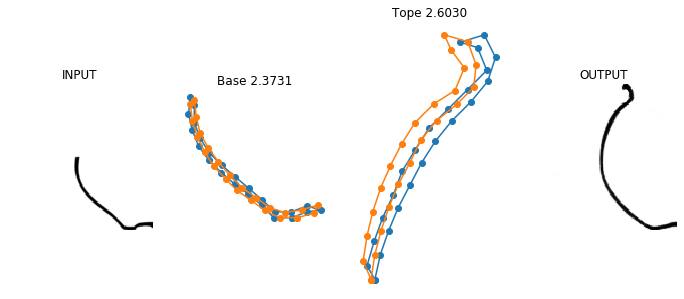

<Figure size 864x360 with 0 Axes>

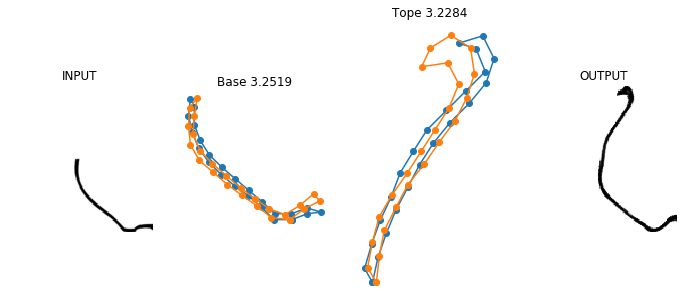

<Figure size 864x360 with 0 Axes>

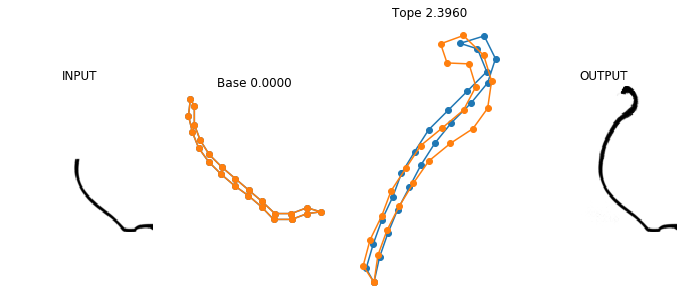

<Figure size 864x360 with 0 Axes>

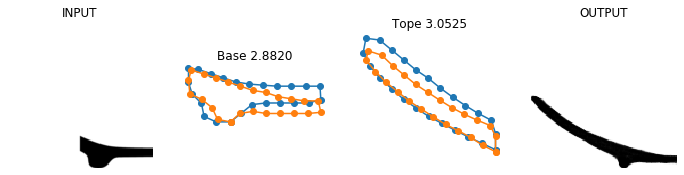

<Figure size 864x360 with 0 Axes>

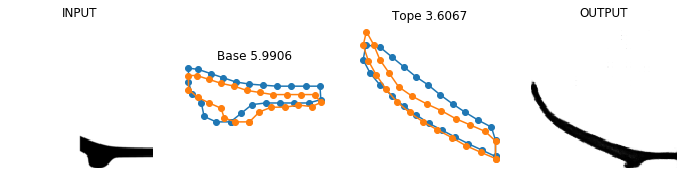

<Figure size 864x360 with 0 Axes>

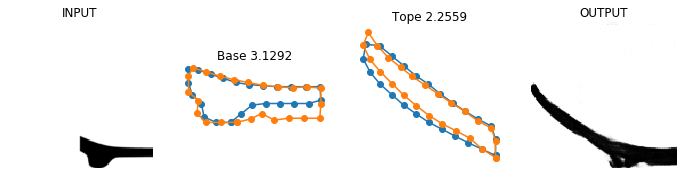

<Figure size 864x360 with 0 Axes>

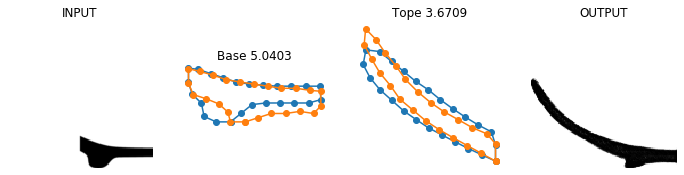

<Figure size 864x360 with 0 Axes>

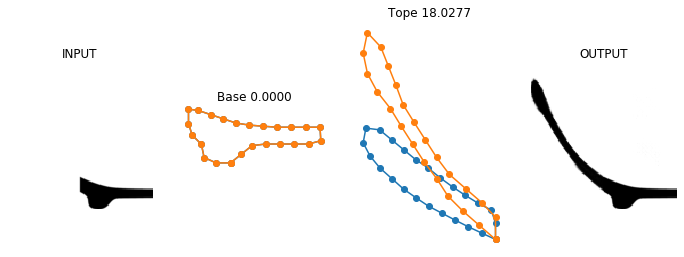

<Figure size 864x360 with 0 Axes>

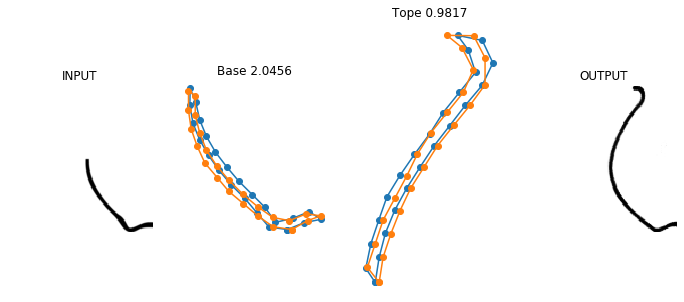

<Figure size 864x360 with 0 Axes>

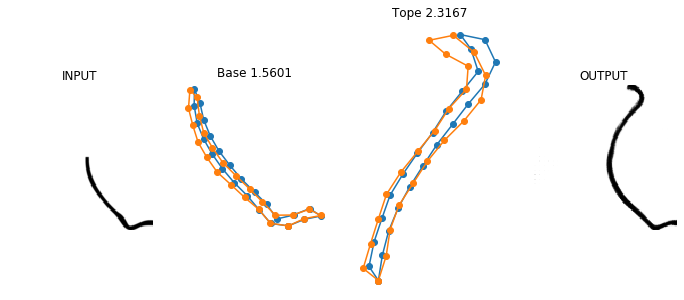

<Figure size 864x360 with 0 Axes>

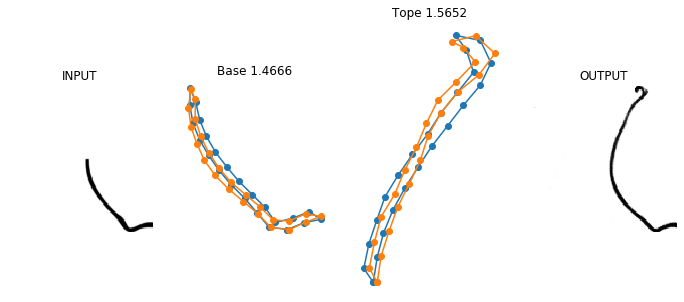

<Figure size 864x360 with 0 Axes>

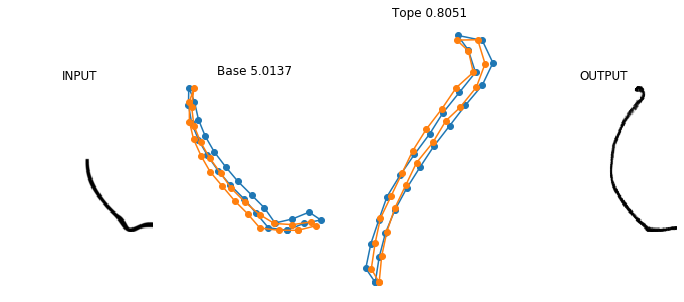

<Figure size 864x360 with 0 Axes>

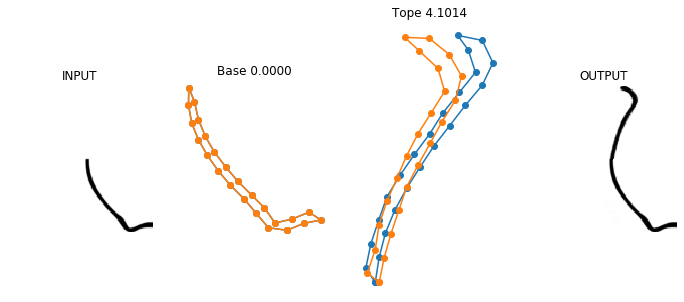

<Figure size 864x360 with 0 Axes>

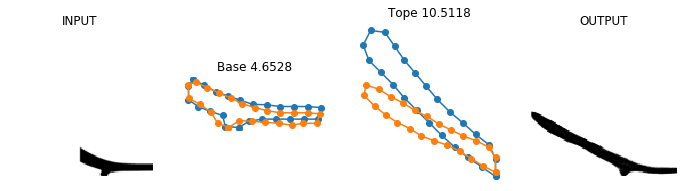

<Figure size 864x360 with 0 Axes>

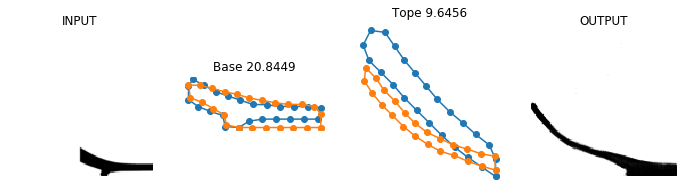

<Figure size 864x360 with 0 Axes>

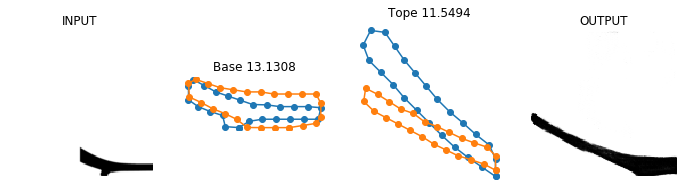

<Figure size 864x360 with 0 Axes>

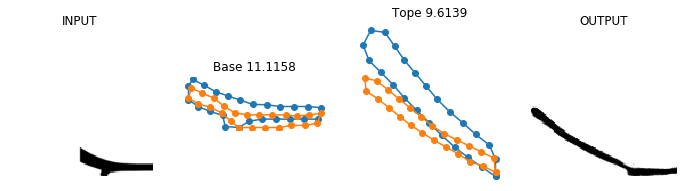

<Figure size 864x360 with 0 Axes>

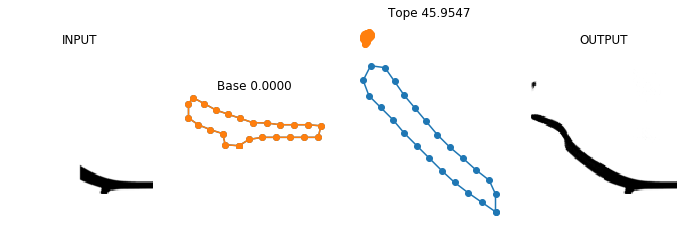

<Figure size 864x360 with 0 Axes>

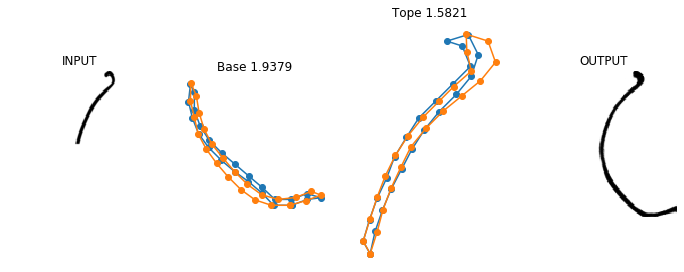

<Figure size 864x360 with 0 Axes>

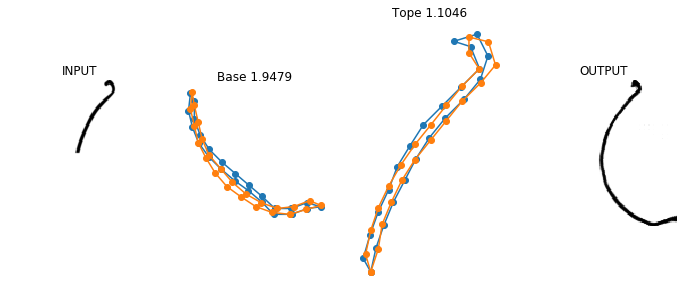

<Figure size 864x360 with 0 Axes>

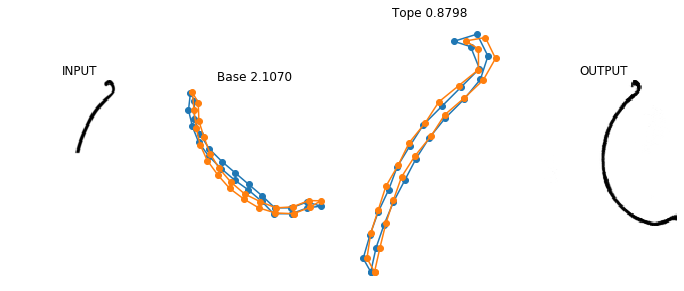

<Figure size 864x360 with 0 Axes>

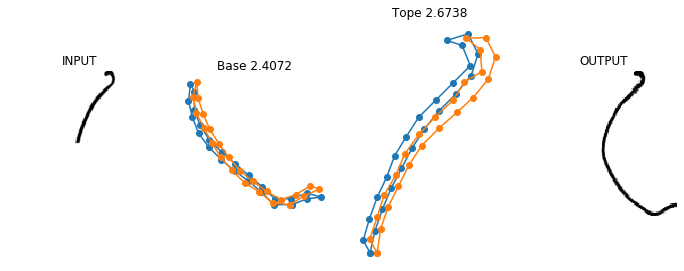

<Figure size 864x360 with 0 Axes>

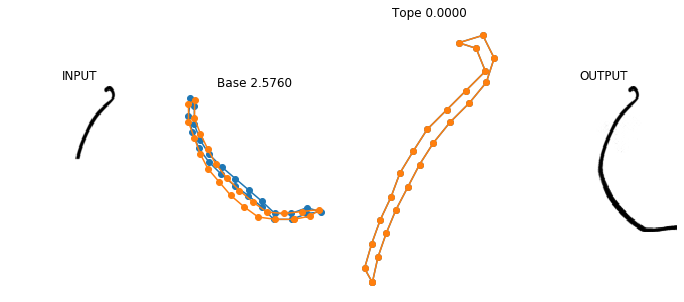

<Figure size 864x360 with 0 Axes>

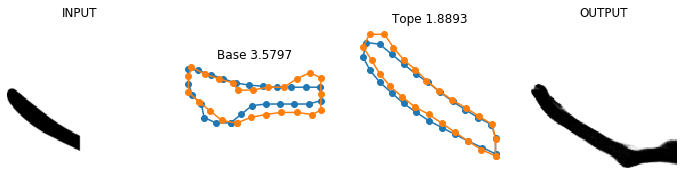

<Figure size 864x360 with 0 Axes>

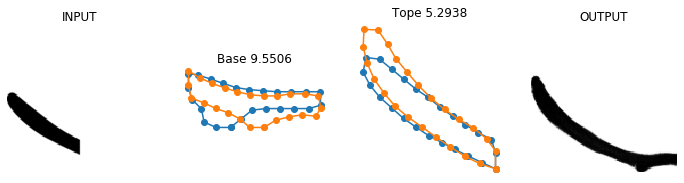

<Figure size 864x360 with 0 Axes>

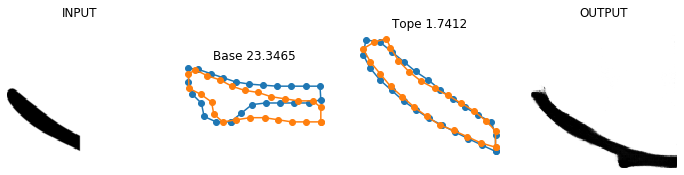

<Figure size 864x360 with 0 Axes>

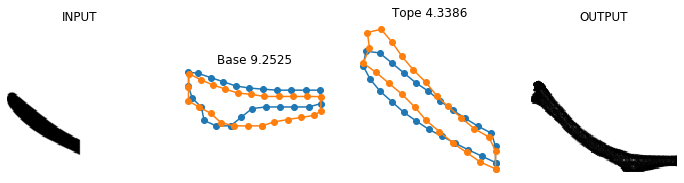

<Figure size 864x360 with 0 Axes>

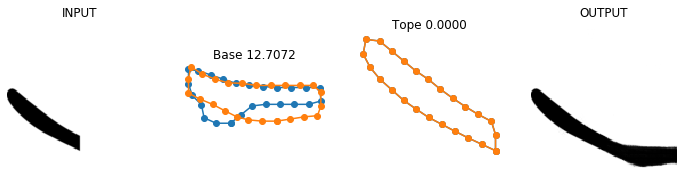

<Figure size 864x360 with 0 Axes>

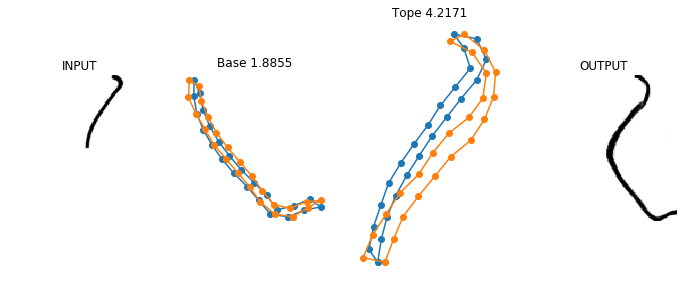

<Figure size 864x360 with 0 Axes>

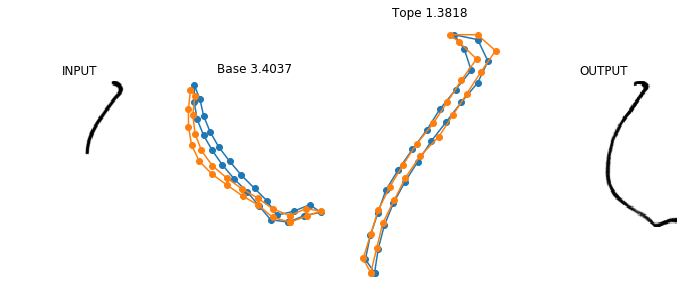

<Figure size 864x360 with 0 Axes>

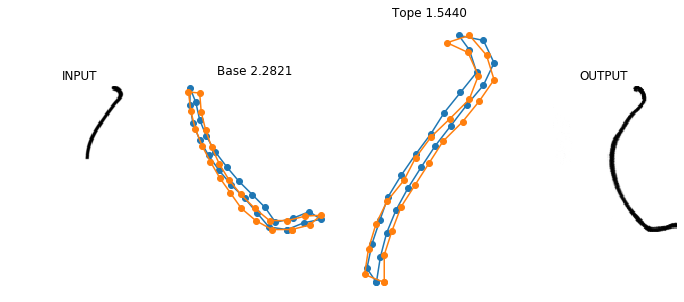

<Figure size 864x360 with 0 Axes>

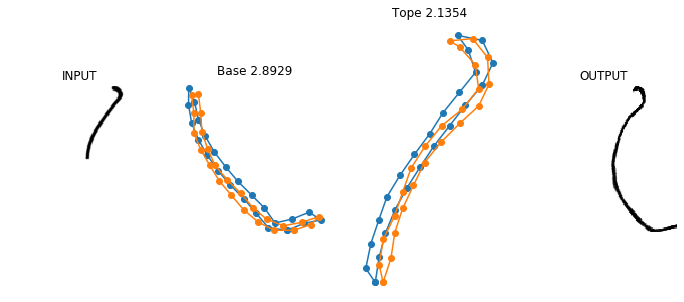

<Figure size 864x360 with 0 Axes>

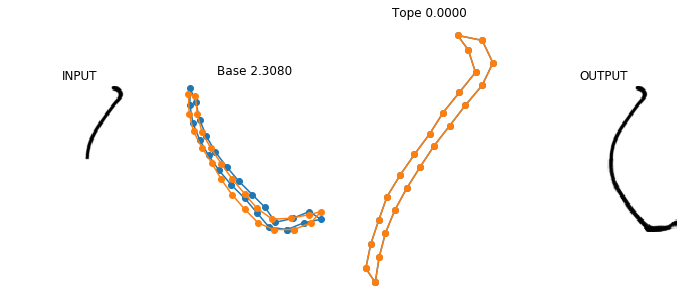

<Figure size 864x360 with 0 Axes>

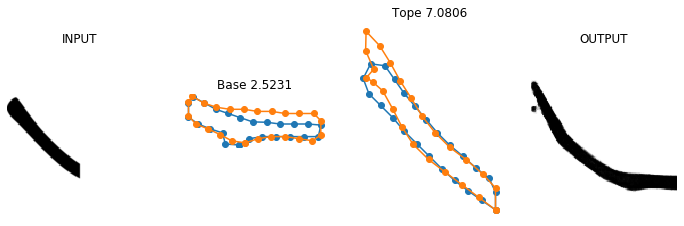

<Figure size 864x360 with 0 Axes>

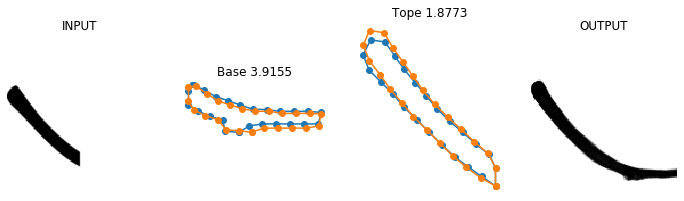

<Figure size 864x360 with 0 Axes>

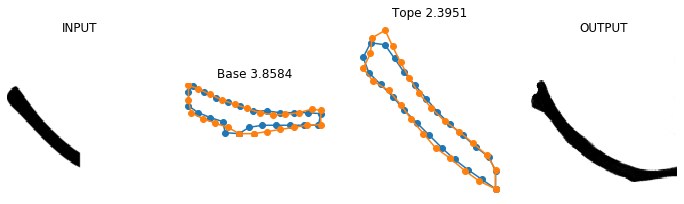

<Figure size 864x360 with 0 Axes>

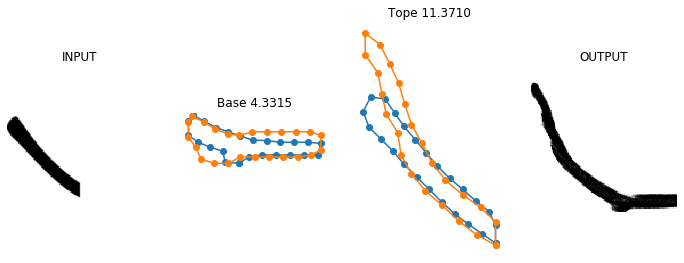

<Figure size 864x360 with 0 Axes>

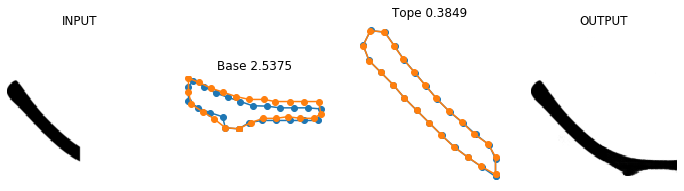

<Figure size 864x360 with 0 Axes>

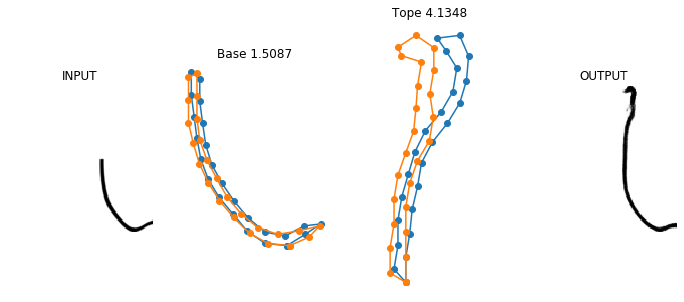

<Figure size 864x360 with 0 Axes>

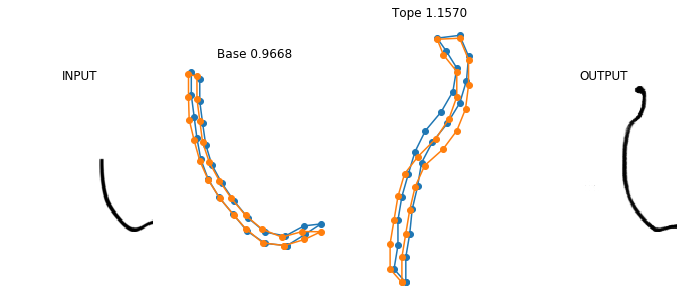

<Figure size 864x360 with 0 Axes>

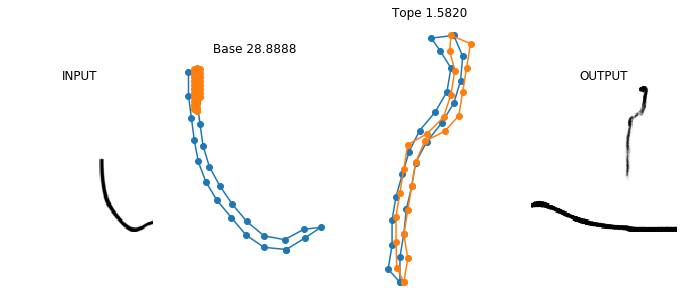

<Figure size 864x360 with 0 Axes>

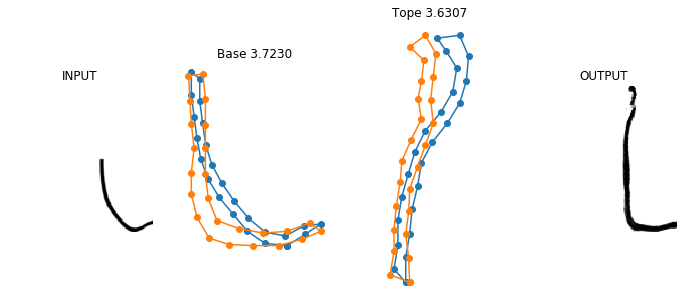

<Figure size 864x360 with 0 Axes>

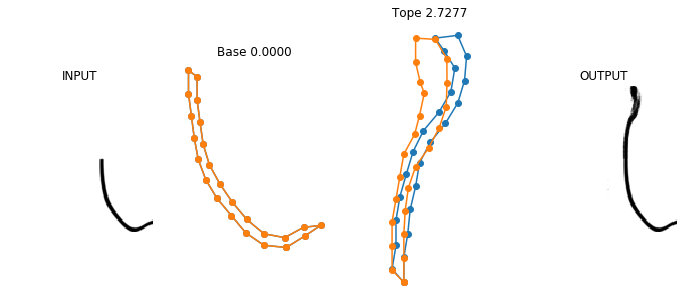

<Figure size 864x360 with 0 Axes>

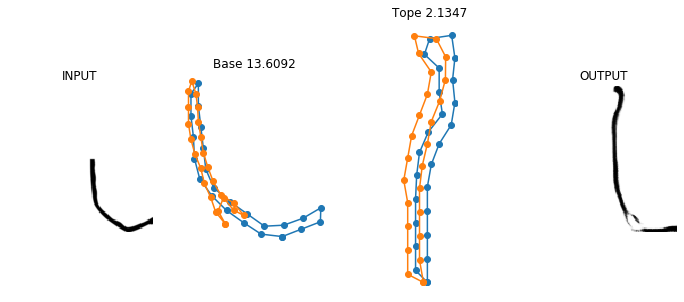

<Figure size 864x360 with 0 Axes>

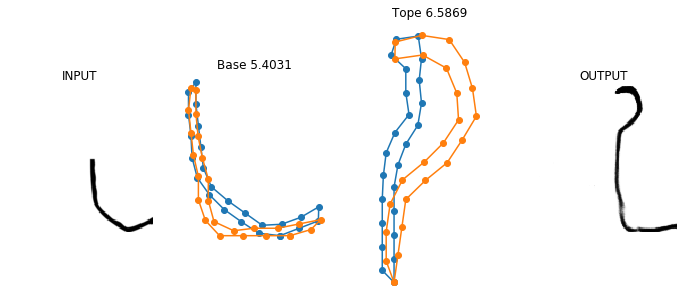

<Figure size 864x360 with 0 Axes>

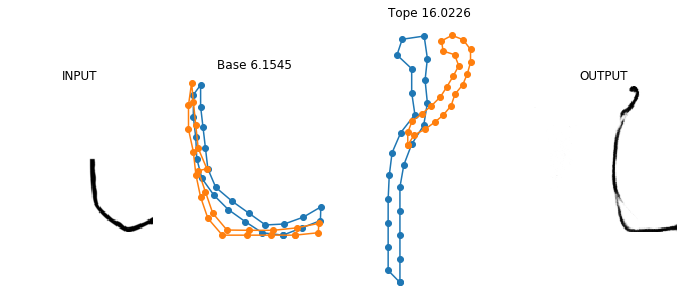

<Figure size 864x360 with 0 Axes>

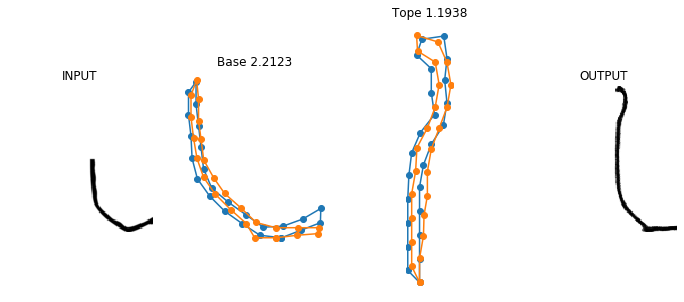

<Figure size 864x360 with 0 Axes>

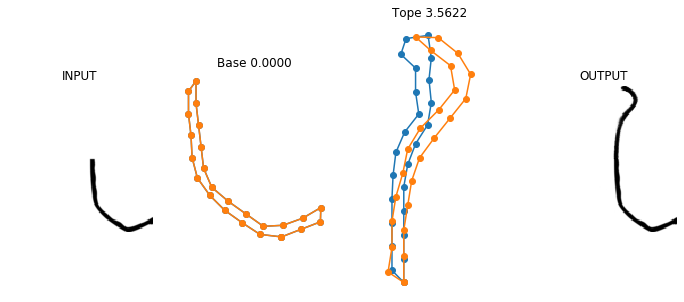

<Figure size 864x360 with 0 Axes>

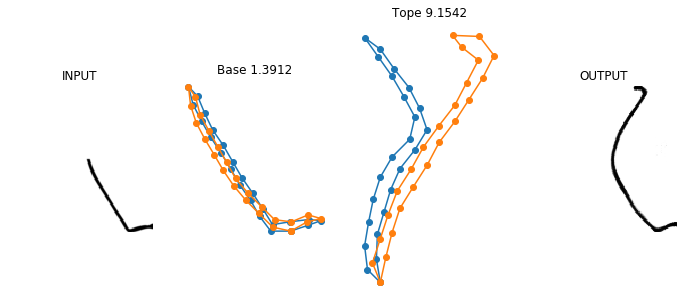

<Figure size 864x360 with 0 Axes>

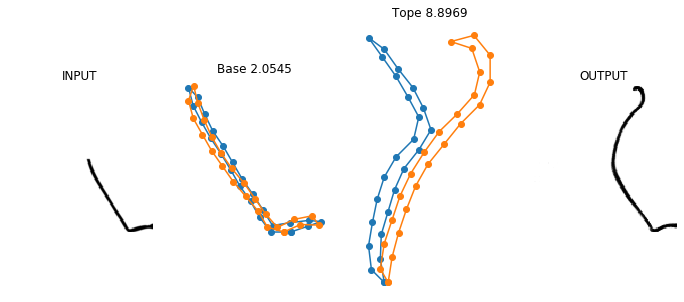

<Figure size 864x360 with 0 Axes>

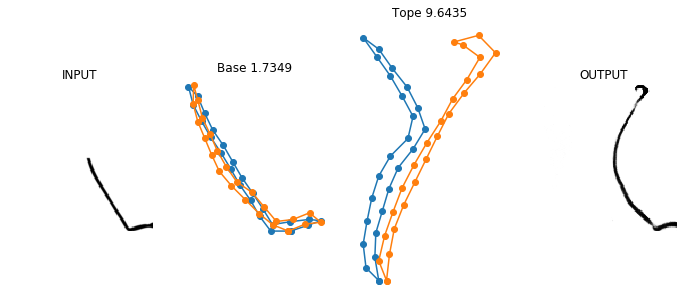

<Figure size 864x360 with 0 Axes>

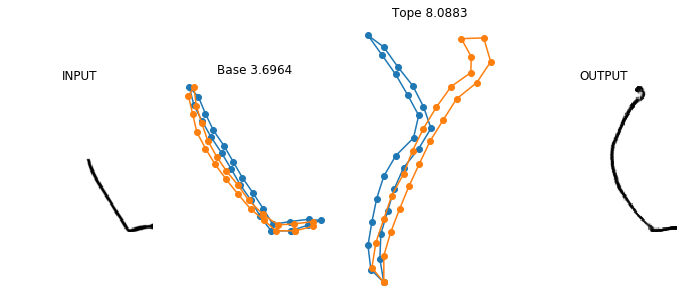

<Figure size 864x360 with 0 Axes>

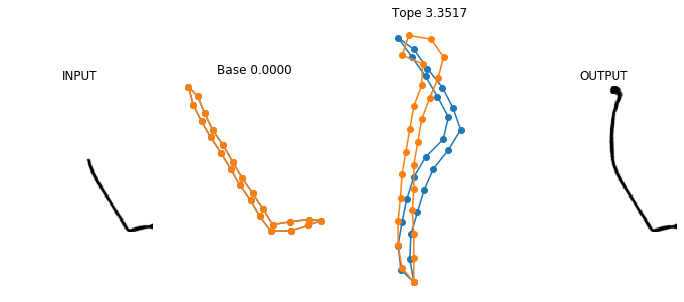

<Figure size 864x360 with 0 Axes>

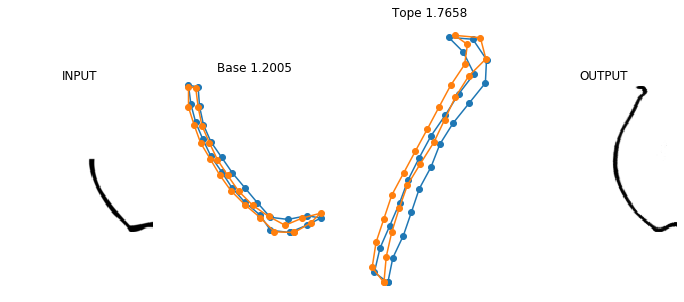

<Figure size 864x360 with 0 Axes>

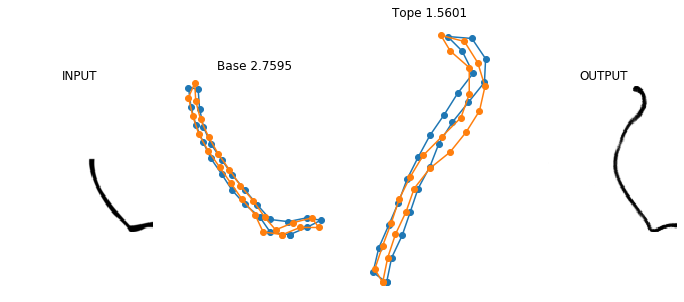

<Figure size 864x360 with 0 Axes>

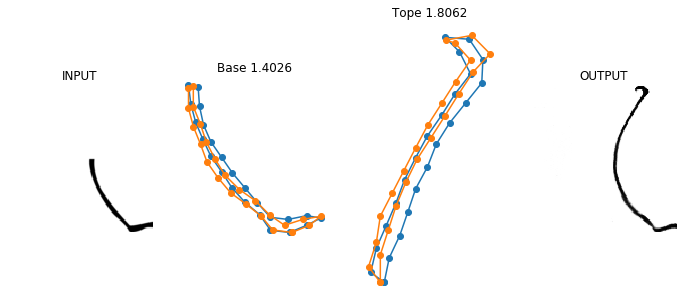

<Figure size 864x360 with 0 Axes>

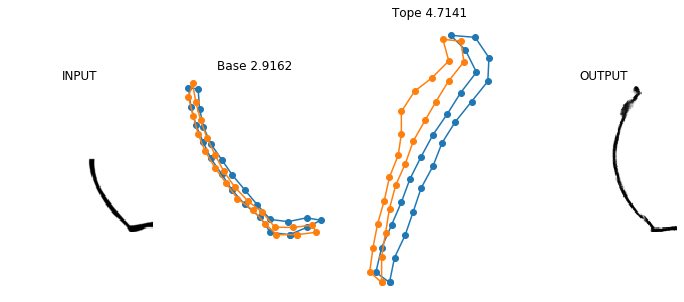

<Figure size 864x360 with 0 Axes>

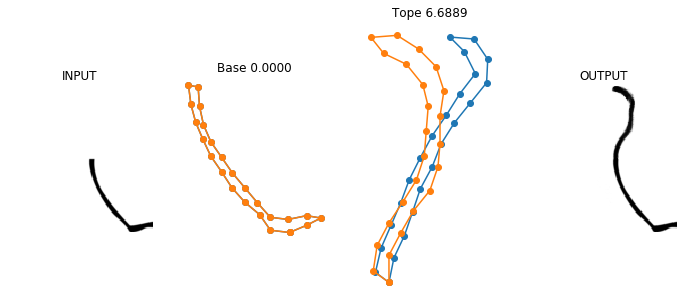

<Figure size 864x360 with 0 Axes>

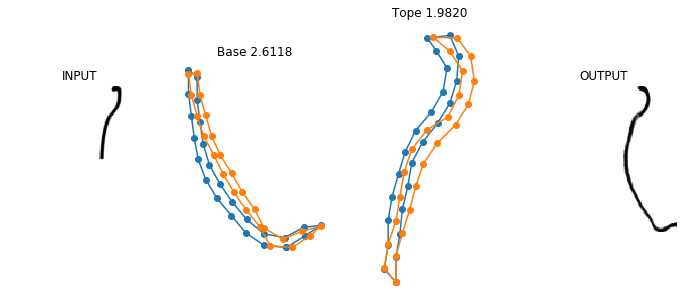

<Figure size 864x360 with 0 Axes>

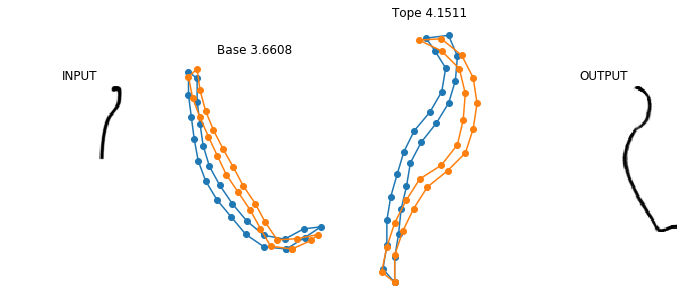

<Figure size 864x360 with 0 Axes>

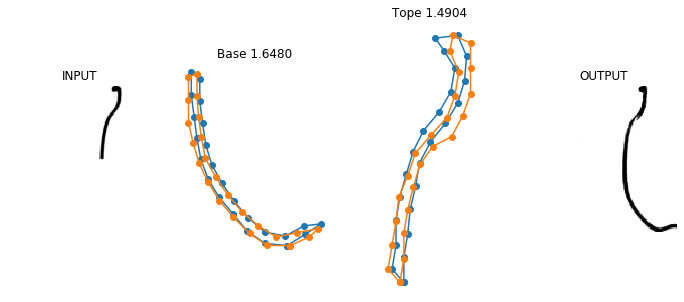

<Figure size 864x360 with 0 Axes>

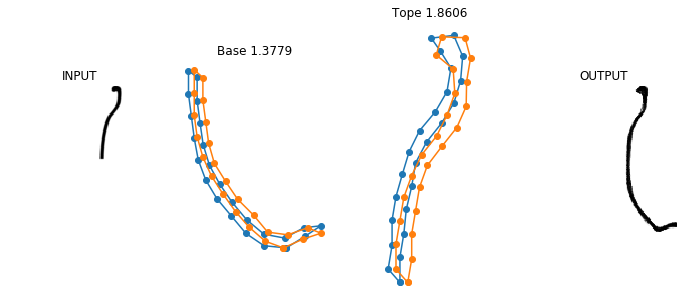

<Figure size 864x360 with 0 Axes>

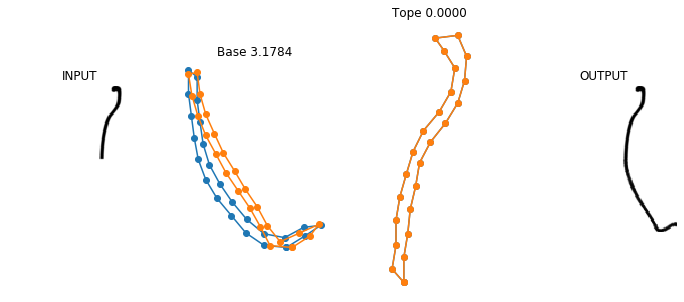

<Figure size 864x360 with 0 Axes>

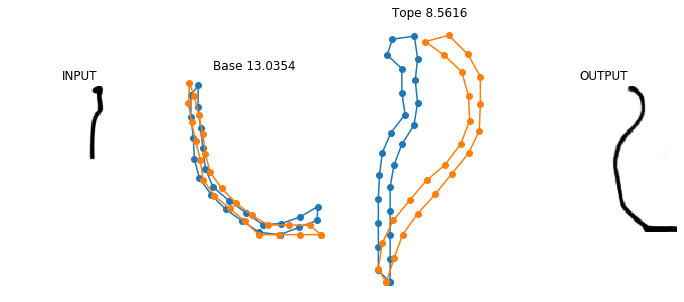

<Figure size 864x360 with 0 Axes>

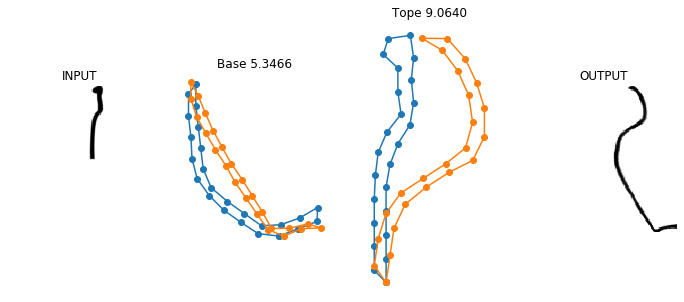

<Figure size 864x360 with 0 Axes>

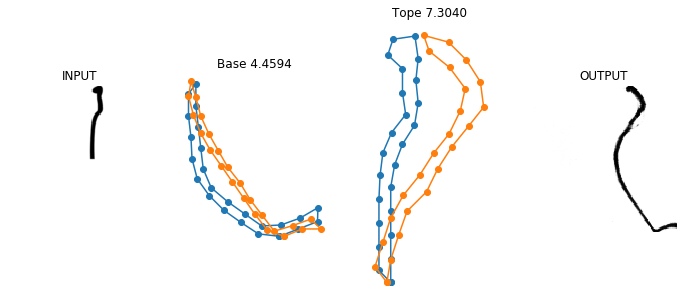

<Figure size 864x360 with 0 Axes>

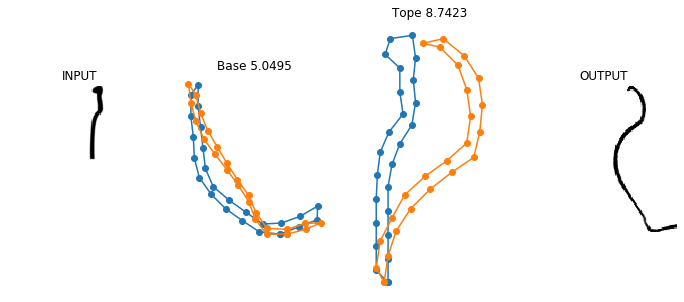

<Figure size 864x360 with 0 Axes>

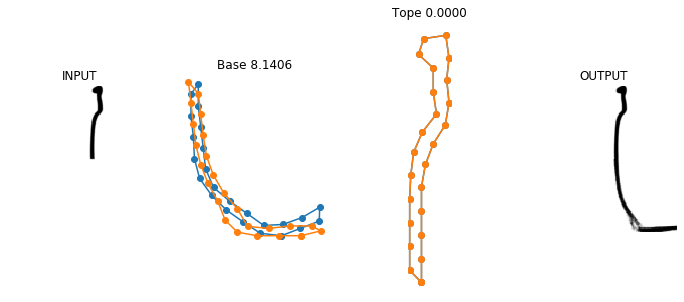

<Figure size 864x360 with 0 Axes>

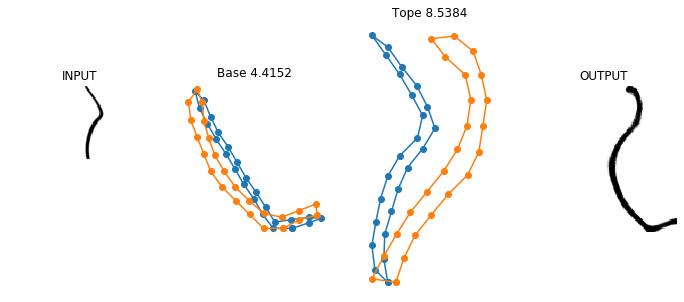

<Figure size 864x360 with 0 Axes>

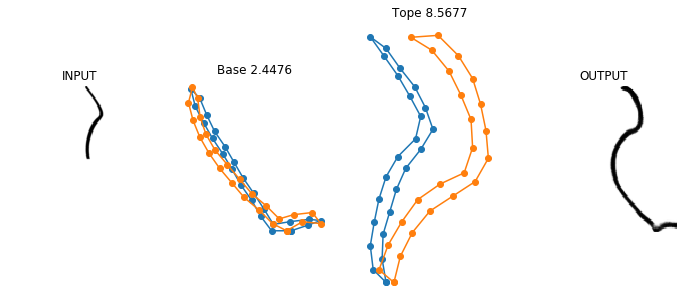

<Figure size 864x360 with 0 Axes>

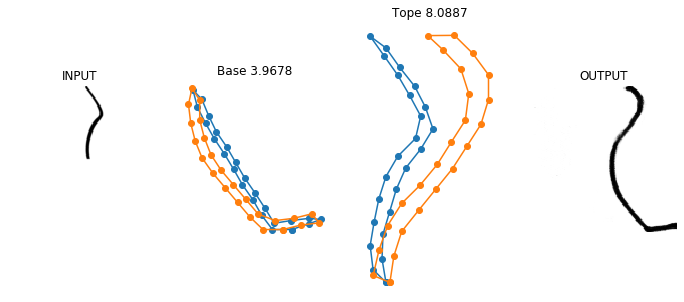

<Figure size 864x360 with 0 Axes>

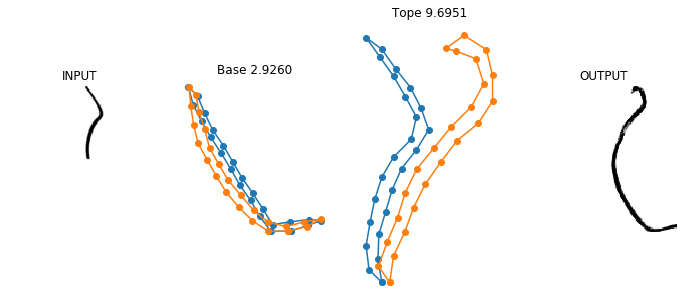

<Figure size 864x360 with 0 Axes>

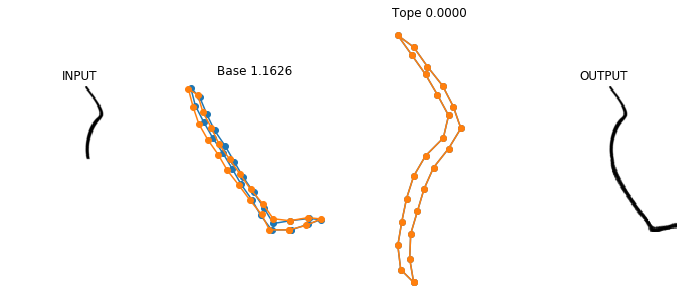

<Figure size 864x360 with 0 Axes>

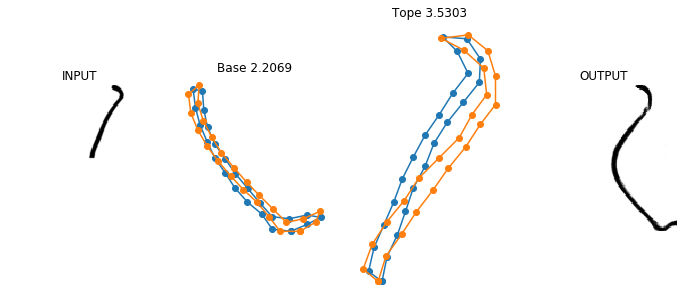

<Figure size 864x360 with 0 Axes>

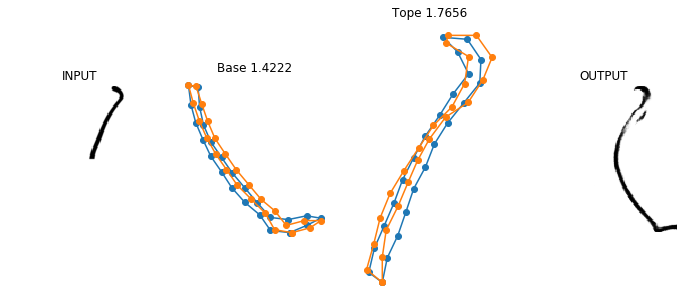

<Figure size 864x360 with 0 Axes>

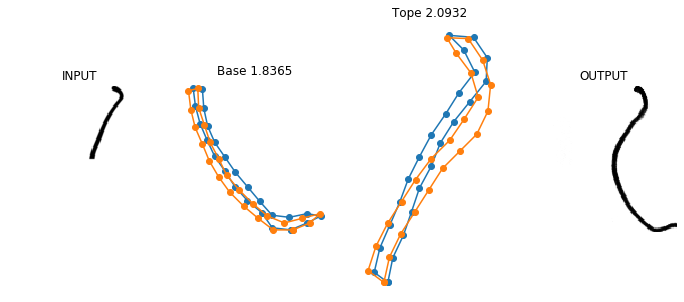

<Figure size 864x360 with 0 Axes>

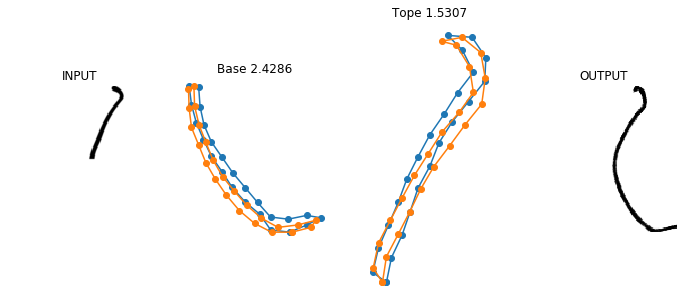

<Figure size 864x360 with 0 Axes>

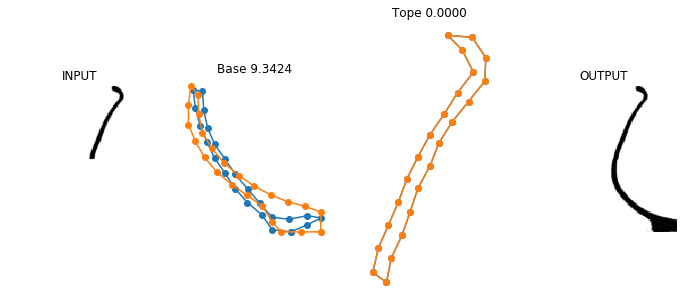

<Figure size 864x360 with 0 Axes>

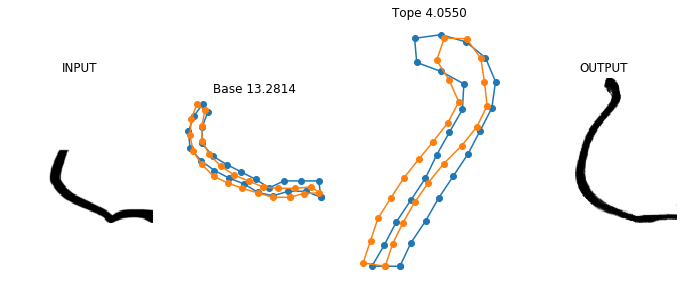

<Figure size 864x360 with 0 Axes>

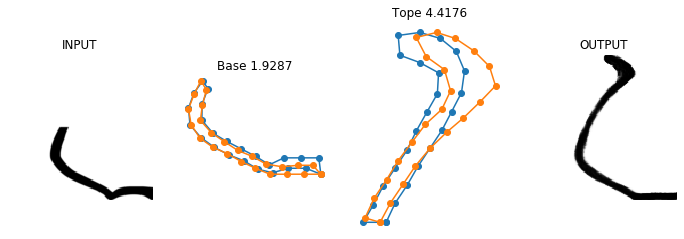

<Figure size 864x360 with 0 Axes>

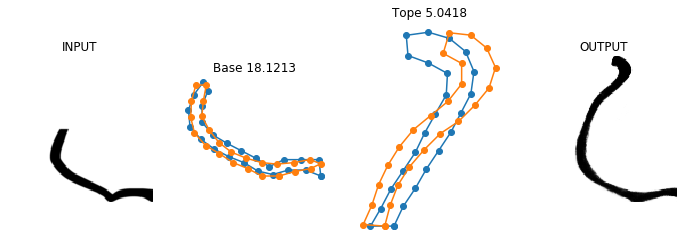

<Figure size 864x360 with 0 Axes>

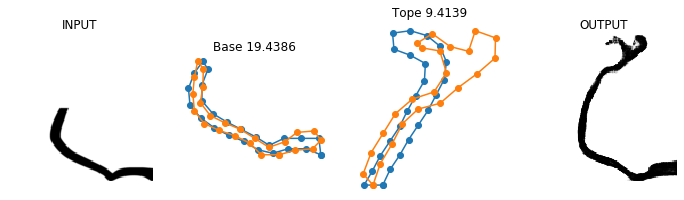

<Figure size 864x360 with 0 Axes>

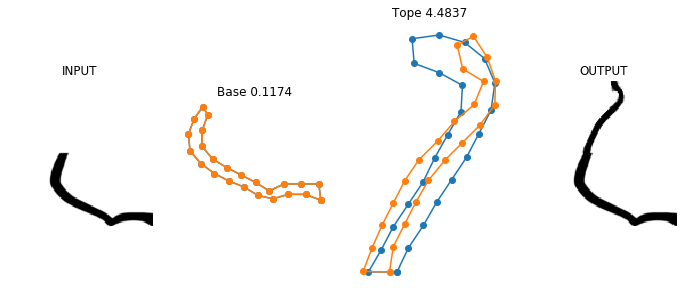

<Figure size 864x360 with 0 Axes>

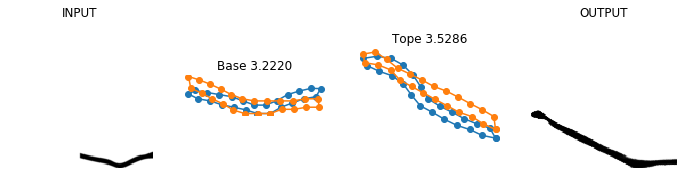

<Figure size 864x360 with 0 Axes>

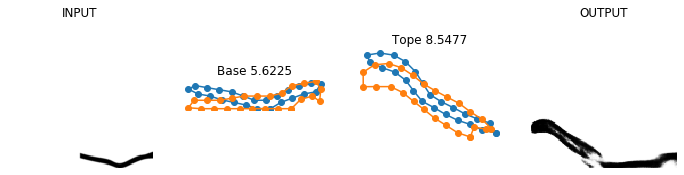

<Figure size 864x360 with 0 Axes>

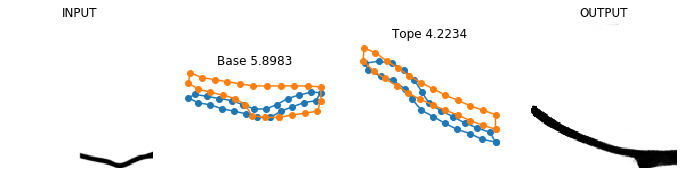

<Figure size 864x360 with 0 Axes>

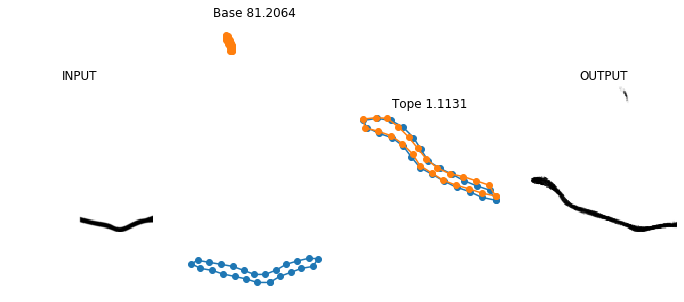

<Figure size 864x360 with 0 Axes>

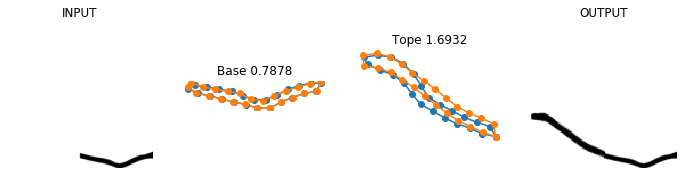

<Figure size 864x360 with 0 Axes>

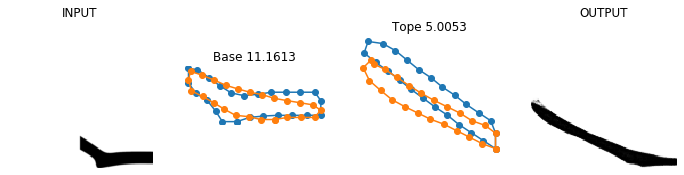

<Figure size 864x360 with 0 Axes>

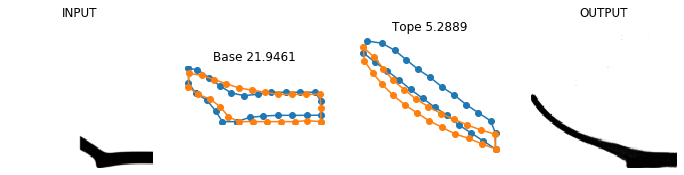

<Figure size 864x360 with 0 Axes>

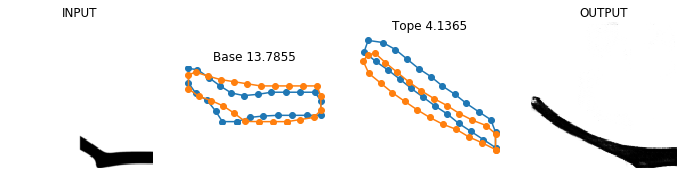

<Figure size 864x360 with 0 Axes>

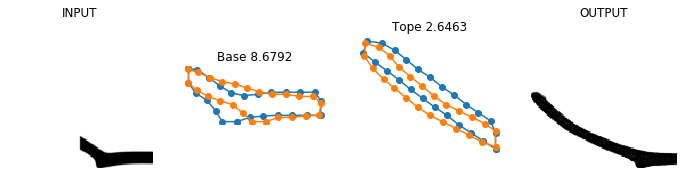

<Figure size 864x360 with 0 Axes>

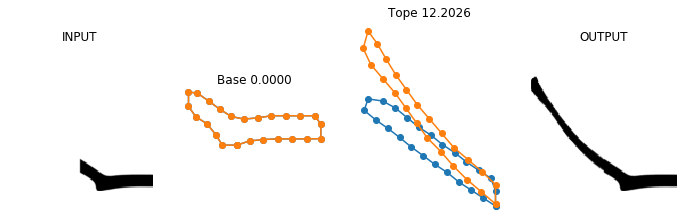

<Figure size 864x360 with 0 Axes>

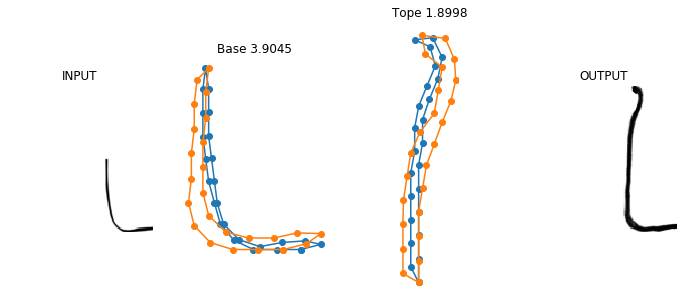

<Figure size 864x360 with 0 Axes>

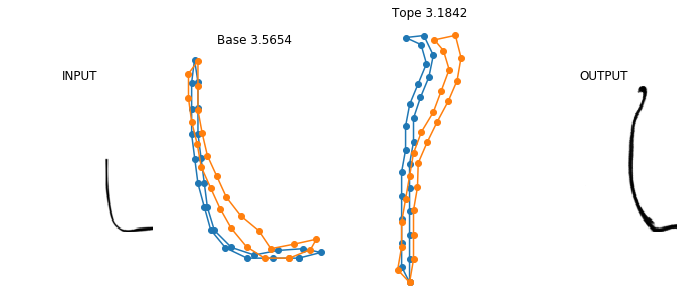

<Figure size 864x360 with 0 Axes>

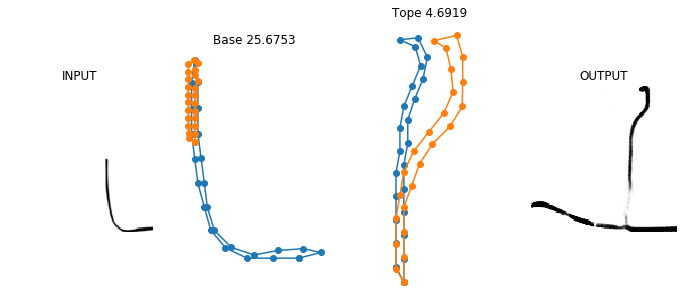

<Figure size 864x360 with 0 Axes>

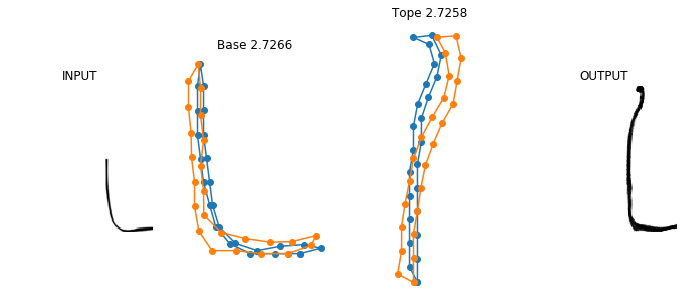

<Figure size 864x360 with 0 Axes>

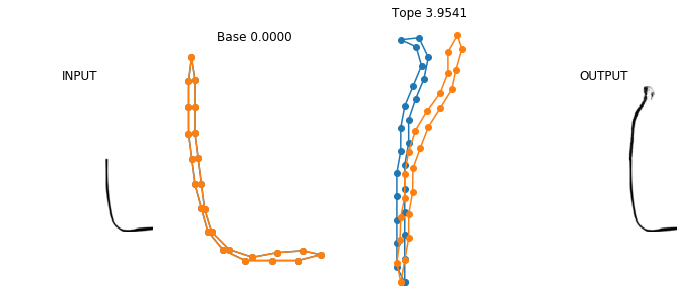

<Figure size 864x360 with 0 Axes>

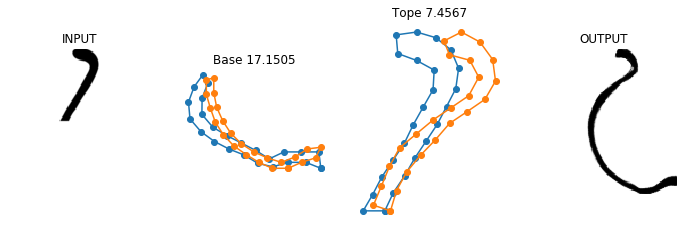

<Figure size 864x360 with 0 Axes>

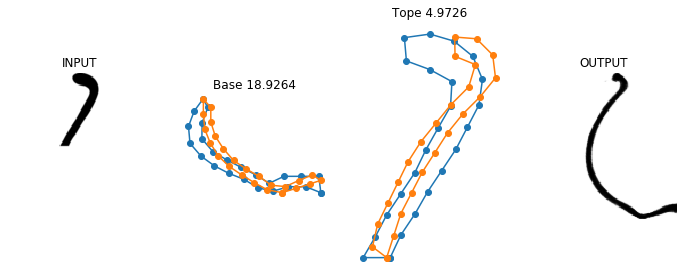

<Figure size 864x360 with 0 Axes>

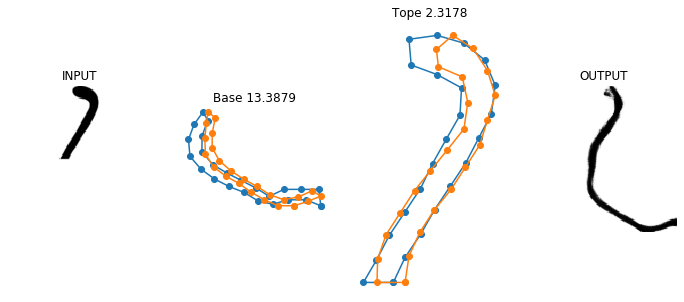

<Figure size 864x360 with 0 Axes>

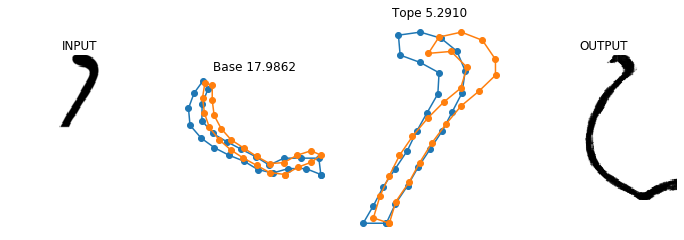

<Figure size 864x360 with 0 Axes>

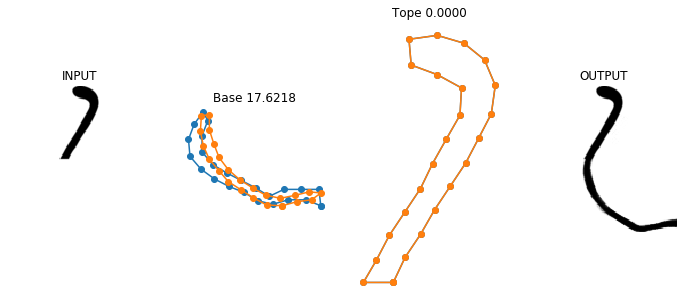

<Figure size 864x360 with 0 Axes>

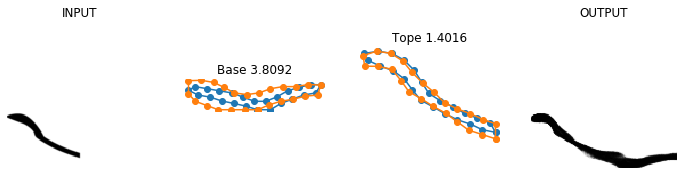

<Figure size 864x360 with 0 Axes>

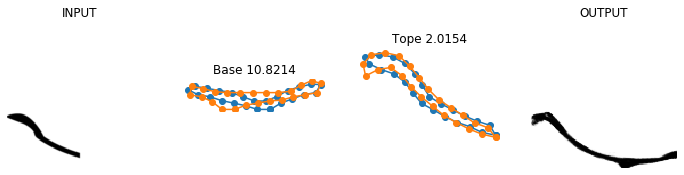

<Figure size 864x360 with 0 Axes>

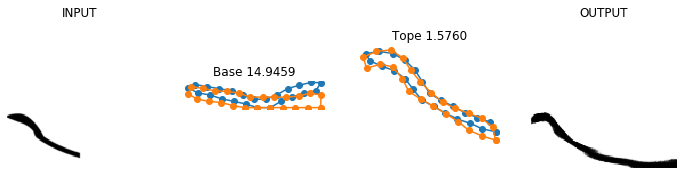

<Figure size 864x360 with 0 Axes>

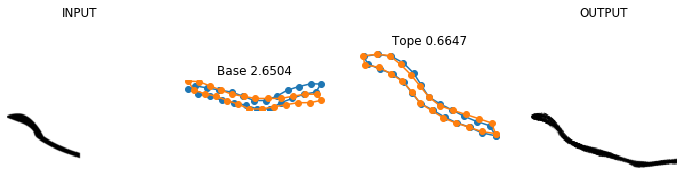

<Figure size 864x360 with 0 Axes>

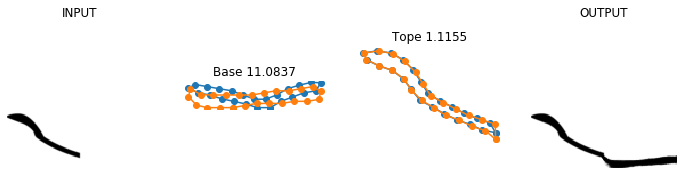

<Figure size 864x360 with 0 Axes>

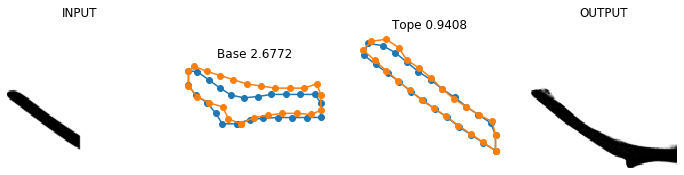

<Figure size 864x360 with 0 Axes>

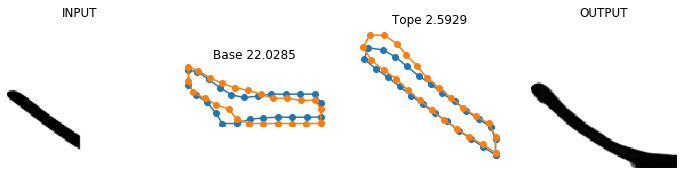

<Figure size 864x360 with 0 Axes>

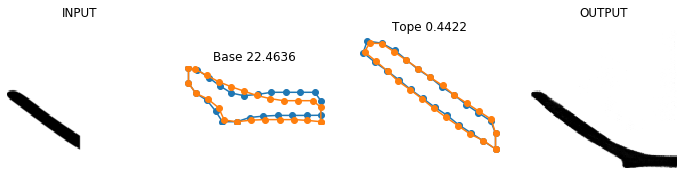

<Figure size 864x360 with 0 Axes>

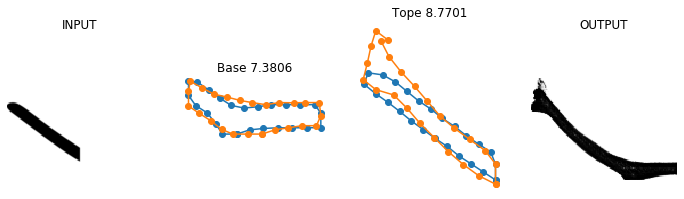

<Figure size 864x360 with 0 Axes>

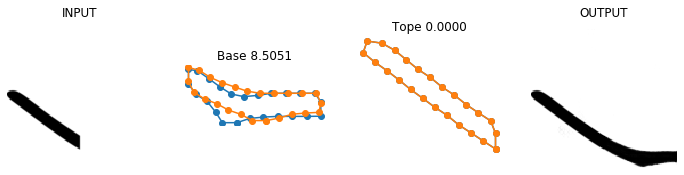

<Figure size 864x360 with 0 Axes>

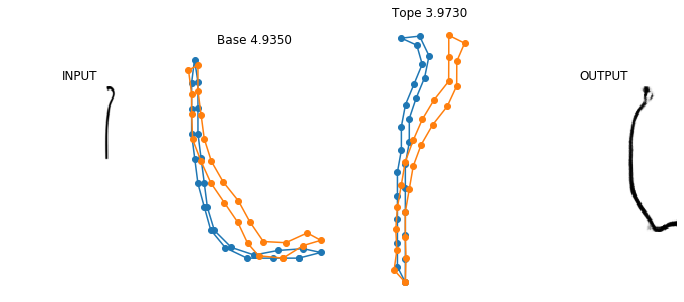

<Figure size 864x360 with 0 Axes>

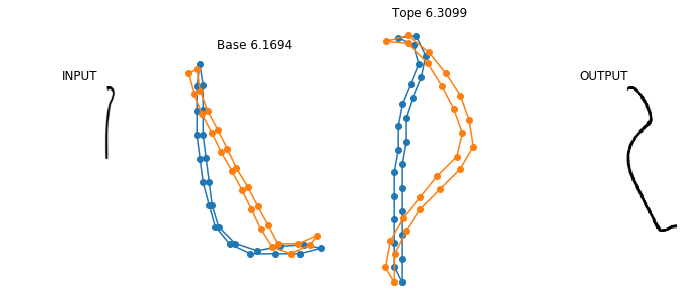

<Figure size 864x360 with 0 Axes>

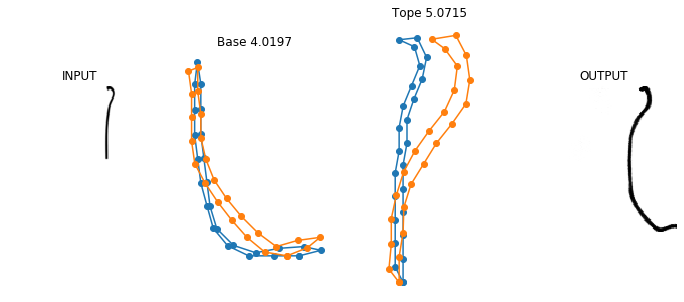

<Figure size 864x360 with 0 Axes>

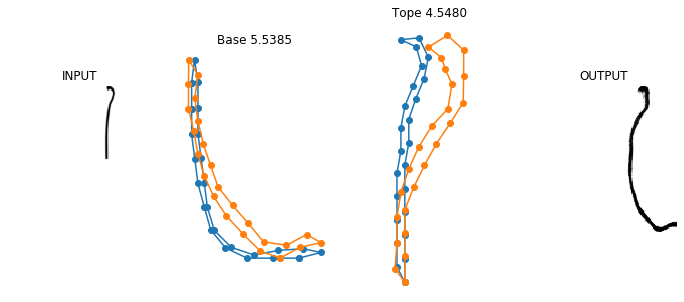

<Figure size 864x360 with 0 Axes>

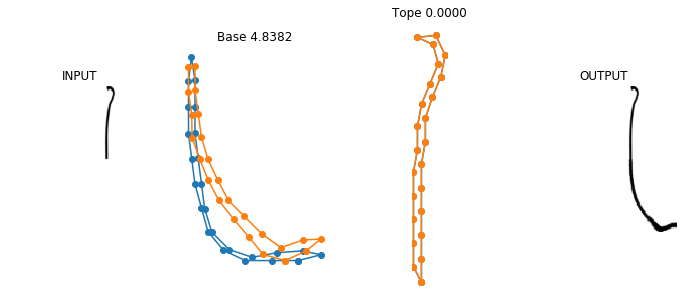

<Figure size 864x360 with 0 Axes>

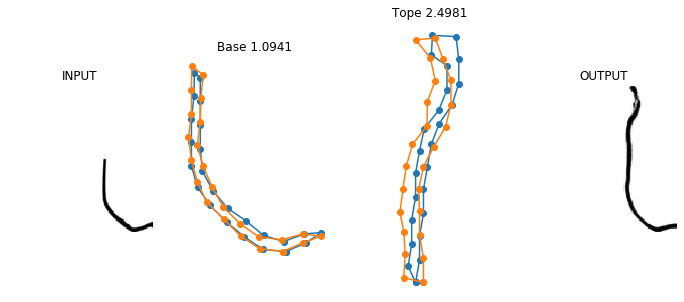

<Figure size 864x360 with 0 Axes>

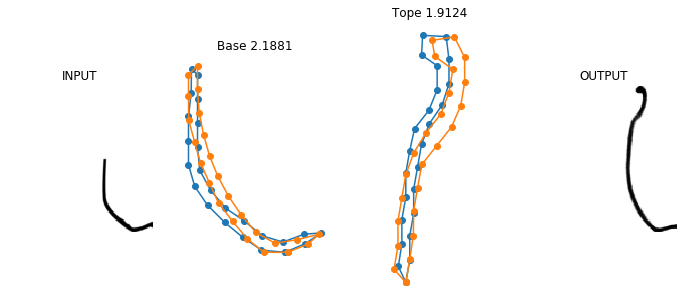

<Figure size 864x360 with 0 Axes>

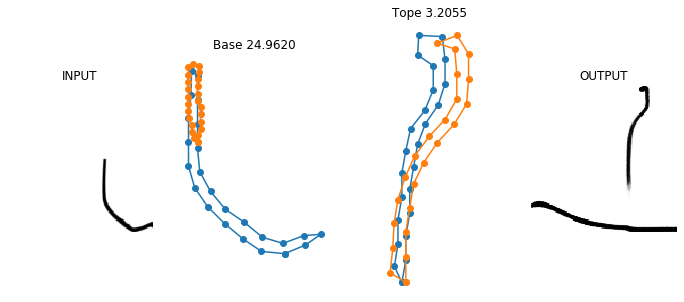

<Figure size 864x360 with 0 Axes>

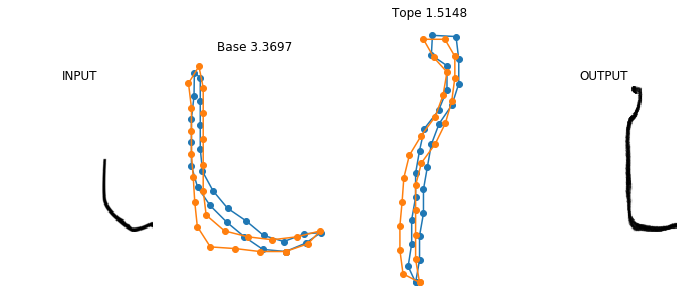

<Figure size 864x360 with 0 Axes>

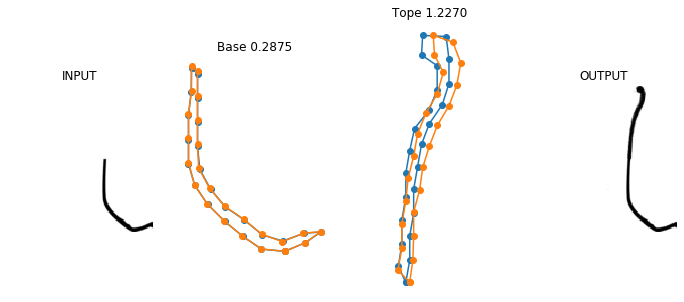

<Figure size 864x360 with 0 Axes>

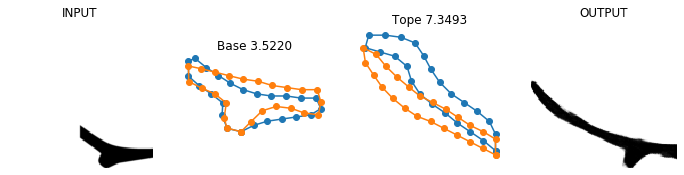

<Figure size 864x360 with 0 Axes>

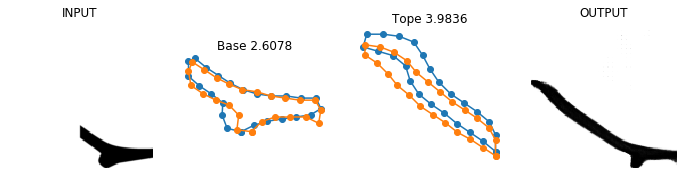

<Figure size 864x360 with 0 Axes>

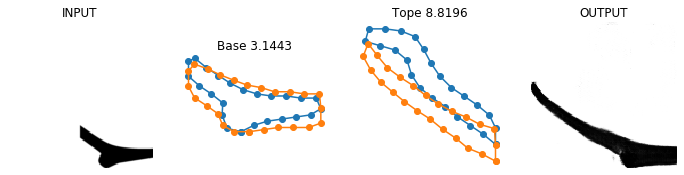

<Figure size 864x360 with 0 Axes>

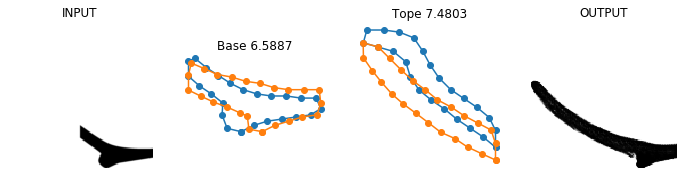

<Figure size 864x360 with 0 Axes>

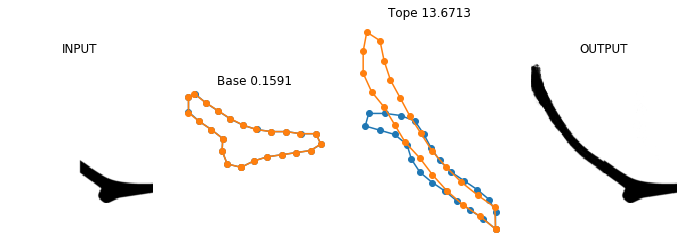

<Figure size 864x360 with 0 Axes>

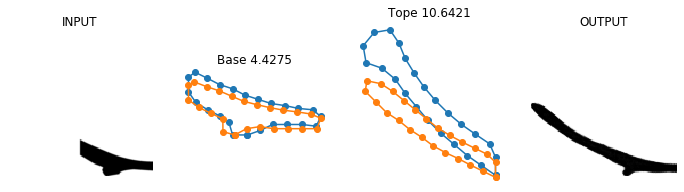

<Figure size 864x360 with 0 Axes>

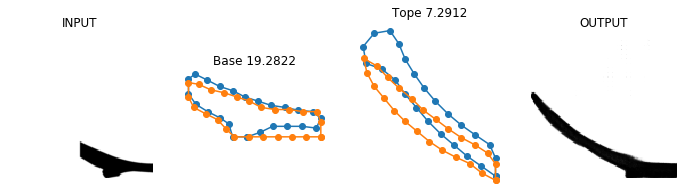

<Figure size 864x360 with 0 Axes>

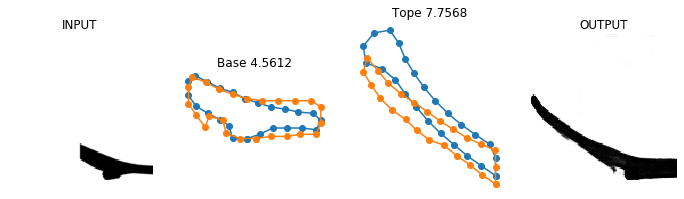

<Figure size 864x360 with 0 Axes>

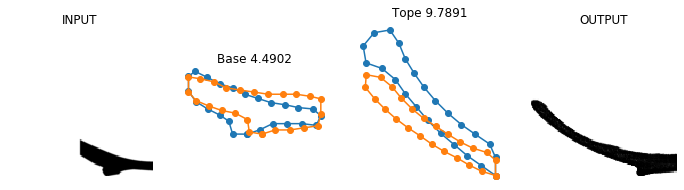

<Figure size 864x360 with 0 Axes>

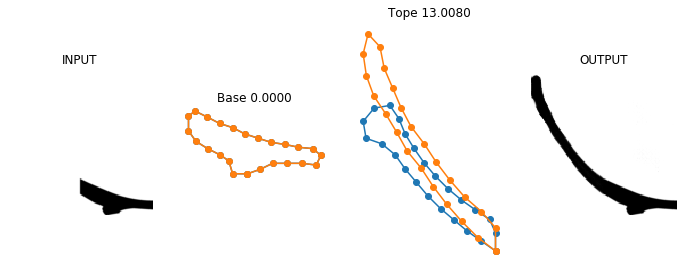

<Figure size 864x360 with 0 Axes>

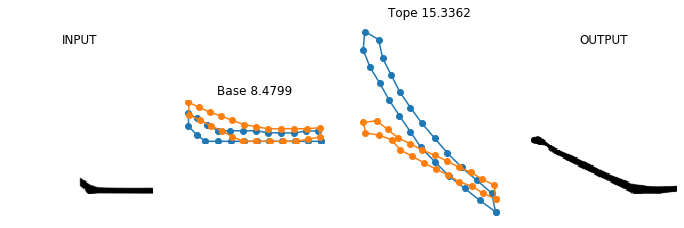

<Figure size 864x360 with 0 Axes>

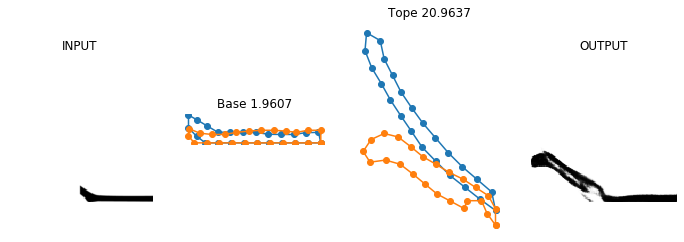

<Figure size 864x360 with 0 Axes>

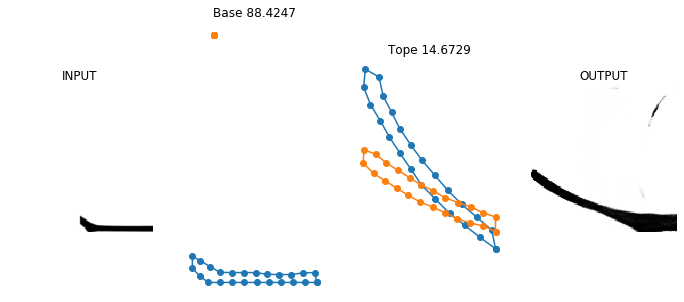

<Figure size 864x360 with 0 Axes>

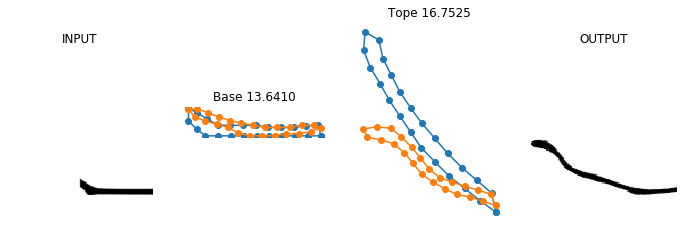

<Figure size 864x360 with 0 Axes>

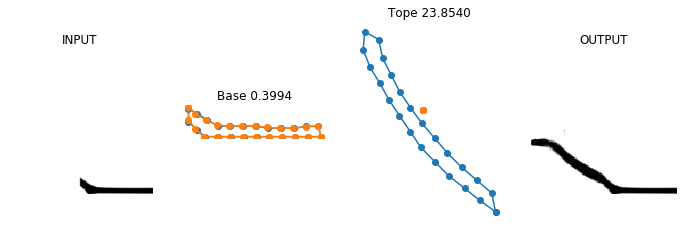

<Figure size 864x360 with 0 Axes>

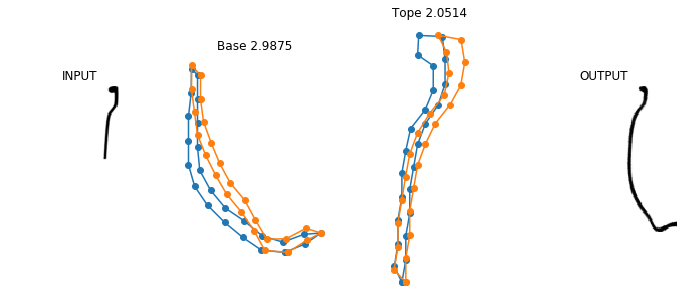

<Figure size 864x360 with 0 Axes>

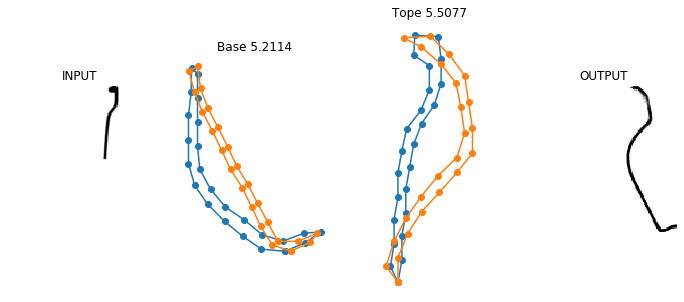

<Figure size 864x360 with 0 Axes>

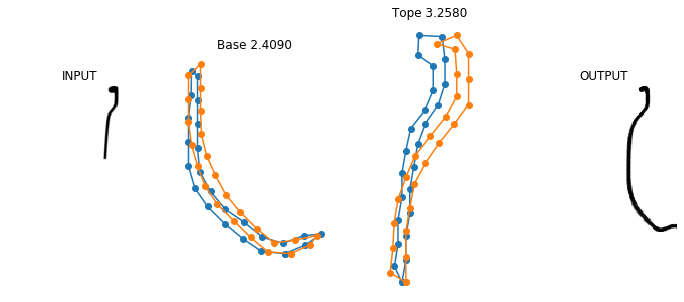

<Figure size 864x360 with 0 Axes>

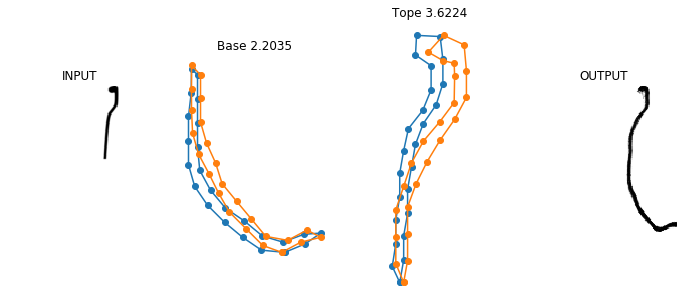

<Figure size 864x360 with 0 Axes>

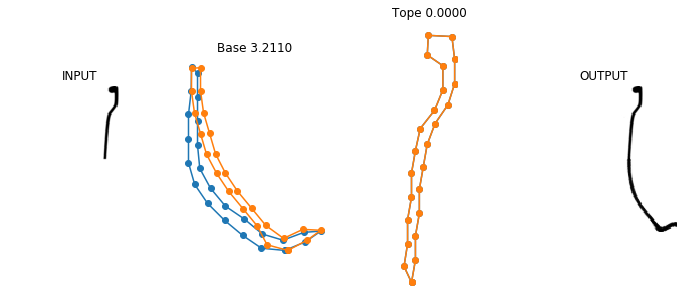

<Figure size 864x360 with 0 Axes>

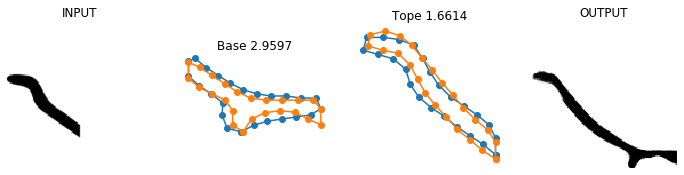

<Figure size 864x360 with 0 Axes>

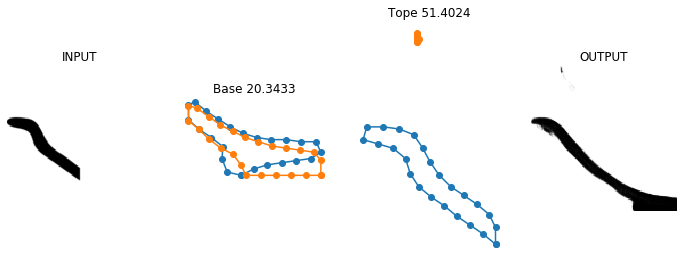

<Figure size 864x360 with 0 Axes>

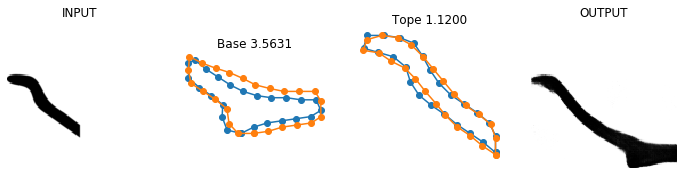

<Figure size 864x360 with 0 Axes>

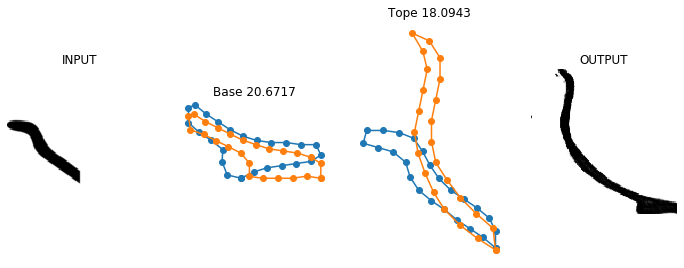

<Figure size 864x360 with 0 Axes>

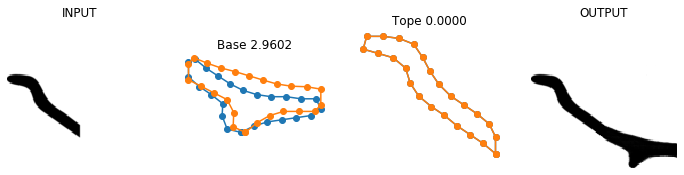

<Figure size 864x360 with 0 Axes>

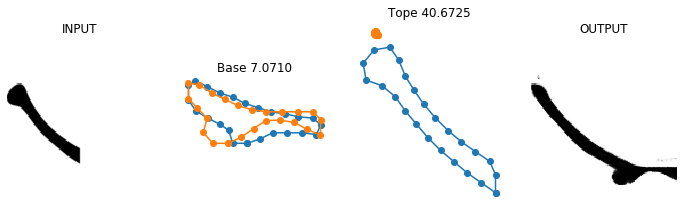

<Figure size 864x360 with 0 Axes>

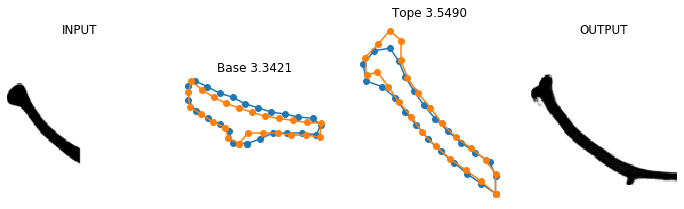

<Figure size 864x360 with 0 Axes>

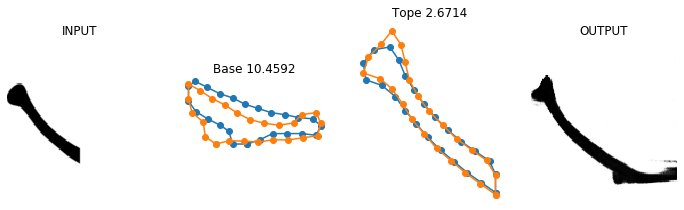

<Figure size 864x360 with 0 Axes>

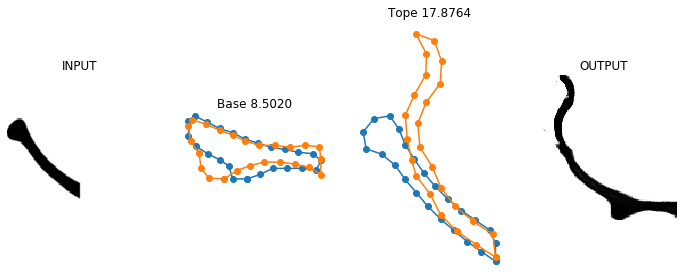

<Figure size 864x360 with 0 Axes>

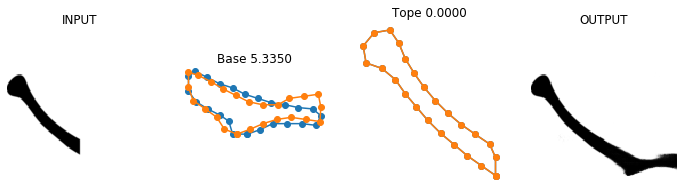

<Figure size 864x360 with 0 Axes>

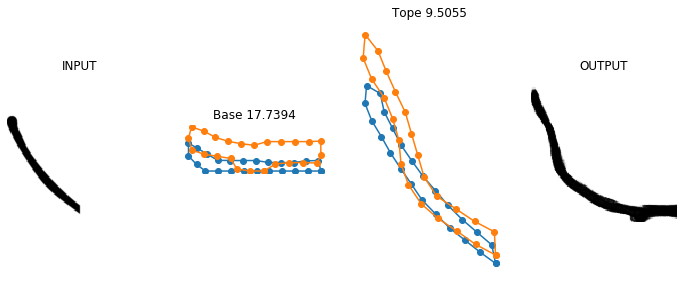

<Figure size 864x360 with 0 Axes>

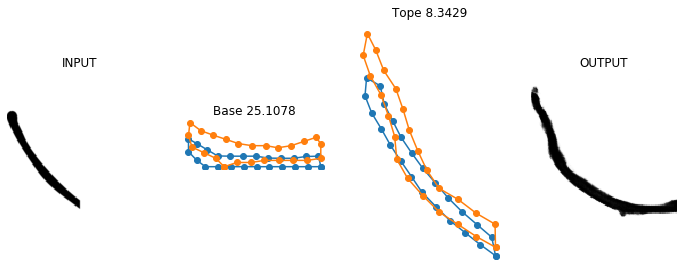

<Figure size 864x360 with 0 Axes>

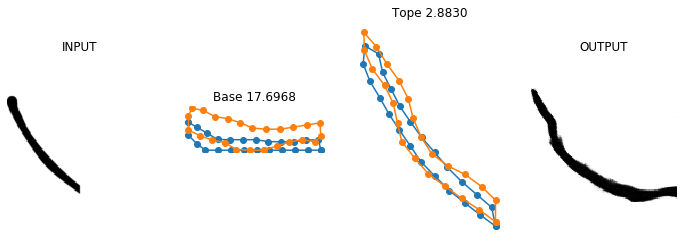

<Figure size 864x360 with 0 Axes>

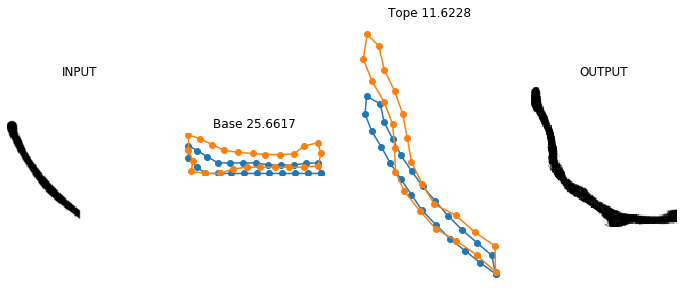

<Figure size 864x360 with 0 Axes>

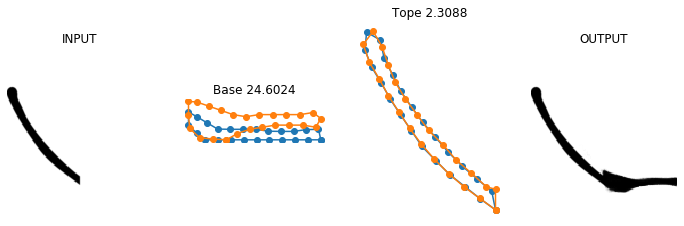

<Figure size 864x360 with 0 Axes>

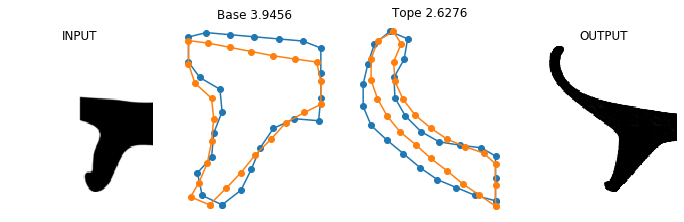

<Figure size 864x360 with 0 Axes>

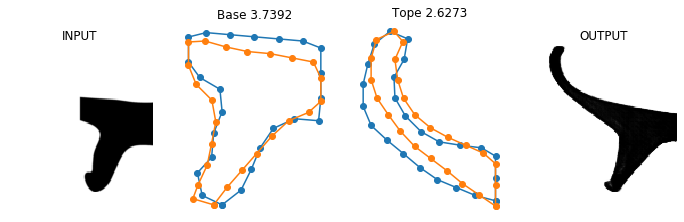

<Figure size 864x360 with 0 Axes>

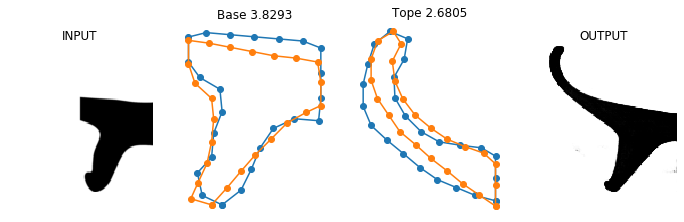

<Figure size 864x360 with 0 Axes>

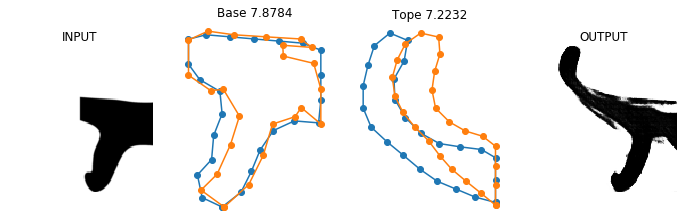

<Figure size 864x360 with 0 Axes>

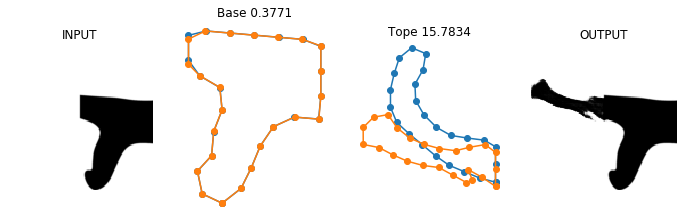

<Figure size 864x360 with 0 Axes>

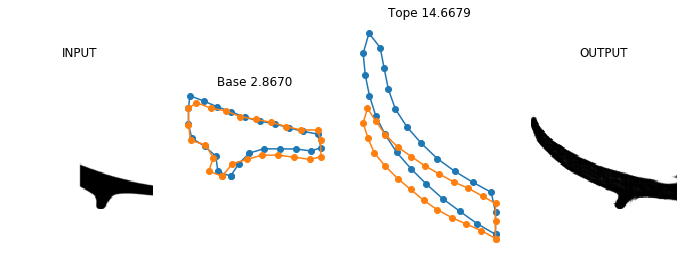

<Figure size 864x360 with 0 Axes>

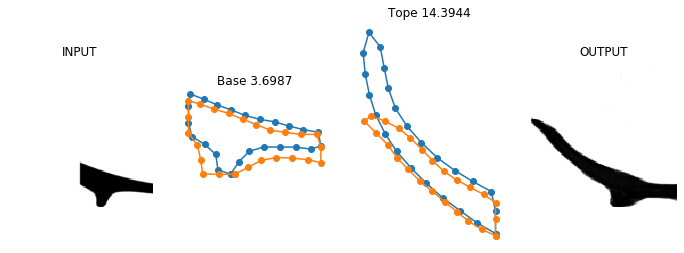

<Figure size 864x360 with 0 Axes>

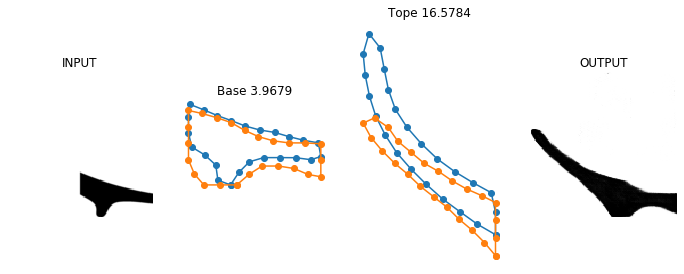

<Figure size 864x360 with 0 Axes>

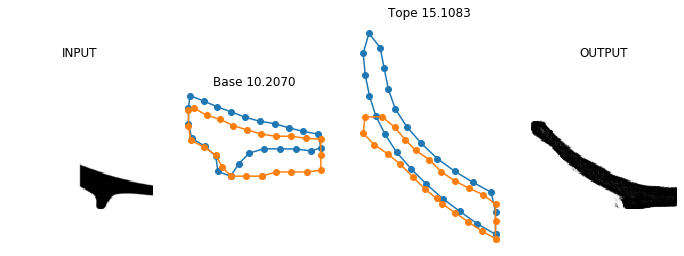

<Figure size 864x360 with 0 Axes>

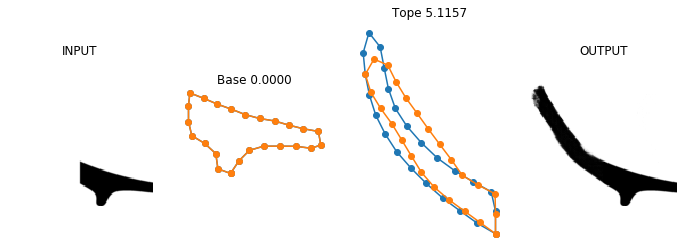

<Figure size 864x360 with 0 Axes>

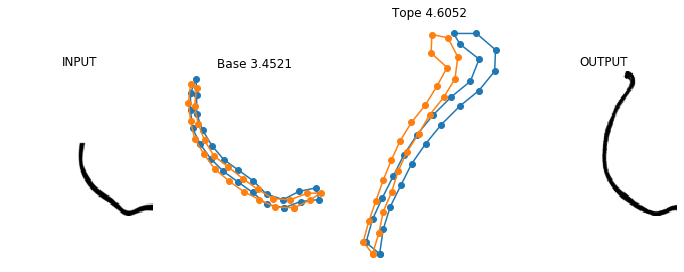

<Figure size 864x360 with 0 Axes>

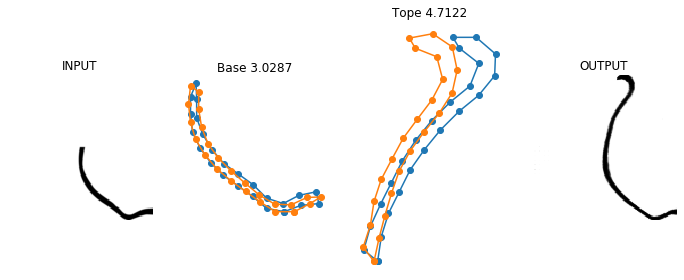

<Figure size 864x360 with 0 Axes>

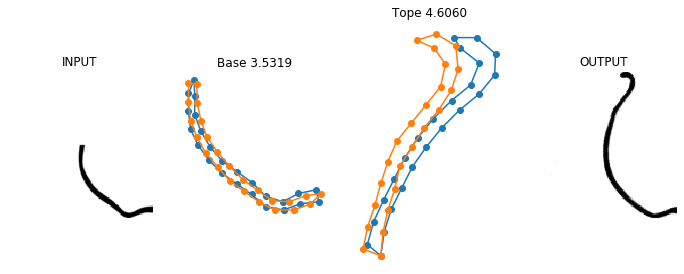

<Figure size 864x360 with 0 Axes>

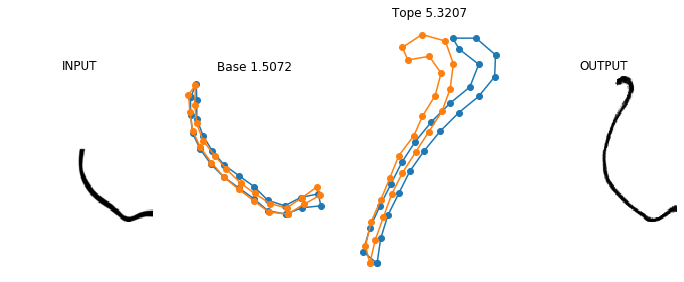

<Figure size 864x360 with 0 Axes>

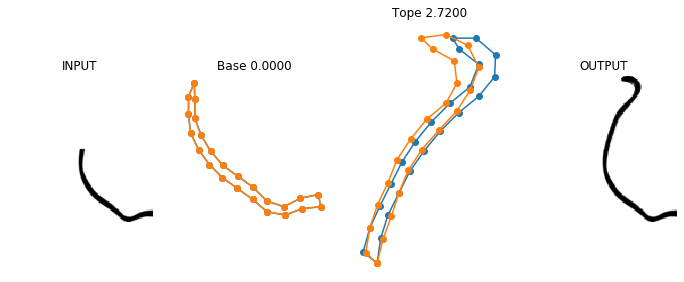

<Figure size 864x360 with 0 Axes>

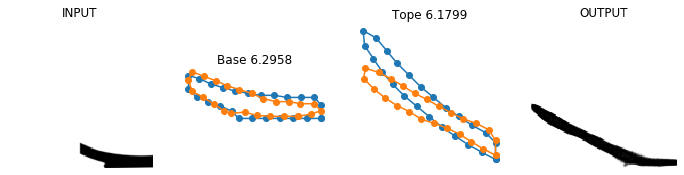

<Figure size 864x360 with 0 Axes>

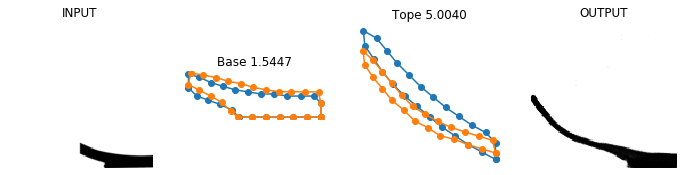

<Figure size 864x360 with 0 Axes>

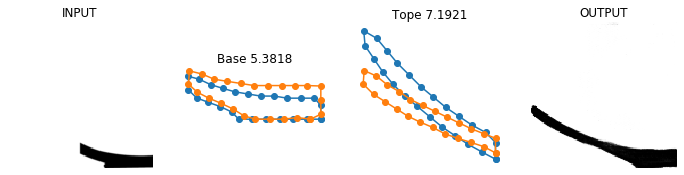

<Figure size 864x360 with 0 Axes>

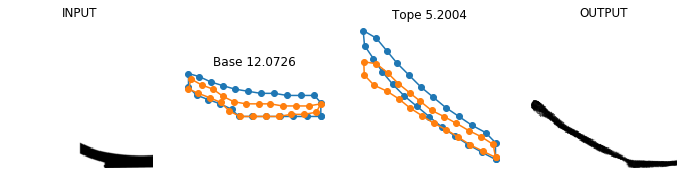

<Figure size 864x360 with 0 Axes>

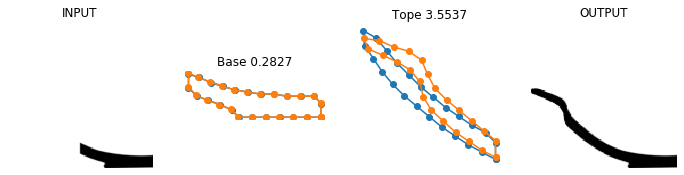

<Figure size 864x360 with 0 Axes>

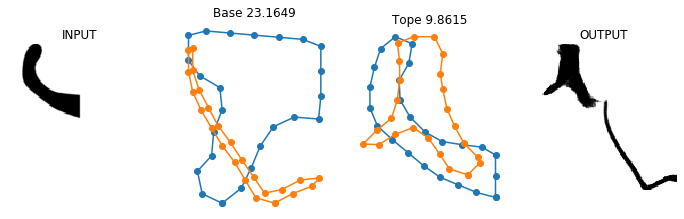

<Figure size 864x360 with 0 Axes>

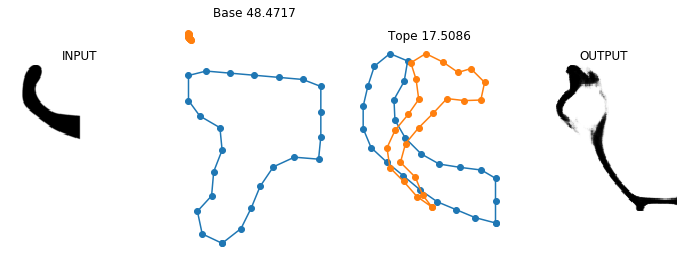

<Figure size 864x360 with 0 Axes>

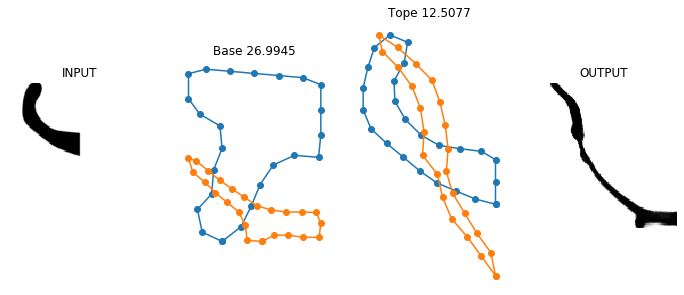

<Figure size 864x360 with 0 Axes>

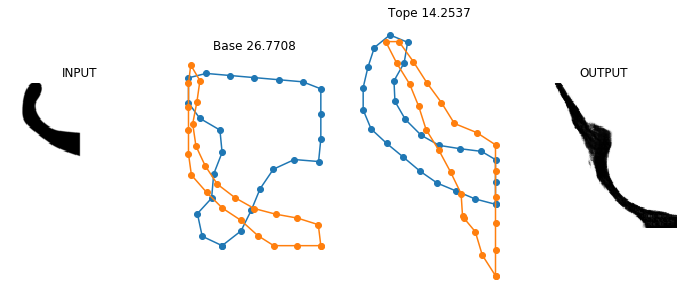

<Figure size 864x360 with 0 Axes>

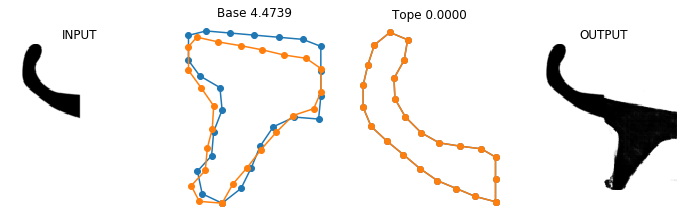

<Figure size 864x360 with 0 Axes>

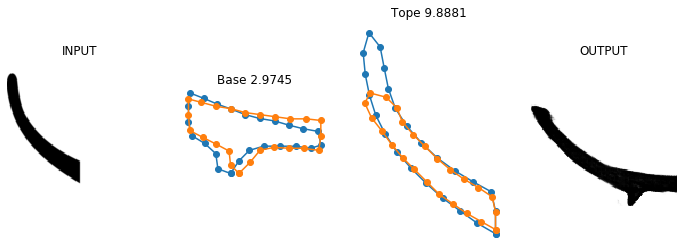

<Figure size 864x360 with 0 Axes>

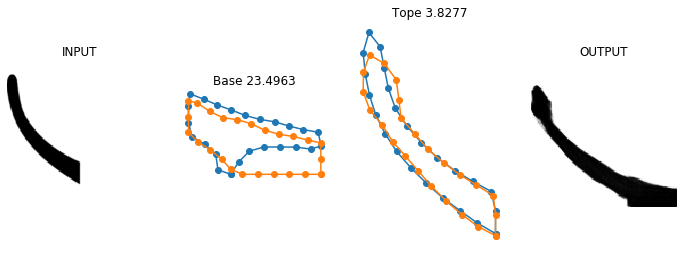

<Figure size 864x360 with 0 Axes>

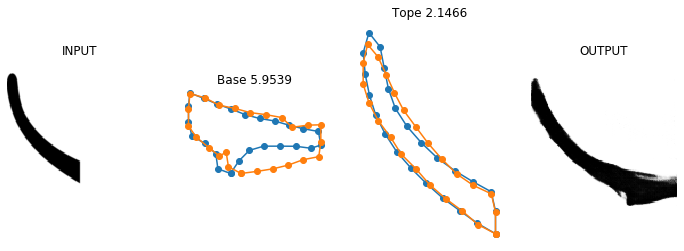

<Figure size 864x360 with 0 Axes>

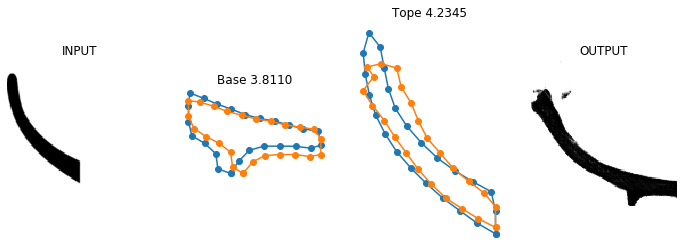

<Figure size 864x360 with 0 Axes>

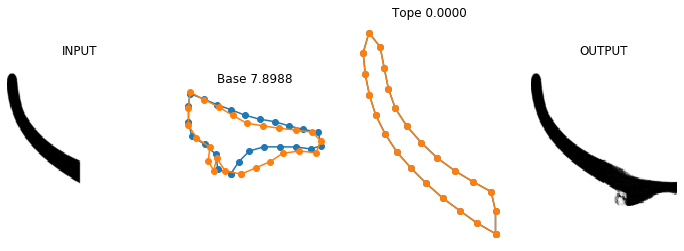

<Figure size 864x360 with 0 Axes>

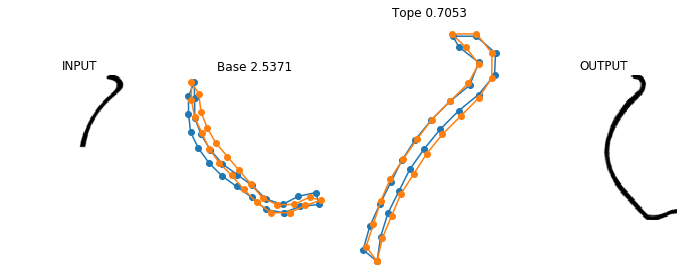

<Figure size 864x360 with 0 Axes>

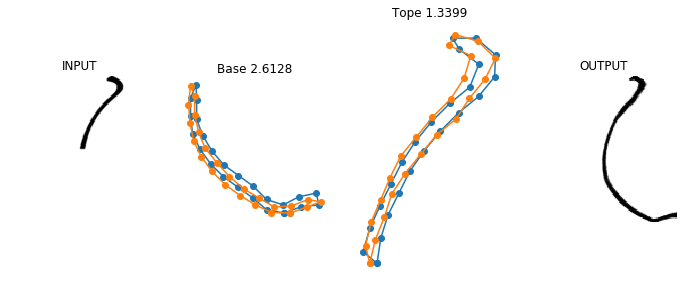

<Figure size 864x360 with 0 Axes>

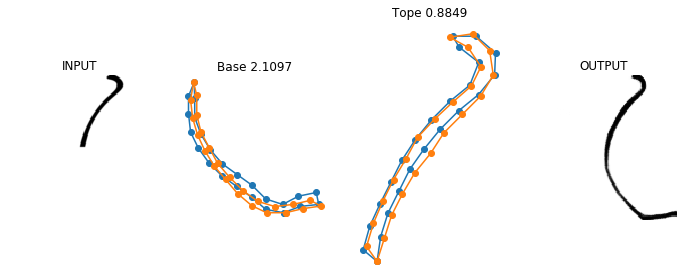

<Figure size 864x360 with 0 Axes>

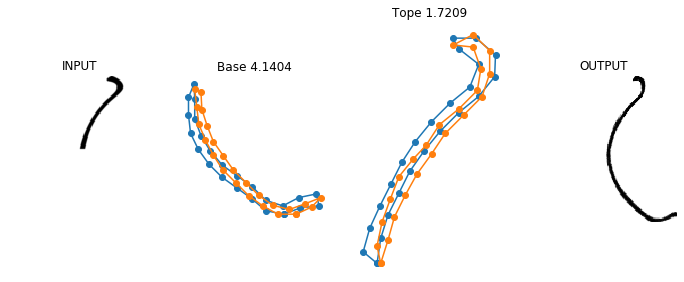

<Figure size 864x360 with 0 Axes>

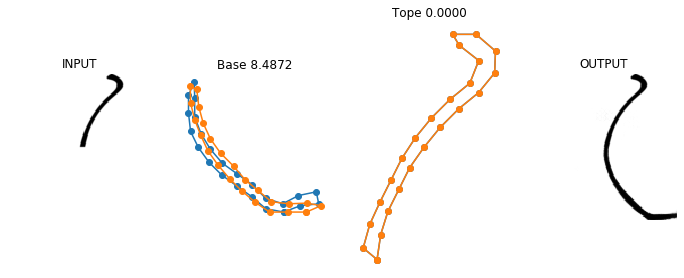

<Figure size 864x360 with 0 Axes>

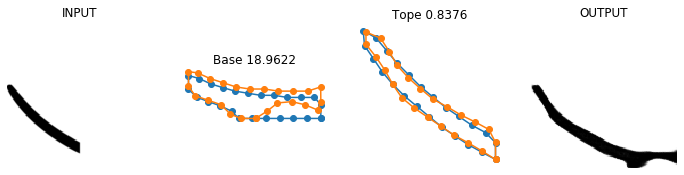

<Figure size 864x360 with 0 Axes>

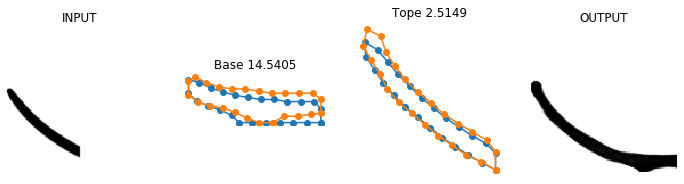

<Figure size 864x360 with 0 Axes>

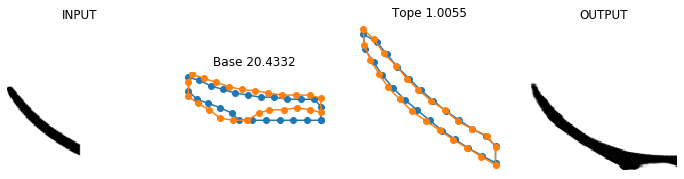

<Figure size 864x360 with 0 Axes>

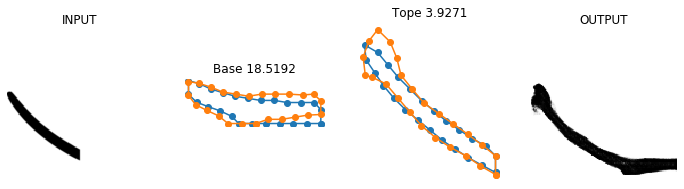

<Figure size 864x360 with 0 Axes>

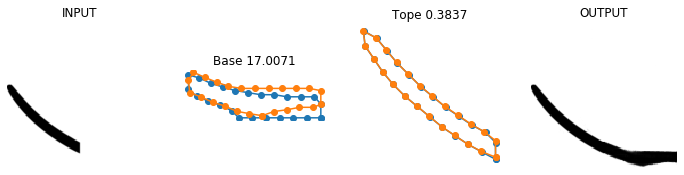

<Figure size 864x360 with 0 Axes>

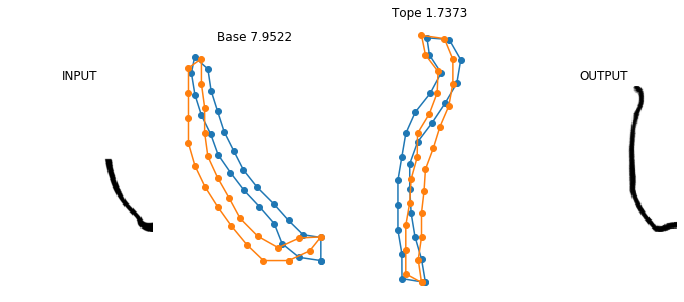

<Figure size 864x360 with 0 Axes>

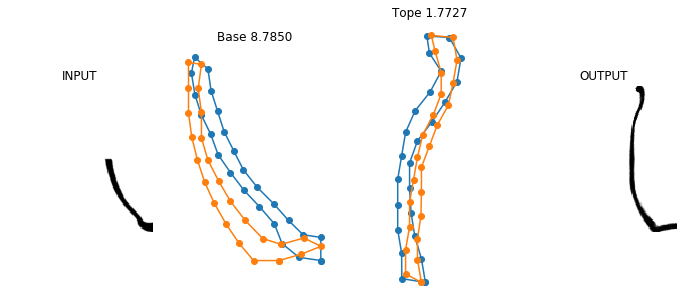

<Figure size 864x360 with 0 Axes>

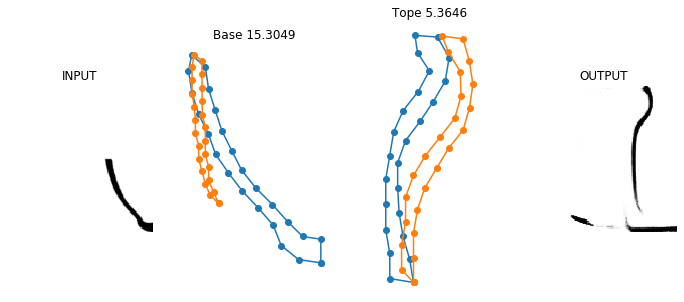

<Figure size 864x360 with 0 Axes>

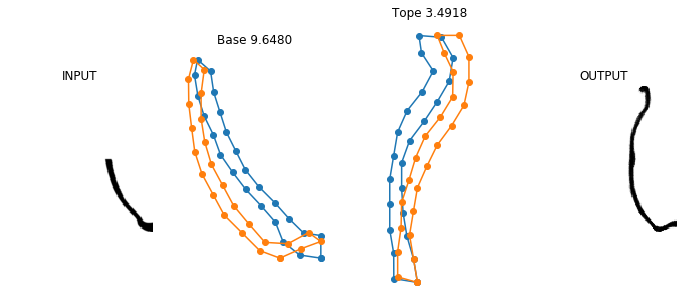

<Figure size 864x360 with 0 Axes>

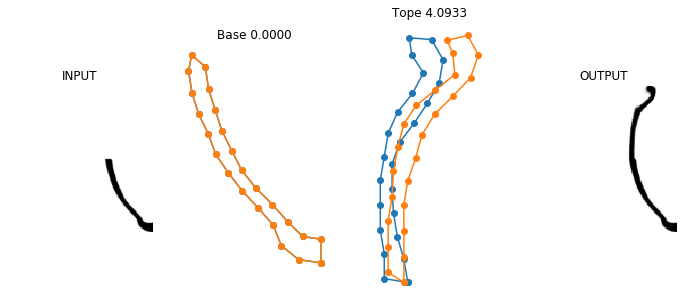

<Figure size 864x360 with 0 Axes>

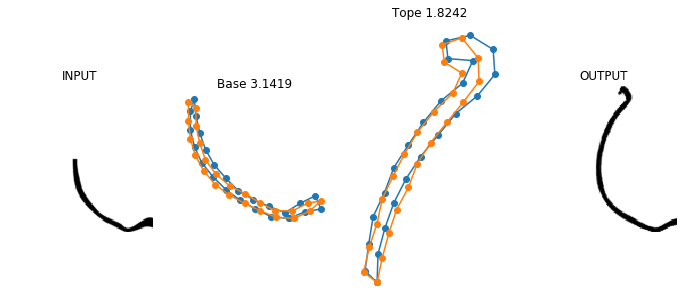

<Figure size 864x360 with 0 Axes>

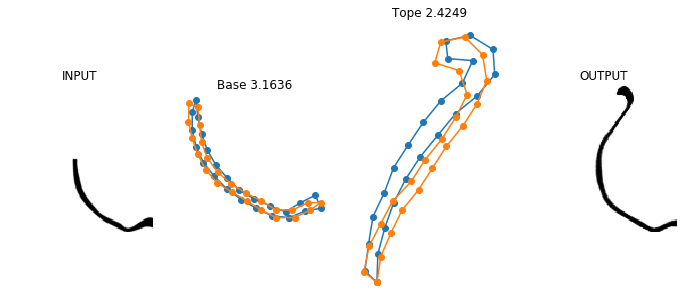

<Figure size 864x360 with 0 Axes>

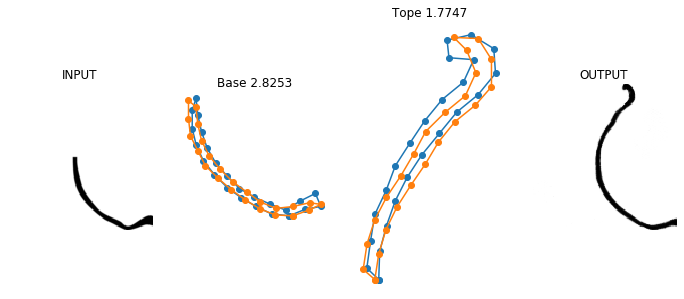

<Figure size 864x360 with 0 Axes>

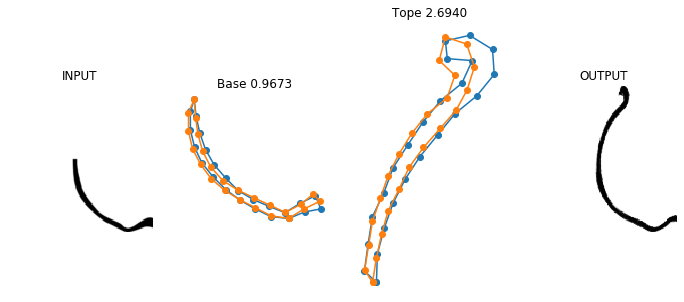

<Figure size 864x360 with 0 Axes>

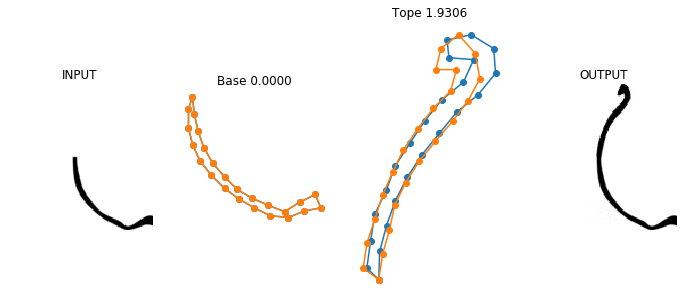

<Figure size 864x360 with 0 Axes>

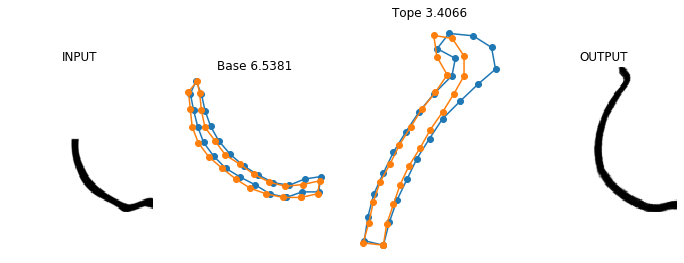

<Figure size 864x360 with 0 Axes>

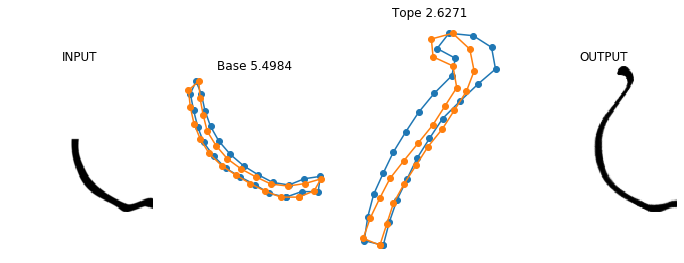

<Figure size 864x360 with 0 Axes>

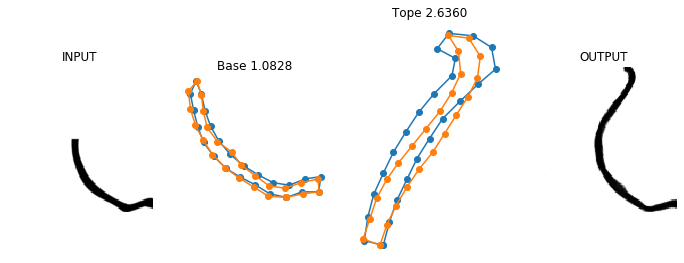

<Figure size 864x360 with 0 Axes>

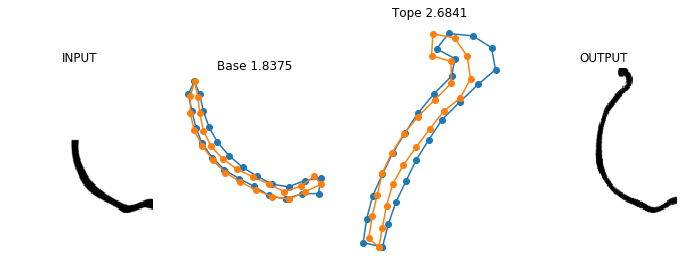

<Figure size 864x360 with 0 Axes>

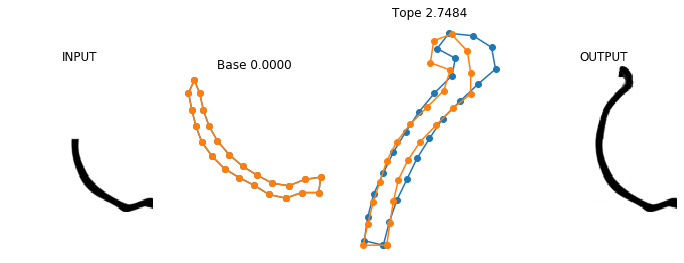

<Figure size 864x360 with 0 Axes>

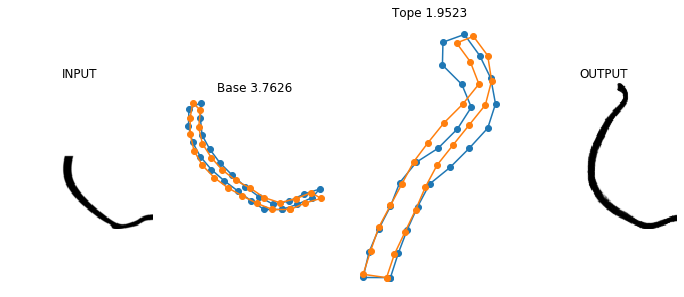

<Figure size 864x360 with 0 Axes>

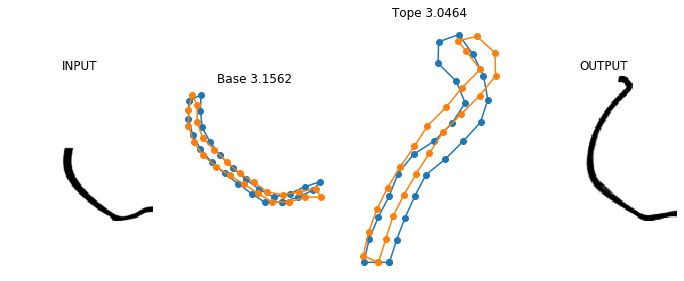

<Figure size 864x360 with 0 Axes>

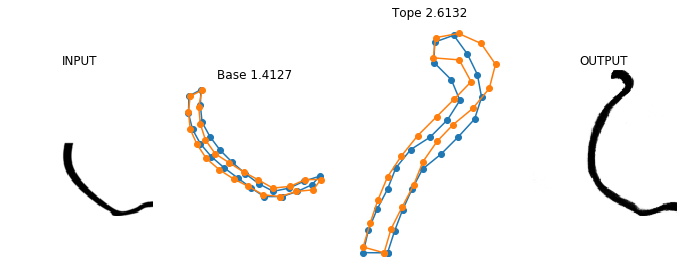

<Figure size 864x360 with 0 Axes>

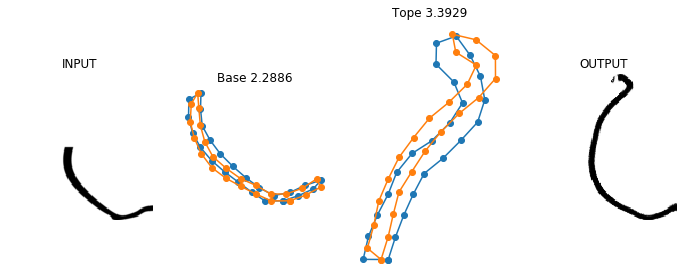

<Figure size 864x360 with 0 Axes>

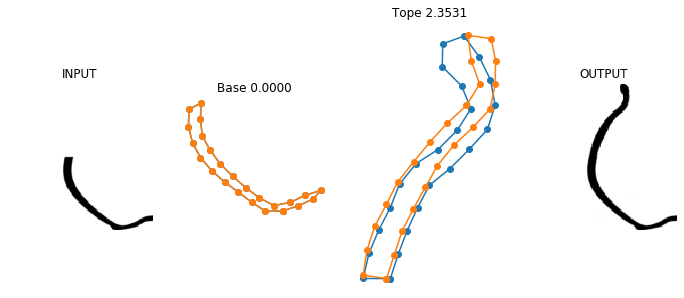

In [12]:
for i in range(100):
    for r in ['v1', 'v6c', 'v6', 'v8', 'v9']:
        #true_mean_landmarks_img_1_part_1, true_mean_landmarks_img_2_part_1, true_mean_landmarks_img_1_part_2, true_mean_landmarks_img_2_part_2 =  evaluate('image_{}'.format(i), r , vertical=horizontal[i])
        #false_mean_landmarks_img_1_part_1, false_mean_landmarks_img_2_part_1, false_mean_landmarks_img_1_part_2, false_mean_landmarks_img_2_part_2 =  evaluate('image_{}'.format(i), r , vertical=horizontal[i])
        evaluate('image_{}'.format(i), r , vertical=horizontal[i])
    

In [19]:
for i, r in enumerate(['v1', 'v6c', 'v6', 'v8', 'v9']):
    images = []
    for indx in np.random.randint(1, 99, size=4):
        file = glob.glob('land_fig/image_{}_{}.png'.format(indx, r))[0]
        image1 = Image.open(file)
        image1 = image1.resize((2850, 1255))
        images.append(image1)

    new_image = Image.new('RGB',(image1.size[0], len(images)*image1.size[1]), (250,250,250))
    new_image.paste(images[0], (0, 0))
    for j in range(1, len(images)):
        new_image.paste(images[j], (0, image1.size[1]*j))
        
    new_image.save("land_image_b_{}.jpg".format(r),"JPEG")

In [14]:
images

[<PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2850x1044 at 0x7FE6B9032128>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2850x729 at 0x7FE6B91A8CC0>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2850x739 at 0x7FE6B76EE278>,
 <PIL.PngImagePlugin.PngImageFile image mode=RGBA size=2850x1255 at 0x7FE6B8BEBBE0>]